# Introduction
**Who this notebook is for**  
This notebook is for anyone interested in creating a baseline model using Tensor Processing Units (TPUs) and begin making submissions to the **[Cassava Leaf Disease Classification competition](https://www.kaggle.com/c/cassava-leaf-disease-classification)**. If you've taken the **[Kaggle Intro to Deep Learning](https://www.kaggle.com/learn/intro-to-deep-learning)** and//or the **[Kaggle Computer Vision](https://www.kaggle.com/learn/computer-vision)** course you'll find this notebook to be a good starting place to bridge what you've learned in our micro-courses and applying that knowledge to get started in a competition.  

**How to use this notebook**  
Feel free to use this notebook as a walkthrough on how to build a preliminary image classification model using TensorFlow and Tensor Processing Units (TPUs). You can copy and edit the notebook by clicking on the corresponding button in the top right, which will make your own personal copy of the notebook in your Kaggle account. From there any edits you make will be unique to your own copy of the notebook!


**TPUs with TensorFlow**  
We'll be using TensorFlow and Keras to build our computer vision model, and using TPUs to both train our model and make predictions. If you'd like to learn about more about TPUs be sure to check out our **[Learn With Me: Getting Started with Tensor Processing Units (TPUs)](https://youtu.be/1pdwRQ1DQfY)** video.  

**References**  
This notebook was built using the following amazing resources created by Kagglers:
- **Martin Gorner:** [Getting Started With 100 Flowers on TPU](https://www.kaggle.com/mgornergoogle/getting-started-with-100-flowers-on-tpu)
- **Amy Jang:** [TensorFlow + Transfer Learning: Melanoma](https://www.kaggle.com/amyjang/tensorflow-transfer-learning-melanoma)
- **Phil Culliton:** [A Simple TF 2.1 Notebook](https://www.kaggle.com/philculliton/a-simple-tf-2-1-notebook)

# Tensor Processing Units (TPUs)

Tensor Processing Units (TPUs) are hardware accelerators that are specialized for deep learning tasks. All Kagglers have 30 hours of free TPU time each week, and can use up to 3 hours in a single session (although if you'd like to increase your TPU quota consider submitting an exemplary TPU notebook to our **[TPU Star program](https://www.kaggle.com/tpu-prize)**!)   

You can read through the Kaggle documentation on TPUs **[here](https://www.kaggle.com/docs/tpu)**, and check out the TPU Star notebooks **[here](https://www.kaggle.com/tpu-stars)**.

# Set up environment

In [1]:
import math, re, os
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from kaggle_datasets import KaggleDatasets
from tensorflow import keras
from functools import partial
from sklearn.model_selection import train_test_split
print("Tensorflow version " + tf.__version__)

E0000 00:00:1756290527.023654      74 common_lib.cc:612] Could not set metric server port: INVALID_ARGUMENT: Could not find SliceBuilder port 8471 in any of the 0 ports provided in `tpu_process_addresses`="local"
=== Source Location Trace: === 
learning/45eac/tfrc/runtime/common_lib.cc:230


Tensorflow version 2.18.0


# Detect TPU
What we're doing with our code here is making sure that we'll be sending our data across a TPU. What you're looking for is a printout of `Number of replicas: 8`, corresponding to the 8 cores of a TPU. If your printout instead says `Number of replicas: 1` you likely do not have TPUs enabled in your notebook.   

To enable TPUs navigate to the panel on the right and click on `Accelerator`. Choose TPU from the dropdown.  

If you'd like more TPU troubleshooting and optimization guidelines check out our **[Learn With Me: Troubleshooting and Optimizing TPUs video](https://youtu.be/BSeWHzjMHMU)**.  

In [2]:
try:
    # tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu = "local")
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    # strategy = tf.distribute.experimental.TPUStrategy(tpu)
    strategy = tf.distribute.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()
print('Number of replicas:', strategy.num_replicas_in_sync)

Device: 
INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.


INFO:tensorflow:Initializing the TPU system: local


I0000 00:00:1756290550.473637      74 service.cc:148] XLA service 0x55bfa97432a0 initialized for platform TPU (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1756290550.473672      74 service.cc:156]   StreamExecutor device (0): TPU, 2a886c8
I0000 00:00:1756290550.473676      74 service.cc:156]   StreamExecutor device (1): TPU, 2a886c8
I0000 00:00:1756290550.473679      74 service.cc:156]   StreamExecutor device (2): TPU, 2a886c8
I0000 00:00:1756290550.473682      74 service.cc:156]   StreamExecutor device (3): TPU, 2a886c8
I0000 00:00:1756290550.473685      74 service.cc:156]   StreamExecutor device (4): TPU, 2a886c8
I0000 00:00:1756290550.473687      74 service.cc:156]   StreamExecutor device (5): TPU, 2a886c8
I0000 00:00:1756290550.473690      74 service.cc:156]   StreamExecutor device (6): TPU, 2a886c8
I0000 00:00:1756290550.473693      74 service.cc:156]   StreamExecutor de

vice (7): TPU, 2a886c8


INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


Number of replicas: 8


# Set up variables
We'll set up some of our variables for our notebook here. 

If by chance you're using a private dataset, you'll also want to make sure that you have the **Google Cloud Software Development Kit (SDK)** attached to your notebook. You can find the Google Cloud SDK under the `Add-ons` dropdown menu at the top of your notebook. Documentation for the **Google Cloud Software Development Kit (SDK)** can be found **[here](https://www.kaggle.com/product-feedback/163416)**.

In [3]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
GCS_PATH = KaggleDatasets().get_gcs_path()
BATCH_SIZE = 16 * strategy.num_replicas_in_sync
IMAGE_SIZE = [512, 512]
CLASSES = ['0', '1', '2', '3', '4']
EPOCHS = 15

get_gcs_path is not required on TPU VMs which can directly use Kaggle datasets, using path: /kaggle/input/cassava-leaf-disease-classification


# Load the data
If you've primarily worked with notebooks in Learn, you've maybe noticed that data import and formatting is taken care of for you. But because we're working with competition data we'll have to handle this part of the pipeline ourselves.   

The data we're working with have been formatted into `TFRecords`, which are a format for storing a sequence of binary records. `TFRecords` work _really_ well with TPUs, and allow us to send a small number of large files across the TPU for processing.   

If you'd like to learn more about `TFRecords` and maybe even try creating them yourself, check out this **[TFRecords Basics notebook](https://www.kaggle.com/ryanholbrook/tfrecords-basics)** and **[corresponding video](https://youtu.be/KgjaC9VeOi8)** from Kaggle Data Scientist Ryan Holbrook.  

Because our data consists of `training` and `test` images only, we're going to split our `training` data into `training` and `validation` data using the `train_test_split()` function. 

## Decode the data
In the code chunk below we'll set up a series of functions that allow us to convert our images into tensors so that we can utilize them in our model. We'll also normalize our data. Our images are using a "Red, Blue, Green (RBG)" scale that has a range of [0, 255], and by normalizing it we'll set each pixel's value to a number in the range of [0, 1]. 

In [4]:
def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

If you think back to **[Intro to Machine Learning](https://www.kaggle.com/learn/intro-to-machine-learning)** you might remember how we set up variables like `X` and `y`, representing our `features`, `X`, and `prediction target`, `y`. This code is accomplishing something similar, although instead of using the labels `X` and `y`, our `features` are represented by the term `image` and our `prediction target` by the term `target`.  

You might also notice that this function accounts for unlabeled images. This is because our test image doesn't have any labels.  

In [5]:
def read_tfrecord(example, labeled):
    tfrecord_format = {
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.int64)
    } if labeled else {
        "image": tf.io.FixedLenFeature([], tf.string),
        "image_name": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    if labeled:
        label = tf.cast(example['target'], tf.int32)
        return image, label
    idnum = example['image_name']
    return image, idnum

We'll use the following function to load our dataset. One of the advantages of a TPU is that we can run multiple files across the TPU at once, and this accounts for the speed advantages of using a TPU. To capitalize on that, we want to make sure that we're using data as soon as it streams in, rather than creating a data streaming bottleneck.

In [6]:
def load_dataset(filenames, labeled=True, ordered=False):
    ignore_order = tf.data.Options()
    if not ordered:
        ignore_order.experimental_deterministic = False # disable order, increase speed
    dataset = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTOTUNE) # automatically interleaves reads from multiple files
    dataset = dataset.with_options(ignore_order) # uses data as soon as it streams in, rather than in its original order
    dataset = dataset.map(partial(read_tfrecord, labeled=labeled), num_parallel_calls=AUTOTUNE)
    return dataset

## A note on using train_test_split()
While I used `train_test_split()` to create both a `training` and `validation` dataset, consider exploring **[cross validation instead](https://www.kaggle.com/dansbecker/cross-validation)**.

In [7]:
TRAINING_FILENAMES, VALID_FILENAMES = train_test_split(
    tf.io.gfile.glob(GCS_PATH + '/train_tfrecords/ld_train*.tfrec'),
    test_size=0.35, random_state=5
)

TEST_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/test_tfrecords/ld_test*.tfrec')

## Adding in augmentations 
You learned about augmentations in the **[Computer Vision: Data Augmentation](https://www.kaggle.com/ryanholbrook/data-augmentation)** lesson on Kaggle Learn, and here I've applied an augmentation available to us through TensorFlow. You can read more about these augmentations (as well as all of the other augmentations available to you!) in the **[TensorFlow tf.image documentation](https://www.tensorflow.org/api_docs/python/tf/image)**.  

If you're interested in learning how to create and use custom augmentations, check out these **[Rotation Augmentation GPU/TPU](https://www.kaggle.com/cdeotte/rotation-augmentation-gpu-tpu-0-96)** and **[CutMix and MixUp on GPU/TPU](https://www.kaggle.com/cdeotte/cutmix-and-mixup-on-gpu-tpu)** from Kaggle Grandmaster Chris Deotte.

In [8]:
def data_augment(image, label):
    # Thanks to the dataset.prefetch(AUTO) statement in the following function this happens essentially for free on TPU. 
    # Data pipeline code is executed on the "CPU" part of the TPU while the TPU itself is computing gradients.
    image = tf.image.random_flip_left_right(image)
    return image, label

## Define data loading methods
The following functions will be used to load our `training`, `validation`, and `test` datasets, as well as print out the number of images in each dataset.

In [9]:
def get_training_dataset():
    dataset = load_dataset(TRAINING_FILENAMES, labeled=True)  
    dataset = dataset.map(data_augment, num_parallel_calls=AUTOTUNE)  
    dataset = dataset.repeat()
    dataset = dataset.shuffle(2048)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTOTUNE)
    return dataset

In [10]:
def get_validation_dataset(ordered=False):
    dataset = load_dataset(VALID_FILENAMES, labeled=True, ordered=ordered) 
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.cache()
    dataset = dataset.prefetch(AUTOTUNE)
    return dataset

In [11]:
def get_test_dataset(ordered=False):
    dataset = load_dataset(TEST_FILENAMES, labeled=False, ordered=ordered)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTOTUNE)
    return dataset

In [12]:
def count_data_items(filenames):
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)

In [13]:
NUM_TRAINING_IMAGES = count_data_items(TRAINING_FILENAMES)
NUM_VALIDATION_IMAGES = count_data_items(VALID_FILENAMES)
NUM_TEST_IMAGES = count_data_items(TEST_FILENAMES)

print('Dataset: {} training images, {} validation images, {} (unlabeled) test images'.format(
    NUM_TRAINING_IMAGES, NUM_VALIDATION_IMAGES, NUM_TEST_IMAGES))

Dataset: 13369 training images, 8028 validation images, 1 (unlabeled) test images


# Brief exploratory data analysis (EDA)
First we'll print out the shapes and labels for a sample of each of our three datasets:

In [14]:
print("Training data shapes:")
for image, label in get_training_dataset().take(3):
    print(image.numpy().shape, label.numpy().shape)
print("Training data label examples:", label.numpy())
print("Validation data shapes:")
for image, label in get_validation_dataset().take(3):
    print(image.numpy().shape, label.numpy().shape)
print("Validation data label examples:", label.numpy())
print("Test data shapes:")
for image, idnum in get_test_dataset().take(3):
    print(image.numpy().shape, idnum.numpy().shape)
print("Test data IDs:", idnum.numpy().astype('U')) # U=unicode string

Training data shapes:


(128, 512, 512, 3) (128,)


(128, 512, 512, 3) (128,)


(128, 512, 512, 3) (128,)


Training data label examples: [3 3 1 3 3 3 2 3 3 4 2 3 3 1 3 3 1 3 3 3 3 3 4 3 3 4 3 3 2 4 1 4 3 4 2 3 3
 3 3 3 3 4 1 3 3 3 3 3 4 2 2 3 0 3 3 3 4 1 3 0 1 3 3 3 2 2 3 3 3 0 3 1 3 3
 3 2 3 3 3 3 0 3 1 1 3 4 2 3 2 3 3 4 3 3 3 3 3 2 4 3 3 3 0 3 3 3 3 3 1 1 1
 1 2 2 3 3 3 1 3 3 0 3 3 3 3 1 3 3]
Validation data shapes:


(128, 512, 512, 3) (128,)


(128, 512, 512, 3) (128,)


(128, 512, 512, 3) (128,)


Validation data label examples: [3 0 3 3 1 3 3 4 2 2 1 3 3 3 0 4 1 3 4 3 0 4 3 4 3 3 3 4 3 3 3 3 3 3 4 3 4
 3 1 3 0 1 3 1 4 0 4 3 3 1 3 3 3 3 3 3 4 3 3 3 4 3 1 0 3 2 3 3 3 3 1 3 3 3
 3 3 4 3 3 4 2 2 3 2 2 1 3 3 3 3 0 3 3 3 1 1 2 3 3 3 0 3 3 3 3 3 3 1 4 3 1
 2 1 3 3 4 2 2 3 3 2 3 3 1 4 3 4 3]
Test data shapes:


(1, 512, 512, 3) (1,)


Test data IDs: ['2216849948.jpg']


The following code chunk sets up a series of functions that will print out a grid of images. The grid of images will contain images and their corresponding labels.

In [15]:
# numpy and matplotlib defaults
np.set_printoptions(threshold=15, linewidth=80)

def batch_to_numpy_images_and_labels(data):
    images, labels = data
    numpy_images = images.numpy()
    numpy_labels = labels.numpy()
    if numpy_labels.dtype == object: # binary string in this case, these are image ID strings
        numpy_labels = [None for _ in enumerate(numpy_images)]
    # If no labels, only image IDs, return None for labels (this is the case for test data)
    return numpy_images, numpy_labels

def title_from_label_and_target(label, correct_label):
    if correct_label is None:
        return CLASSES[label], True
    correct = (label == correct_label)
    return "{} [{}{}{}]".format(CLASSES[label], 'OK' if correct else 'NO', u"\u2192" if not correct else '',
                                CLASSES[correct_label] if not correct else ''), correct

def display_one_plant(image, title, subplot, red=False, titlesize=16):
    plt.subplot(*subplot)
    plt.axis('off')
    plt.imshow(image)
    if len(title) > 0:
        plt.title(title, fontsize=int(titlesize) if not red else int(titlesize/1.2), color='red' if red else 'black', fontdict={'verticalalignment':'center'}, pad=int(titlesize/1.5))
    return (subplot[0], subplot[1], subplot[2]+1)

def display_batch_of_images(databatch, predictions=None):
    """This will work with:
    display_batch_of_images(images)
    display_batch_of_images(images, predictions)
    display_batch_of_images((images, labels))
    display_batch_of_images((images, labels), predictions)
    """
    # data
    images, labels = batch_to_numpy_images_and_labels(databatch)
    if labels is None:
        labels = [None for _ in enumerate(images)]
        
    # auto-squaring: this will drop data that does not fit into square or square-ish rectangle
    rows = int(math.sqrt(len(images)))
    cols = len(images)//rows
        
    # size and spacing
    FIGSIZE = 13.0
    SPACING = 0.1
    subplot=(rows,cols,1)
    if rows < cols:
        plt.figure(figsize=(FIGSIZE,FIGSIZE/cols*rows))
    else:
        plt.figure(figsize=(FIGSIZE/rows*cols,FIGSIZE))
    
    # display
    for i, (image, label) in enumerate(zip(images[:rows*cols], labels[:rows*cols])):
        title = '' if label is None else CLASSES[label]
        correct = True
        if predictions is not None:
            title, correct = title_from_label_and_target(predictions[i], label)
        dynamic_titlesize = FIGSIZE*SPACING/max(rows,cols)*40+3 # magic formula tested to work from 1x1 to 10x10 images
        subplot = display_one_plant(image, title, subplot, not correct, titlesize=dynamic_titlesize)
    
    #layout
    plt.tight_layout()
    if label is None and predictions is None:
        plt.subplots_adjust(wspace=0, hspace=0)
    else:
        plt.subplots_adjust(wspace=SPACING, hspace=SPACING)
    plt.show()

In [16]:
# load our training dataset for EDA
training_dataset = get_training_dataset()
training_dataset = training_dataset.unbatch().batch(20)
train_batch = iter(training_dataset)

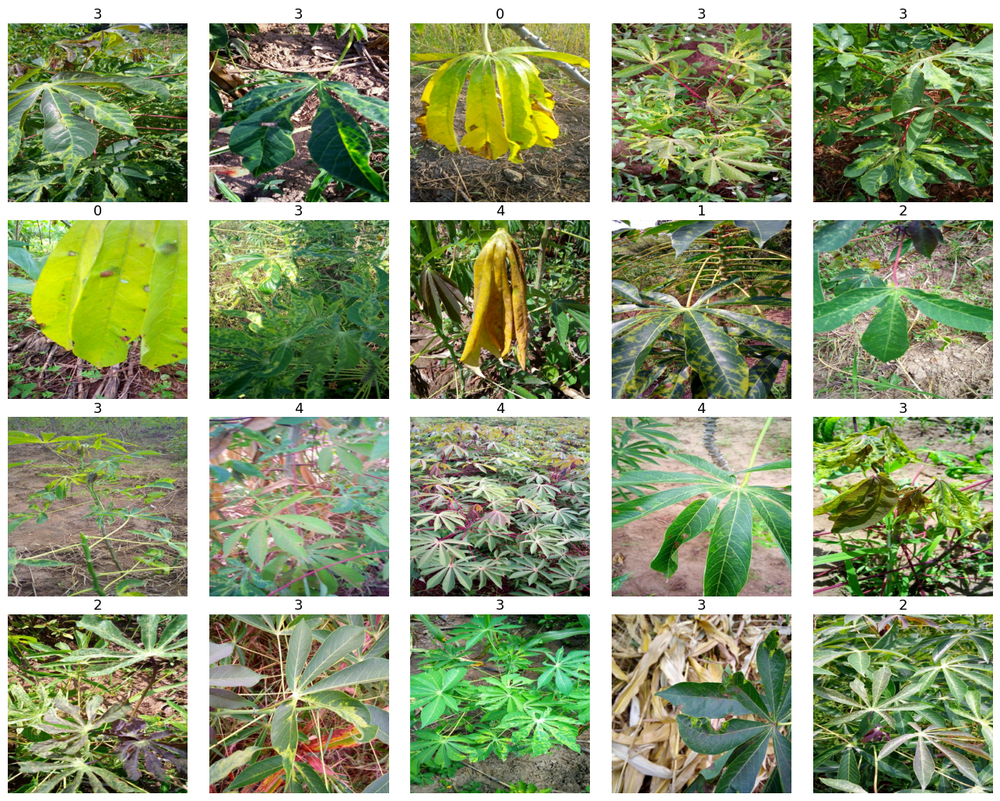

In [17]:
# run this cell again for another randomized set of training images
display_batch_of_images(next(train_batch))

You can also modify the above code to look at your `validation` and `test` data, like this:

In [18]:
# load our validation dataset for EDA
validation_dataset = get_validation_dataset()
validation_dataset = validation_dataset.unbatch().batch(20)
valid_batch = iter(validation_dataset)

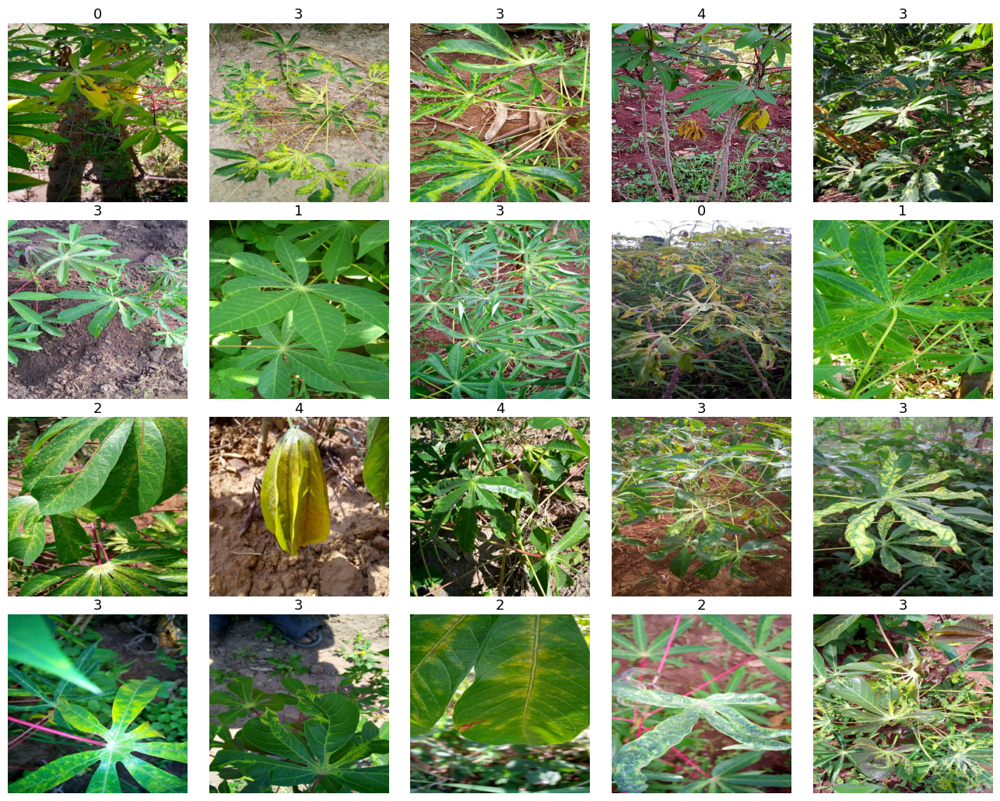

In [19]:
# run this cell again for another randomized set of training images
display_batch_of_images(next(valid_batch))

In [20]:
# load our test dataset for EDA
testing_dataset = get_test_dataset()
testing_dataset = testing_dataset.unbatch().batch(20)
test_batch = iter(testing_dataset)

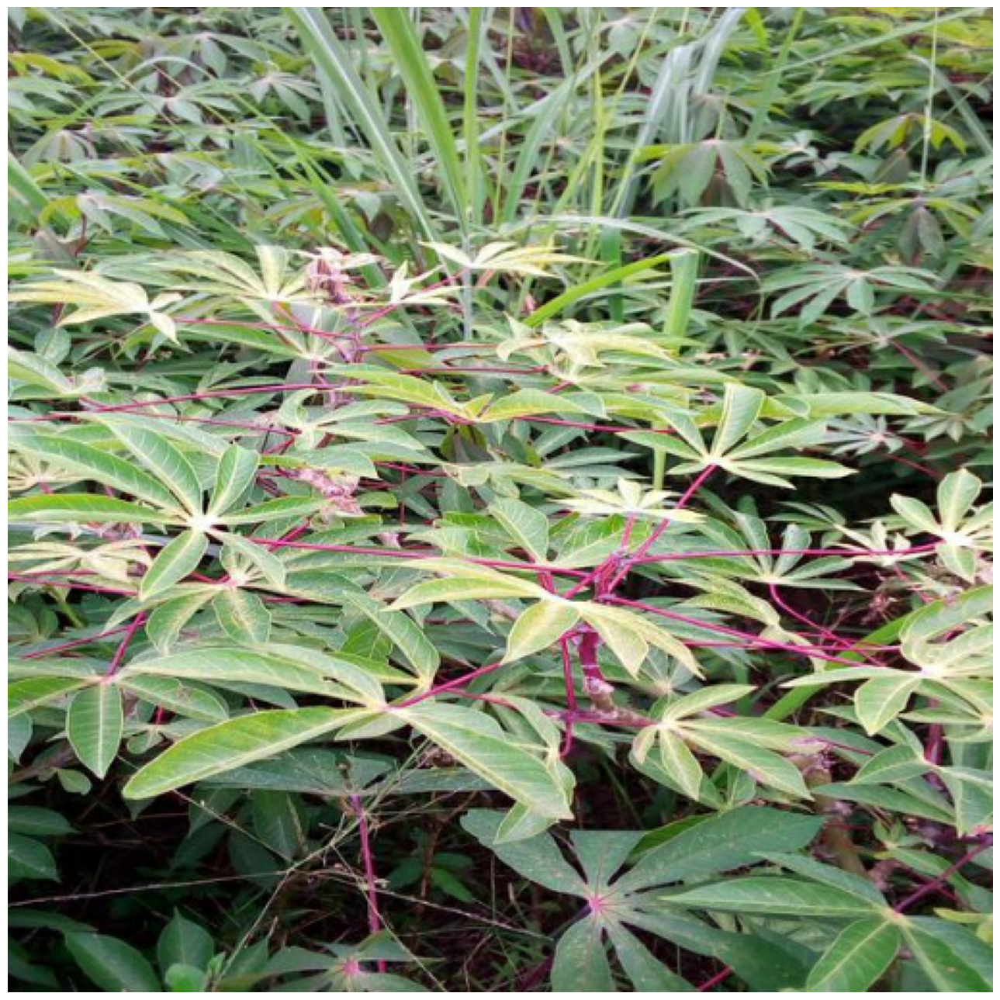

In [21]:
# we only have one test image
display_batch_of_images(next(test_batch))

# Building the model
## Learning rate schedule
We learned about learning rates in the **[Intro to Deep Learning: Stochastic Gradient Descent](https://www.kaggle.com/ryanholbrook/stochastic-gradient-descent)** lesson, and here I've created a learning rate schedule mostly using the defaults in the **[Keras Exponential Decay Learning Rate Scheduler](https://keras.io/api/optimizers/learning_rate_schedules/exponential_decay/)** documentation (I did change the `initial_learning_rate`. You can adjust the learning rate scheduler below, and read more about the other types of schedulers available to you in the **[Keras learning rate schedules API](https://keras.io/api/optimizers/learning_rate_schedules/)**.

In [22]:
lr_scheduler = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-5, 
    decay_steps=10000, 
    decay_rate=0.9)

## Building our model
In order to ensure that our model is trained on the TPU, we build it using `with strategy.scope()`.    

This model was built using transfer learning, meaning that we have a _pre-trained model_ (ResNet50) as our base model and then the customizable model built using `tf.keras.Sequential`. If you're new to transfer learning I recommend setting `base_model.trainable` to **False**, but _do_ encourage you to change which base model you're using (more options are available in the **[`tf.keras.applications` Module](https://www.tensorflow.org/api_docs/python/tf/keras/applications)** documentation) as well iterate on the custom model. 

Note that we're using `sparse_categorical_crossentropy` as our loss function, because we did _not_ one-hot encode our labels.

In [23]:
with strategy.scope():       
    img_adjust_layer = tf.keras.layers.Lambda(
    lambda x: tf.keras.applications.resnet50.preprocess_input(x * 255.0),
    input_shape=(*IMAGE_SIZE, 3),
    name='resnet50_preproc'
    )
    
    base_model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False)
    base_model.trainable = False
    
    model = tf.keras.Sequential([
        #tf.keras.layers.BatchNormalization(),
        img_adjust_layer,
        base_model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(8, activation='relu'),
        #tf.keras.layers.BatchNormalization(renorm=True),
        tf.keras.layers.Dense(len(CLASSES), activation='softmax')  
    ])
    
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=lr_scheduler, epsilon=0.001),
        loss='sparse_categorical_crossentropy',  
        metrics=['sparse_categorical_accuracy'])

/usr/local/lib/python3.10/site-packages/keras/src/layers/core/lambda_layer.py:65: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
I0000 00:00:1756290569.223222      74 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


       0/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step

   49152/94765736 ━━━━━━━━━━━━━━━━━━━━ 3:38 2us/step

   81920/94765736 ━━━━━━━━━━━━━━━━━━━━ 4:01 3us/step

  147456/94765736 ━━━━━━━━━━━━━━━━━━━━ 2:46 2us/step

  212992/94765736 ━━━━━━━━━━━━━━━━━━━━ 2:17 1us/step

  294912/94765736 ━━━━━━━━━━━━━━━━━━━━ 1:56 1us/step

  442368/94765736 ━━━━━━━━━━━━━━━━━━━━ 1:28 1us/step

  638976/94765736 ━━━━━━━━━━━━━━━━━━━━ 1:08 1us/step

  917504/94765736 ━━━━━━━━━━━━━━━━━━━━ 53s 1us/step 

 1359872/94765736 ━━━━━━━━━━━━━━━━━━━━ 39s 0us/step

 1949696/94765736 ━━━━━━━━━━━━━━━━━━━━ 29s 0us/step

 2891776/94765736 ━━━━━━━━━━━━━━━━━━━━ 21s 0us/step

 4153344/94765736 ━━━━━━━━━━━━━━━━━━━━ 15s 0us/step

 6119424/94765736 ━━━━━━━━━━━━━━━━━━━━ 11s 0us/step

 8470528/94765736 ━━━━━━━━━━━━━━━━━━━━ 8s 0us/step 

10829824/94765736 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step

12976128/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step

15286272/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step

17432576/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step

19972096/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step

22388736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

24543232/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

26779648/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

28909568/94765736 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

31440896/94765736 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

33964032/94765736 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

35913728/94765736 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

38420480/94765736 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

40353792/94765736 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

42909696/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

45457408/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

47562752/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

50126848/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

52240384/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

54353920/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

56909824/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

59015168/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

61562880/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

63684608/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

65806336/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

68362240/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

70492160/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

73031680/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

75145216/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

77275136/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

79806464/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

81928192/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

84475904/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

86605824/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

88719360/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

91258880/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

93396992/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


# Train the model
As our model is training you'll see a printout for each epoch, and can also monitor TPU usage by clicking on the TPU metrics in the toolbar at the top right of your notebook.

In [24]:
# load data
train_dataset = get_training_dataset()
valid_dataset = get_validation_dataset()

In [25]:
STEPS_PER_EPOCH = NUM_TRAINING_IMAGES // BATCH_SIZE
VALID_STEPS = NUM_VALIDATION_IMAGES // BATCH_SIZE

history = model.fit(train_dataset, 
                    steps_per_epoch=STEPS_PER_EPOCH, 
                    epochs=EPOCHS,
                    validation_data=valid_dataset,
                    validation_steps=VALID_STEPS)

Epoch 1/15


I0000 00:00:1756290596.813977      74 encapsulate_tpu_computations_pass.cc:266] Subgraph fingerprint:15056404983823954248


I0000 00:00:1756290600.514019     898 tpu_compilation_cache_interface.cc:442] TPU host compilation cache miss: cache_key(5216187712241139127), session_name()


I0000 00:00:1756290607.117641     898 tpu_compile_op_common.cc:245] Compilation of 5216187712241139127 with session name  took 6.603570909s and succeeded


I0000 00:00:1756290607.132684     898 tpu_compilation_cache_interface.cc:476] TPU host compilation cache: compilation complete for cache_key(5216187712241139127), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_data_15056404983823954248", property.function_library_fingerprint = 13948434392405207459, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topology.wrap().x = false, topology.wrap().y = false, topology.wrap().z = false, std::string(property.shapes_prefix) = "16,512,512,3,;16,;", property.guaranteed_constants_size = 0, embedding_partitions_fingerprint = "1688352644216761960")
I0000 00:00:1756290607.132734     898 tpu_compilation_cache_interface.cc:542] After adding entry for key 5216187712241139127 with session_name  cache is 1 entries (24867769 bytes),  marked for eviction 0 entries (0 bytes).


  1/104 ━━━━━━━━━━━━━━━━━━━━ 25:12 15s/step - loss: 2.0066 - sparse_categorical_accuracy: 0.0625

  2/104 ━━━━━━━━━━━━━━━━━━━━ 51s 508ms/step - loss: 2.0438 - sparse_categorical_accuracy: 0.0469

  3/104 ━━━━━━━━━━━━━━━━━━━━ 50s 501ms/step - loss: 2.0691 - sparse_categorical_accuracy: 0.0451

  4/104 ━━━━━━━━━━━━━━━━━━━━ 48s 486ms/step - loss: 2.0736 - sparse_categorical_accuracy: 0.0495

  5/104 ━━━━━━━━━━━━━━━━━━━━ 48s 485ms/step - loss: 2.0636 - sparse_categorical_accuracy: 0.0546

  6/104 ━━━━━━━━━━━━━━━━━━━━ 47s 489ms/step - loss: 2.0574 - sparse_categorical_accuracy: 0.0576

  7/104 ━━━━━━━━━━━━━━━━━━━━ 47s 486ms/step - loss: 2.0511 - sparse_categorical_accuracy: 0.0609

  8/104 ━━━━━━━━━━━━━━━━━━━━ 46s 485ms/step - loss: 2.0462 - sparse_categorical_accuracy: 0.0630

  9/104 ━━━━━━━━━━━━━━━━━━━━ 45s 480ms/step - loss: 2.0434 - sparse_categorical_accuracy: 0.0645

 10/104 ━━━━━━━━━━━━━━━━━━━━ 44s 478ms/step - loss: 2.0414 - sparse_categorical_accuracy: 0.0656

 11/104 ━━━━━━━━━━━━━━━━━━━━ 44s 478ms/step - loss: 2.0392 - sparse_categorical_accuracy: 0.0663

 12/104 ━━━━━━━━━━━━━━━━━━━━ 43s 474ms/step - loss: 2.0354 - sparse_categorical_accuracy: 0.0682

 13/104 ━━━━━━━━━━━━━━━━━━━━ 42s 470ms/step - loss: 2.0299 - sparse_categorical_accuracy: 0.0711

 14/104 ━━━━━━━━━━━━━━━━━━━━ 42s 468ms/step - loss: 2.0254 - sparse_categorical_accuracy: 0.0733

 15/104 ━━━━━━━━━━━━━━━━━━━━ 41s 465ms/step - loss: 2.0209 - sparse_categorical_accuracy: 0.0757

 16/104 ━━━━━━━━━━━━━━━━━━━━ 40s 466ms/step - loss: 2.0164 - sparse_categorical_accuracy: 0.0780

 17/104 ━━━━━━━━━━━━━━━━━━━━ 40s 465ms/step - loss: 2.0128 - sparse_categorical_accuracy: 0.0801

 18/104 ━━━━━━━━━━━━━━━━━━━━ 39s 463ms/step - loss: 2.0094 - sparse_categorical_accuracy: 0.0818

 19/104 ━━━━━━━━━━━━━━━━━━━━ 39s 462ms/step - loss: 2.0064 - sparse_categorical_accuracy: 0.0833

 20/104 ━━━━━━━━━━━━━━━━━━━━ 38s 461ms/step - loss: 2.0036 - sparse_categorical_accuracy: 0.0842

 21/104 ━━━━━━━━━━━━━━━━━━━━ 38s 461ms/step - loss: 2.0010 - sparse_categorical_accuracy: 0.0851

 22/104 ━━━━━━━━━━━━━━━━━━━━ 37s 460ms/step - loss: 1.9984 - sparse_categorical_accuracy: 0.0857

 23/104 ━━━━━━━━━━━━━━━━━━━━ 37s 460ms/step - loss: 1.9963 - sparse_categorical_accuracy: 0.0862

 24/104 ━━━━━━━━━━━━━━━━━━━━ 36s 459ms/step - loss: 1.9944 - sparse_categorical_accuracy: 0.0869

 25/104 ━━━━━━━━━━━━━━━━━━━━ 36s 459ms/step - loss: 1.9925 - sparse_categorical_accuracy: 0.0875

 26/104 ━━━━━━━━━━━━━━━━━━━━ 35s 459ms/step - loss: 1.9909 - sparse_categorical_accuracy: 0.0880

 27/104 ━━━━━━━━━━━━━━━━━━━━ 35s 457ms/step - loss: 1.9892 - sparse_categorical_accuracy: 0.0885

 28/104 ━━━━━━━━━━━━━━━━━━━━ 34s 457ms/step - loss: 1.9878 - sparse_categorical_accuracy: 0.0889

 29/104 ━━━━━━━━━━━━━━━━━━━━ 34s 458ms/step - loss: 1.9866 - sparse_categorical_accuracy: 0.0891

 30/104 ━━━━━━━━━━━━━━━━━━━━ 33s 456ms/step - loss: 1.9854 - sparse_categorical_accuracy: 0.0893

 31/104 ━━━━━━━━━━━━━━━━━━━━ 33s 456ms/step - loss: 1.9842 - sparse_categorical_accuracy: 0.0895

 32/104 ━━━━━━━━━━━━━━━━━━━━ 32s 455ms/step - loss: 1.9831 - sparse_categorical_accuracy: 0.0898

 33/104 ━━━━━━━━━━━━━━━━━━━━ 32s 454ms/step - loss: 1.9821 - sparse_categorical_accuracy: 0.0899

 34/104 ━━━━━━━━━━━━━━━━━━━━ 31s 455ms/step - loss: 1.9812 - sparse_categorical_accuracy: 0.0900

 35/104 ━━━━━━━━━━━━━━━━━━━━ 31s 455ms/step - loss: 1.9803 - sparse_categorical_accuracy: 0.0900

 36/104 ━━━━━━━━━━━━━━━━━━━━ 30s 454ms/step - loss: 1.9794 - sparse_categorical_accuracy: 0.0900

 37/104 ━━━━━━━━━━━━━━━━━━━━ 30s 454ms/step - loss: 1.9788 - sparse_categorical_accuracy: 0.0900

 38/104 ━━━━━━━━━━━━━━━━━━━━ 30s 455ms/step - loss: 1.9780 - sparse_categorical_accuracy: 0.0901

 39/104 ━━━━━━━━━━━━━━━━━━━━ 29s 456ms/step - loss: 1.9772 - sparse_categorical_accuracy: 0.0901

 40/104 ━━━━━━━━━━━━━━━━━━━━ 29s 455ms/step - loss: 1.9764 - sparse_categorical_accuracy: 0.0900

 41/104 ━━━━━━━━━━━━━━━━━━━━ 28s 455ms/step - loss: 1.9756 - sparse_categorical_accuracy: 0.0900

 42/104 ━━━━━━━━━━━━━━━━━━━━ 28s 454ms/step - loss: 1.9749 - sparse_categorical_accuracy: 0.0900

 43/104 ━━━━━━━━━━━━━━━━━━━━ 27s 455ms/step - loss: 1.9742 - sparse_categorical_accuracy: 0.0899

 44/104 ━━━━━━━━━━━━━━━━━━━━ 27s 454ms/step - loss: 1.9735 - sparse_categorical_accuracy: 0.0897

 45/104 ━━━━━━━━━━━━━━━━━━━━ 26s 454ms/step - loss: 1.9728 - sparse_categorical_accuracy: 0.0896

 46/104 ━━━━━━━━━━━━━━━━━━━━ 26s 454ms/step - loss: 1.9722 - sparse_categorical_accuracy: 0.0896

 47/104 ━━━━━━━━━━━━━━━━━━━━ 25s 455ms/step - loss: 1.9716 - sparse_categorical_accuracy: 0.0895

 48/104 ━━━━━━━━━━━━━━━━━━━━ 25s 454ms/step - loss: 1.9711 - sparse_categorical_accuracy: 0.0894

 49/104 ━━━━━━━━━━━━━━━━━━━━ 24s 455ms/step - loss: 1.9705 - sparse_categorical_accuracy: 0.0893

 50/104 ━━━━━━━━━━━━━━━━━━━━ 24s 454ms/step - loss: 1.9700 - sparse_categorical_accuracy: 0.0892

 51/104 ━━━━━━━━━━━━━━━━━━━━ 24s 453ms/step - loss: 1.9695 - sparse_categorical_accuracy: 0.0891

 52/104 ━━━━━━━━━━━━━━━━━━━━ 23s 453ms/step - loss: 1.9690 - sparse_categorical_accuracy: 0.0890

 53/104 ━━━━━━━━━━━━━━━━━━━━ 23s 453ms/step - loss: 1.9684 - sparse_categorical_accuracy: 0.0890

 54/104 ━━━━━━━━━━━━━━━━━━━━ 22s 453ms/step - loss: 1.9678 - sparse_categorical_accuracy: 0.0889

 55/104 ━━━━━━━━━━━━━━━━━━━━ 22s 453ms/step - loss: 1.9672 - sparse_categorical_accuracy: 0.0889

 56/104 ━━━━━━━━━━━━━━━━━━━━ 21s 452ms/step - loss: 1.9667 - sparse_categorical_accuracy: 0.0888

 57/104 ━━━━━━━━━━━━━━━━━━━━ 21s 452ms/step - loss: 1.9661 - sparse_categorical_accuracy: 0.0887

 58/104 ━━━━━━━━━━━━━━━━━━━━ 20s 451ms/step - loss: 1.9655 - sparse_categorical_accuracy: 0.0887

 59/104 ━━━━━━━━━━━━━━━━━━━━ 20s 451ms/step - loss: 1.9648 - sparse_categorical_accuracy: 0.0886

 60/104 ━━━━━━━━━━━━━━━━━━━━ 19s 451ms/step - loss: 1.9642 - sparse_categorical_accuracy: 0.0886

 61/104 ━━━━━━━━━━━━━━━━━━━━ 19s 451ms/step - loss: 1.9636 - sparse_categorical_accuracy: 0.0886

 62/104 ━━━━━━━━━━━━━━━━━━━━ 18s 450ms/step - loss: 1.9629 - sparse_categorical_accuracy: 0.0886

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 450ms/step - loss: 1.9622 - sparse_categorical_accuracy: 0.0885

 64/104 ━━━━━━━━━━━━━━━━━━━━ 18s 450ms/step - loss: 1.9616 - sparse_categorical_accuracy: 0.0885

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 450ms/step - loss: 1.9610 - sparse_categorical_accuracy: 0.0885

 66/104 ━━━━━━━━━━━━━━━━━━━━ 17s 450ms/step - loss: 1.9604 - sparse_categorical_accuracy: 0.0885

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 449ms/step - loss: 1.9597 - sparse_categorical_accuracy: 0.0885

 68/104 ━━━━━━━━━━━━━━━━━━━━ 16s 449ms/step - loss: 1.9591 - sparse_categorical_accuracy: 0.0885

 69/104 ━━━━━━━━━━━━━━━━━━━━ 15s 449ms/step - loss: 1.9585 - sparse_categorical_accuracy: 0.0885

 70/104 ━━━━━━━━━━━━━━━━━━━━ 15s 449ms/step - loss: 1.9578 - sparse_categorical_accuracy: 0.0885

 71/104 ━━━━━━━━━━━━━━━━━━━━ 14s 449ms/step - loss: 1.9572 - sparse_categorical_accuracy: 0.0885

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 449ms/step - loss: 1.9565 - sparse_categorical_accuracy: 0.0885

 73/104 ━━━━━━━━━━━━━━━━━━━━ 13s 449ms/step - loss: 1.9558 - sparse_categorical_accuracy: 0.0885

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 449ms/step - loss: 1.9552 - sparse_categorical_accuracy: 0.0885

 75/104 ━━━━━━━━━━━━━━━━━━━━ 13s 449ms/step - loss: 1.9545 - sparse_categorical_accuracy: 0.0885

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 448ms/step - loss: 1.9538 - sparse_categorical_accuracy: 0.0885

 77/104 ━━━━━━━━━━━━━━━━━━━━ 12s 448ms/step - loss: 1.9531 - sparse_categorical_accuracy: 0.0886

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 448ms/step - loss: 1.9524 - sparse_categorical_accuracy: 0.0886

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 448ms/step - loss: 1.9518 - sparse_categorical_accuracy: 0.0886

 80/104 ━━━━━━━━━━━━━━━━━━━━ 10s 449ms/step - loss: 1.9511 - sparse_categorical_accuracy: 0.0886

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 449ms/step - loss: 1.9504 - sparse_categorical_accuracy: 0.0886

 82/104 ━━━━━━━━━━━━━━━━━━━━ 9s 450ms/step - loss: 1.9497 - sparse_categorical_accuracy: 0.0887 

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 449ms/step - loss: 1.9490 - sparse_categorical_accuracy: 0.0887

 84/104 ━━━━━━━━━━━━━━━━━━━━ 8s 450ms/step - loss: 1.9484 - sparse_categorical_accuracy: 0.0887

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 450ms/step - loss: 1.9477 - sparse_categorical_accuracy: 0.0887

 86/104 ━━━━━━━━━━━━━━━━━━━━ 8s 449ms/step - loss: 1.9470 - sparse_categorical_accuracy: 0.0888

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 449ms/step - loss: 1.9463 - sparse_categorical_accuracy: 0.0888

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 449ms/step - loss: 1.9456 - sparse_categorical_accuracy: 0.0888

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 449ms/step - loss: 1.9449 - sparse_categorical_accuracy: 0.0889

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 449ms/step - loss: 1.9443 - sparse_categorical_accuracy: 0.0889

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 449ms/step - loss: 1.9436 - sparse_categorical_accuracy: 0.0889

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 449ms/step - loss: 1.9429 - sparse_categorical_accuracy: 0.0890

 93/104 ━━━━━━━━━━━━━━━━━━━━ 4s 449ms/step - loss: 1.9422 - sparse_categorical_accuracy: 0.0890

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 449ms/step - loss: 1.9416 - sparse_categorical_accuracy: 0.0891

 95/104 ━━━━━━━━━━━━━━━━━━━━ 4s 449ms/step - loss: 1.9409 - sparse_categorical_accuracy: 0.0891

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 449ms/step - loss: 1.9402 - sparse_categorical_accuracy: 0.0892

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 449ms/step - loss: 1.9395 - sparse_categorical_accuracy: 0.0893

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 449ms/step - loss: 1.9389 - sparse_categorical_accuracy: 0.0893

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 449ms/step - loss: 1.9382 - sparse_categorical_accuracy: 0.0894

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 448ms/step - loss: 1.9375 - sparse_categorical_accuracy: 0.0894

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 448ms/step - loss: 1.9369 - sparse_categorical_accuracy: 0.0895

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step - loss: 1.9363 - sparse_categorical_accuracy: 0.0895

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step - loss: 1.9356 - sparse_categorical_accuracy: 0.0895

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step - loss: 1.9350 - sparse_categorical_accuracy: 0.0896

I0000 00:00:1756290660.359017      74 encapsulate_tpu_computations_pass.cc:266] Subgraph fingerprint:2310193198808437153


I0000 00:00:1756290661.911016     851 tpu_compilation_cache_interface.cc:442] TPU host compilation cache miss: cache_key(14352246568364735077), session_name()


I0000 00:00:1756290667.675403     851 tpu_compile_op_common.cc:245] Compilation of 14352246568364735077 with session name  took 5.764337887s and succeeded


I0000 00:00:1756290667.687275     851 tpu_compilation_cache_interface.cc:476] TPU host compilation cache: compilation complete for cache_key(14352246568364735077), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_data_2310193198808437153", property.function_library_fingerprint = 9527789502895327442, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topology.wrap().x = false, topology.wrap().y = false, topology.wrap().z = false, std::string(property.shapes_prefix) = "16,512,512,3,;16,;", property.guaranteed_constants_size = 0, embedding_partitions_fingerprint = "1688352644216761960")
I0000 00:00:1756290667.687310     851 tpu_compilation_cache_interface.cc:542] After adding entry for key 14352246568364735077 with session_name  cache is 2 entries (48222459 bytes),  marked for eviction 0 entries (0 bytes).


104/104 ━━━━━━━━━━━━━━━━━━━━ 99s 815ms/step - loss: 1.9343 - sparse_categorical_accuracy: 0.0897 - val_loss: 1.7568 - val_sparse_categorical_accuracy: 0.1029


Epoch 2/15


  1/104 ━━━━━━━━━━━━━━━━━━━━ 43s 419ms/step - loss: 1.6930 - sparse_categorical_accuracy: 0.1250

  2/104 ━━━━━━━━━━━━━━━━━━━━ 45s 441ms/step - loss: 1.7435 - sparse_categorical_accuracy: 0.1094

  3/104 ━━━━━━━━━━━━━━━━━━━━ 44s 437ms/step - loss: 1.7634 - sparse_categorical_accuracy: 0.1007

  4/104 ━━━━━━━━━━━━━━━━━━━━ 45s 451ms/step - loss: 1.7666 - sparse_categorical_accuracy: 0.1029

  5/104 ━━━━━━━━━━━━━━━━━━━━ 43s 444ms/step - loss: 1.7648 - sparse_categorical_accuracy: 0.1073

  6/104 ━━━━━━━━━━━━━━━━━━━━ 43s 441ms/step - loss: 1.7625 - sparse_categorical_accuracy: 0.1102

  7/104 ━━━━━━━━━━━━━━━━━━━━ 42s 438ms/step - loss: 1.7612 - sparse_categorical_accuracy: 0.1111

  8/104 ━━━━━━━━━━━━━━━━━━━━ 42s 445ms/step - loss: 1.7614 - sparse_categorical_accuracy: 0.1109

  9/104 ━━━━━━━━━━━━━━━━━━━━ 42s 450ms/step - loss: 1.7629 - sparse_categorical_accuracy: 0.1117

 10/104 ━━━━━━━━━━━━━━━━━━━━ 41s 446ms/step - loss: 1.7636 - sparse_categorical_accuracy: 0.1117

 11/104 ━━━━━━━━━━━━━━━━━━━━ 41s 445ms/step - loss: 1.7634 - sparse_categorical_accuracy: 0.1119

 12/104 ━━━━━━━━━━━━━━━━━━━━ 40s 443ms/step - loss: 1.7634 - sparse_categorical_accuracy: 0.1117

 13/104 ━━━━━━━━━━━━━━━━━━━━ 40s 446ms/step - loss: 1.7635 - sparse_categorical_accuracy: 0.1112

 14/104 ━━━━━━━━━━━━━━━━━━━━ 40s 445ms/step - loss: 1.7636 - sparse_categorical_accuracy: 0.1110

 15/104 ━━━━━━━━━━━━━━━━━━━━ 39s 449ms/step - loss: 1.7641 - sparse_categorical_accuracy: 0.1102

 16/104 ━━━━━━━━━━━━━━━━━━━━ 39s 446ms/step - loss: 1.7644 - sparse_categorical_accuracy: 0.1099

 17/104 ━━━━━━━━━━━━━━━━━━━━ 38s 444ms/step - loss: 1.7646 - sparse_categorical_accuracy: 0.1095

 18/104 ━━━━━━━━━━━━━━━━━━━━ 37s 442ms/step - loss: 1.7652 - sparse_categorical_accuracy: 0.1088

 19/104 ━━━━━━━━━━━━━━━━━━━━ 37s 440ms/step - loss: 1.7657 - sparse_categorical_accuracy: 0.1083

 20/104 ━━━━━━━━━━━━━━━━━━━━ 36s 439ms/step - loss: 1.7661 - sparse_categorical_accuracy: 0.1076

 21/104 ━━━━━━━━━━━━━━━━━━━━ 36s 438ms/step - loss: 1.7664 - sparse_categorical_accuracy: 0.1071

 22/104 ━━━━━━━━━━━━━━━━━━━━ 35s 437ms/step - loss: 1.7665 - sparse_categorical_accuracy: 0.1066

 23/104 ━━━━━━━━━━━━━━━━━━━━ 35s 436ms/step - loss: 1.7665 - sparse_categorical_accuracy: 0.1063

 24/104 ━━━━━━━━━━━━━━━━━━━━ 35s 438ms/step - loss: 1.7664 - sparse_categorical_accuracy: 0.1059

 25/104 ━━━━━━━━━━━━━━━━━━━━ 34s 438ms/step - loss: 1.7662 - sparse_categorical_accuracy: 0.1054

 26/104 ━━━━━━━━━━━━━━━━━━━━ 34s 438ms/step - loss: 1.7661 - sparse_categorical_accuracy: 0.1050

 27/104 ━━━━━━━━━━━━━━━━━━━━ 33s 438ms/step - loss: 1.7659 - sparse_categorical_accuracy: 0.1047

 28/104 ━━━━━━━━━━━━━━━━━━━━ 33s 438ms/step - loss: 1.7656 - sparse_categorical_accuracy: 0.1043

 29/104 ━━━━━━━━━━━━━━━━━━━━ 32s 437ms/step - loss: 1.7653 - sparse_categorical_accuracy: 0.1040

 30/104 ━━━━━━━━━━━━━━━━━━━━ 32s 438ms/step - loss: 1.7649 - sparse_categorical_accuracy: 0.1037

 31/104 ━━━━━━━━━━━━━━━━━━━━ 31s 438ms/step - loss: 1.7645 - sparse_categorical_accuracy: 0.1035

 32/104 ━━━━━━━━━━━━━━━━━━━━ 31s 438ms/step - loss: 1.7641 - sparse_categorical_accuracy: 0.1032

 33/104 ━━━━━━━━━━━━━━━━━━━━ 31s 438ms/step - loss: 1.7638 - sparse_categorical_accuracy: 0.1030

 34/104 ━━━━━━━━━━━━━━━━━━━━ 30s 439ms/step - loss: 1.7634 - sparse_categorical_accuracy: 0.1028

 35/104 ━━━━━━━━━━━━━━━━━━━━ 30s 439ms/step - loss: 1.7631 - sparse_categorical_accuracy: 0.1025

 36/104 ━━━━━━━━━━━━━━━━━━━━ 29s 439ms/step - loss: 1.7627 - sparse_categorical_accuracy: 0.1022

 37/104 ━━━━━━━━━━━━━━━━━━━━ 29s 439ms/step - loss: 1.7624 - sparse_categorical_accuracy: 0.1019

 38/104 ━━━━━━━━━━━━━━━━━━━━ 28s 439ms/step - loss: 1.7620 - sparse_categorical_accuracy: 0.1017

 39/104 ━━━━━━━━━━━━━━━━━━━━ 28s 439ms/step - loss: 1.7616 - sparse_categorical_accuracy: 0.1014

 40/104 ━━━━━━━━━━━━━━━━━━━━ 28s 440ms/step - loss: 1.7612 - sparse_categorical_accuracy: 0.1012

 41/104 ━━━━━━━━━━━━━━━━━━━━ 27s 440ms/step - loss: 1.7608 - sparse_categorical_accuracy: 0.1010

 42/104 ━━━━━━━━━━━━━━━━━━━━ 27s 440ms/step - loss: 1.7604 - sparse_categorical_accuracy: 0.1008

 43/104 ━━━━━━━━━━━━━━━━━━━━ 26s 439ms/step - loss: 1.7599 - sparse_categorical_accuracy: 0.1006

 44/104 ━━━━━━━━━━━━━━━━━━━━ 26s 439ms/step - loss: 1.7595 - sparse_categorical_accuracy: 0.1004

 45/104 ━━━━━━━━━━━━━━━━━━━━ 25s 438ms/step - loss: 1.7591 - sparse_categorical_accuracy: 0.1003

 46/104 ━━━━━━━━━━━━━━━━━━━━ 25s 439ms/step - loss: 1.7587 - sparse_categorical_accuracy: 0.1002

 47/104 ━━━━━━━━━━━━━━━━━━━━ 24s 438ms/step - loss: 1.7582 - sparse_categorical_accuracy: 0.1001

 48/104 ━━━━━━━━━━━━━━━━━━━━ 24s 438ms/step - loss: 1.7578 - sparse_categorical_accuracy: 0.1000

 49/104 ━━━━━━━━━━━━━━━━━━━━ 24s 438ms/step - loss: 1.7574 - sparse_categorical_accuracy: 0.0999

 50/104 ━━━━━━━━━━━━━━━━━━━━ 23s 438ms/step - loss: 1.7570 - sparse_categorical_accuracy: 0.0998

 51/104 ━━━━━━━━━━━━━━━━━━━━ 23s 438ms/step - loss: 1.7566 - sparse_categorical_accuracy: 0.0997

 52/104 ━━━━━━━━━━━━━━━━━━━━ 22s 439ms/step - loss: 1.7562 - sparse_categorical_accuracy: 0.0996

 53/104 ━━━━━━━━━━━━━━━━━━━━ 22s 440ms/step - loss: 1.7558 - sparse_categorical_accuracy: 0.0996

 54/104 ━━━━━━━━━━━━━━━━━━━━ 21s 440ms/step - loss: 1.7555 - sparse_categorical_accuracy: 0.0995

 55/104 ━━━━━━━━━━━━━━━━━━━━ 21s 440ms/step - loss: 1.7551 - sparse_categorical_accuracy: 0.0995

 56/104 ━━━━━━━━━━━━━━━━━━━━ 21s 440ms/step - loss: 1.7547 - sparse_categorical_accuracy: 0.0994

 57/104 ━━━━━━━━━━━━━━━━━━━━ 20s 440ms/step - loss: 1.7543 - sparse_categorical_accuracy: 0.0995

 58/104 ━━━━━━━━━━━━━━━━━━━━ 20s 440ms/step - loss: 1.7539 - sparse_categorical_accuracy: 0.0995

 59/104 ━━━━━━━━━━━━━━━━━━━━ 19s 440ms/step - loss: 1.7535 - sparse_categorical_accuracy: 0.0995

 60/104 ━━━━━━━━━━━━━━━━━━━━ 19s 439ms/step - loss: 1.7531 - sparse_categorical_accuracy: 0.0995

 61/104 ━━━━━━━━━━━━━━━━━━━━ 18s 440ms/step - loss: 1.7527 - sparse_categorical_accuracy: 0.0995

 62/104 ━━━━━━━━━━━━━━━━━━━━ 18s 441ms/step - loss: 1.7523 - sparse_categorical_accuracy: 0.0996

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 441ms/step - loss: 1.7519 - sparse_categorical_accuracy: 0.0996

 64/104 ━━━━━━━━━━━━━━━━━━━━ 17s 441ms/step - loss: 1.7515 - sparse_categorical_accuracy: 0.0996

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 441ms/step - loss: 1.7511 - sparse_categorical_accuracy: 0.0996

 66/104 ━━━━━━━━━━━━━━━━━━━━ 16s 440ms/step - loss: 1.7507 - sparse_categorical_accuracy: 0.0996

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 440ms/step - loss: 1.7503 - sparse_categorical_accuracy: 0.0996

 68/104 ━━━━━━━━━━━━━━━━━━━━ 15s 440ms/step - loss: 1.7498 - sparse_categorical_accuracy: 0.0997

 69/104 ━━━━━━━━━━━━━━━━━━━━ 15s 440ms/step - loss: 1.7494 - sparse_categorical_accuracy: 0.0998

 70/104 ━━━━━━━━━━━━━━━━━━━━ 14s 441ms/step - loss: 1.7490 - sparse_categorical_accuracy: 0.0998

 71/104 ━━━━━━━━━━━━━━━━━━━━ 14s 441ms/step - loss: 1.7486 - sparse_categorical_accuracy: 0.0999

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 440ms/step - loss: 1.7482 - sparse_categorical_accuracy: 0.1000

 73/104 ━━━━━━━━━━━━━━━━━━━━ 13s 441ms/step - loss: 1.7478 - sparse_categorical_accuracy: 0.1000

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 441ms/step - loss: 1.7474 - sparse_categorical_accuracy: 0.1001

 75/104 ━━━━━━━━━━━━━━━━━━━━ 12s 441ms/step - loss: 1.7469 - sparse_categorical_accuracy: 0.1001

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 441ms/step - loss: 1.7465 - sparse_categorical_accuracy: 0.1002

 77/104 ━━━━━━━━━━━━━━━━━━━━ 11s 441ms/step - loss: 1.7461 - sparse_categorical_accuracy: 0.1003

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 441ms/step - loss: 1.7457 - sparse_categorical_accuracy: 0.1003

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 441ms/step - loss: 1.7453 - sparse_categorical_accuracy: 0.1004

 80/104 ━━━━━━━━━━━━━━━━━━━━ 10s 441ms/step - loss: 1.7448 - sparse_categorical_accuracy: 0.1004

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 441ms/step - loss: 1.7444 - sparse_categorical_accuracy: 0.1005

 82/104 ━━━━━━━━━━━━━━━━━━━━ 9s 441ms/step - loss: 1.7440 - sparse_categorical_accuracy: 0.1006 

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 441ms/step - loss: 1.7436 - sparse_categorical_accuracy: 0.1006

 84/104 ━━━━━━━━━━━━━━━━━━━━ 8s 442ms/step - loss: 1.7432 - sparse_categorical_accuracy: 0.1006

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 442ms/step - loss: 1.7428 - sparse_categorical_accuracy: 0.1007

 86/104 ━━━━━━━━━━━━━━━━━━━━ 7s 441ms/step - loss: 1.7423 - sparse_categorical_accuracy: 0.1008

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 442ms/step - loss: 1.7419 - sparse_categorical_accuracy: 0.1008

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 442ms/step - loss: 1.7415 - sparse_categorical_accuracy: 0.1009

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 442ms/step - loss: 1.7410 - sparse_categorical_accuracy: 0.1009

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 442ms/step - loss: 1.7406 - sparse_categorical_accuracy: 0.1010

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 443ms/step - loss: 1.7402 - sparse_categorical_accuracy: 0.1011

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 443ms/step - loss: 1.7398 - sparse_categorical_accuracy: 0.1011

 93/104 ━━━━━━━━━━━━━━━━━━━━ 4s 443ms/step - loss: 1.7393 - sparse_categorical_accuracy: 0.1012

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 443ms/step - loss: 1.7389 - sparse_categorical_accuracy: 0.1013

 95/104 ━━━━━━━━━━━━━━━━━━━━ 3s 443ms/step - loss: 1.7385 - sparse_categorical_accuracy: 0.1013

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 443ms/step - loss: 1.7380 - sparse_categorical_accuracy: 0.1014

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 443ms/step - loss: 1.7376 - sparse_categorical_accuracy: 0.1015

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 443ms/step - loss: 1.7372 - sparse_categorical_accuracy: 0.1016

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 444ms/step - loss: 1.7368 - sparse_categorical_accuracy: 0.1016

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 443ms/step - loss: 1.7363 - sparse_categorical_accuracy: 0.1017

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 443ms/step - loss: 1.7359 - sparse_categorical_accuracy: 0.1018

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step - loss: 1.7355 - sparse_categorical_accuracy: 0.1019

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step - loss: 1.7351 - sparse_categorical_accuracy: 0.1020

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step - loss: 1.7347 - sparse_categorical_accuracy: 0.1021

104/104 ━━━━━━━━━━━━━━━━━━━━ 72s 694ms/step - loss: 1.7342 - sparse_categorical_accuracy: 0.1022 - val_loss: 1.6221 - val_sparse_categorical_accuracy: 0.1564


Epoch 3/15


  1/104 ━━━━━━━━━━━━━━━━━━━━ 49s 478ms/step - loss: 1.7870 - sparse_categorical_accuracy: 0.1875

  2/104 ━━━━━━━━━━━━━━━━━━━━ 48s 475ms/step - loss: 1.7604 - sparse_categorical_accuracy: 0.1875

  3/104 ━━━━━━━━━━━━━━━━━━━━ 48s 482ms/step - loss: 1.7446 - sparse_categorical_accuracy: 0.1875

  4/104 ━━━━━━━━━━━━━━━━━━━━ 47s 474ms/step - loss: 1.7357 - sparse_categorical_accuracy: 0.1875

  5/104 ━━━━━━━━━━━━━━━━━━━━ 46s 470ms/step - loss: 1.7246 - sparse_categorical_accuracy: 0.1850

  6/104 ━━━━━━━━━━━━━━━━━━━━ 45s 461ms/step - loss: 1.7135 - sparse_categorical_accuracy: 0.1889

  7/104 ━━━━━━━━━━━━━━━━━━━━ 44s 460ms/step - loss: 1.7043 - sparse_categorical_accuracy: 0.1900

  8/104 ━━━━━━━━━━━━━━━━━━━━ 44s 464ms/step - loss: 1.6973 - sparse_categorical_accuracy: 0.1877

  9/104 ━━━━━━━━━━━━━━━━━━━━ 44s 466ms/step - loss: 1.6910 - sparse_categorical_accuracy: 0.1861

 10/104 ━━━━━━━━━━━━━━━━━━━━ 44s 470ms/step - loss: 1.6859 - sparse_categorical_accuracy: 0.1850

 11/104 ━━━━━━━━━━━━━━━━━━━━ 43s 466ms/step - loss: 1.6809 - sparse_categorical_accuracy: 0.1842

 12/104 ━━━━━━━━━━━━━━━━━━━━ 42s 463ms/step - loss: 1.6768 - sparse_categorical_accuracy: 0.1836

 13/104 ━━━━━━━━━━━━━━━━━━━━ 42s 463ms/step - loss: 1.6737 - sparse_categorical_accuracy: 0.1824

 14/104 ━━━━━━━━━━━━━━━━━━━━ 41s 462ms/step - loss: 1.6710 - sparse_categorical_accuracy: 0.1815

 15/104 ━━━━━━━━━━━━━━━━━━━━ 41s 462ms/step - loss: 1.6684 - sparse_categorical_accuracy: 0.1805

 16/104 ━━━━━━━━━━━━━━━━━━━━ 40s 460ms/step - loss: 1.6660 - sparse_categorical_accuracy: 0.1798

 17/104 ━━━━━━━━━━━━━━━━━━━━ 39s 457ms/step - loss: 1.6638 - sparse_categorical_accuracy: 0.1787

 18/104 ━━━━━━━━━━━━━━━━━━━━ 39s 457ms/step - loss: 1.6619 - sparse_categorical_accuracy: 0.1780

 19/104 ━━━━━━━━━━━━━━━━━━━━ 38s 455ms/step - loss: 1.6601 - sparse_categorical_accuracy: 0.1771

 20/104 ━━━━━━━━━━━━━━━━━━━━ 38s 455ms/step - loss: 1.6582 - sparse_categorical_accuracy: 0.1764

 21/104 ━━━━━━━━━━━━━━━━━━━━ 37s 453ms/step - loss: 1.6567 - sparse_categorical_accuracy: 0.1757

 22/104 ━━━━━━━━━━━━━━━━━━━━ 37s 453ms/step - loss: 1.6551 - sparse_categorical_accuracy: 0.1748

 23/104 ━━━━━━━━━━━━━━━━━━━━ 36s 456ms/step - loss: 1.6537 - sparse_categorical_accuracy: 0.1740

 24/104 ━━━━━━━━━━━━━━━━━━━━ 36s 455ms/step - loss: 1.6522 - sparse_categorical_accuracy: 0.1736

 25/104 ━━━━━━━━━━━━━━━━━━━━ 35s 454ms/step - loss: 1.6508 - sparse_categorical_accuracy: 0.1733

 26/104 ━━━━━━━━━━━━━━━━━━━━ 35s 454ms/step - loss: 1.6495 - sparse_categorical_accuracy: 0.1728

 27/104 ━━━━━━━━━━━━━━━━━━━━ 34s 453ms/step - loss: 1.6483 - sparse_categorical_accuracy: 0.1724

 28/104 ━━━━━━━━━━━━━━━━━━━━ 34s 452ms/step - loss: 1.6473 - sparse_categorical_accuracy: 0.1721

 29/104 ━━━━━━━━━━━━━━━━━━━━ 33s 452ms/step - loss: 1.6465 - sparse_categorical_accuracy: 0.1718

 30/104 ━━━━━━━━━━━━━━━━━━━━ 33s 453ms/step - loss: 1.6456 - sparse_categorical_accuracy: 0.1714

 31/104 ━━━━━━━━━━━━━━━━━━━━ 33s 453ms/step - loss: 1.6449 - sparse_categorical_accuracy: 0.1710

 32/104 ━━━━━━━━━━━━━━━━━━━━ 32s 453ms/step - loss: 1.6442 - sparse_categorical_accuracy: 0.1708

 33/104 ━━━━━━━━━━━━━━━━━━━━ 32s 453ms/step - loss: 1.6437 - sparse_categorical_accuracy: 0.1705

 34/104 ━━━━━━━━━━━━━━━━━━━━ 31s 454ms/step - loss: 1.6433 - sparse_categorical_accuracy: 0.1703

 35/104 ━━━━━━━━━━━━━━━━━━━━ 31s 454ms/step - loss: 1.6428 - sparse_categorical_accuracy: 0.1702

 36/104 ━━━━━━━━━━━━━━━━━━━━ 30s 454ms/step - loss: 1.6423 - sparse_categorical_accuracy: 0.1700

 37/104 ━━━━━━━━━━━━━━━━━━━━ 30s 455ms/step - loss: 1.6418 - sparse_categorical_accuracy: 0.1699

 38/104 ━━━━━━━━━━━━━━━━━━━━ 30s 455ms/step - loss: 1.6413 - sparse_categorical_accuracy: 0.1698

 39/104 ━━━━━━━━━━━━━━━━━━━━ 29s 455ms/step - loss: 1.6408 - sparse_categorical_accuracy: 0.1698

 40/104 ━━━━━━━━━━━━━━━━━━━━ 29s 455ms/step - loss: 1.6404 - sparse_categorical_accuracy: 0.1697

 41/104 ━━━━━━━━━━━━━━━━━━━━ 28s 455ms/step - loss: 1.6401 - sparse_categorical_accuracy: 0.1696

 42/104 ━━━━━━━━━━━━━━━━━━━━ 28s 455ms/step - loss: 1.6397 - sparse_categorical_accuracy: 0.1695

 43/104 ━━━━━━━━━━━━━━━━━━━━ 27s 455ms/step - loss: 1.6393 - sparse_categorical_accuracy: 0.1695

 44/104 ━━━━━━━━━━━━━━━━━━━━ 27s 455ms/step - loss: 1.6389 - sparse_categorical_accuracy: 0.1694

 45/104 ━━━━━━━━━━━━━━━━━━━━ 26s 455ms/step - loss: 1.6385 - sparse_categorical_accuracy: 0.1694

 46/104 ━━━━━━━━━━━━━━━━━━━━ 26s 454ms/step - loss: 1.6381 - sparse_categorical_accuracy: 0.1693

 47/104 ━━━━━━━━━━━━━━━━━━━━ 25s 454ms/step - loss: 1.6377 - sparse_categorical_accuracy: 0.1692

 48/104 ━━━━━━━━━━━━━━━━━━━━ 25s 454ms/step - loss: 1.6373 - sparse_categorical_accuracy: 0.1692

 49/104 ━━━━━━━━━━━━━━━━━━━━ 24s 453ms/step - loss: 1.6368 - sparse_categorical_accuracy: 0.1691

 50/104 ━━━━━━━━━━━━━━━━━━━━ 24s 453ms/step - loss: 1.6365 - sparse_categorical_accuracy: 0.1690

 51/104 ━━━━━━━━━━━━━━━━━━━━ 23s 453ms/step - loss: 1.6360 - sparse_categorical_accuracy: 0.1689

 52/104 ━━━━━━━━━━━━━━━━━━━━ 23s 453ms/step - loss: 1.6356 - sparse_categorical_accuracy: 0.1688

 53/104 ━━━━━━━━━━━━━━━━━━━━ 23s 453ms/step - loss: 1.6352 - sparse_categorical_accuracy: 0.1688

 54/104 ━━━━━━━━━━━━━━━━━━━━ 22s 454ms/step - loss: 1.6348 - sparse_categorical_accuracy: 0.1687

 55/104 ━━━━━━━━━━━━━━━━━━━━ 22s 453ms/step - loss: 1.6343 - sparse_categorical_accuracy: 0.1687

 56/104 ━━━━━━━━━━━━━━━━━━━━ 21s 454ms/step - loss: 1.6339 - sparse_categorical_accuracy: 0.1687

 57/104 ━━━━━━━━━━━━━━━━━━━━ 21s 454ms/step - loss: 1.6334 - sparse_categorical_accuracy: 0.1687

 58/104 ━━━━━━━━━━━━━━━━━━━━ 20s 454ms/step - loss: 1.6329 - sparse_categorical_accuracy: 0.1687

 59/104 ━━━━━━━━━━━━━━━━━━━━ 20s 454ms/step - loss: 1.6324 - sparse_categorical_accuracy: 0.1688

 60/104 ━━━━━━━━━━━━━━━━━━━━ 19s 454ms/step - loss: 1.6319 - sparse_categorical_accuracy: 0.1688

 61/104 ━━━━━━━━━━━━━━━━━━━━ 19s 454ms/step - loss: 1.6314 - sparse_categorical_accuracy: 0.1689

 62/104 ━━━━━━━━━━━━━━━━━━━━ 19s 454ms/step - loss: 1.6310 - sparse_categorical_accuracy: 0.1690

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 454ms/step - loss: 1.6305 - sparse_categorical_accuracy: 0.1691

 64/104 ━━━━━━━━━━━━━━━━━━━━ 18s 454ms/step - loss: 1.6301 - sparse_categorical_accuracy: 0.1691

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 454ms/step - loss: 1.6297 - sparse_categorical_accuracy: 0.1691

 66/104 ━━━━━━━━━━━━━━━━━━━━ 17s 454ms/step - loss: 1.6292 - sparse_categorical_accuracy: 0.1691

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 454ms/step - loss: 1.6288 - sparse_categorical_accuracy: 0.1691

 68/104 ━━━━━━━━━━━━━━━━━━━━ 16s 454ms/step - loss: 1.6284 - sparse_categorical_accuracy: 0.1692

 69/104 ━━━━━━━━━━━━━━━━━━━━ 15s 454ms/step - loss: 1.6280 - sparse_categorical_accuracy: 0.1692

 70/104 ━━━━━━━━━━━━━━━━━━━━ 15s 455ms/step - loss: 1.6276 - sparse_categorical_accuracy: 0.1692

 71/104 ━━━━━━━━━━━━━━━━━━━━ 14s 454ms/step - loss: 1.6273 - sparse_categorical_accuracy: 0.1693

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 454ms/step - loss: 1.6269 - sparse_categorical_accuracy: 0.1694

 73/104 ━━━━━━━━━━━━━━━━━━━━ 14s 454ms/step - loss: 1.6265 - sparse_categorical_accuracy: 0.1695

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 454ms/step - loss: 1.6262 - sparse_categorical_accuracy: 0.1696

 75/104 ━━━━━━━━━━━━━━━━━━━━ 13s 454ms/step - loss: 1.6258 - sparse_categorical_accuracy: 0.1697

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 455ms/step - loss: 1.6254 - sparse_categorical_accuracy: 0.1698

 77/104 ━━━━━━━━━━━━━━━━━━━━ 12s 455ms/step - loss: 1.6251 - sparse_categorical_accuracy: 0.1699

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 455ms/step - loss: 1.6247 - sparse_categorical_accuracy: 0.1701

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 454ms/step - loss: 1.6243 - sparse_categorical_accuracy: 0.1702

 80/104 ━━━━━━━━━━━━━━━━━━━━ 10s 454ms/step - loss: 1.6240 - sparse_categorical_accuracy: 0.1703

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 454ms/step - loss: 1.6236 - sparse_categorical_accuracy: 0.1704

 82/104 ━━━━━━━━━━━━━━━━━━━━ 9s 454ms/step - loss: 1.6232 - sparse_categorical_accuracy: 0.1706 

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 454ms/step - loss: 1.6228 - sparse_categorical_accuracy: 0.1707

 84/104 ━━━━━━━━━━━━━━━━━━━━ 9s 454ms/step - loss: 1.6225 - sparse_categorical_accuracy: 0.1709

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 454ms/step - loss: 1.6221 - sparse_categorical_accuracy: 0.1711

 86/104 ━━━━━━━━━━━━━━━━━━━━ 8s 454ms/step - loss: 1.6217 - sparse_categorical_accuracy: 0.1712

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 454ms/step - loss: 1.6213 - sparse_categorical_accuracy: 0.1714

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 455ms/step - loss: 1.6210 - sparse_categorical_accuracy: 0.1715

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 455ms/step - loss: 1.6206 - sparse_categorical_accuracy: 0.1717

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 455ms/step - loss: 1.6203 - sparse_categorical_accuracy: 0.1718

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 455ms/step - loss: 1.6199 - sparse_categorical_accuracy: 0.1720

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 455ms/step - loss: 1.6196 - sparse_categorical_accuracy: 0.1722

 93/104 ━━━━━━━━━━━━━━━━━━━━ 5s 455ms/step - loss: 1.6192 - sparse_categorical_accuracy: 0.1724

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 455ms/step - loss: 1.6189 - sparse_categorical_accuracy: 0.1725

 95/104 ━━━━━━━━━━━━━━━━━━━━ 4s 456ms/step - loss: 1.6185 - sparse_categorical_accuracy: 0.1727

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 455ms/step - loss: 1.6182 - sparse_categorical_accuracy: 0.1729

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 456ms/step - loss: 1.6178 - sparse_categorical_accuracy: 0.1731

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 456ms/step - loss: 1.6175 - sparse_categorical_accuracy: 0.1733

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 456ms/step - loss: 1.6171 - sparse_categorical_accuracy: 0.1735

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 456ms/step - loss: 1.6168 - sparse_categorical_accuracy: 0.1736

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 456ms/step - loss: 1.6165 - sparse_categorical_accuracy: 0.1739

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 1.6162 - sparse_categorical_accuracy: 0.1741

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 1.6159 - sparse_categorical_accuracy: 0.1743

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 1.6155 - sparse_categorical_accuracy: 0.1745

104/104 ━━━━━━━━━━━━━━━━━━━━ 75s 725ms/step - loss: 1.6152 - sparse_categorical_accuracy: 0.1748 - val_loss: 1.5530 - val_sparse_categorical_accuracy: 0.2452


Epoch 4/15


  1/104 ━━━━━━━━━━━━━━━━━━━━ 47s 459ms/step - loss: 1.6230 - sparse_categorical_accuracy: 0.1875

  2/104 ━━━━━━━━━━━━━━━━━━━━ 47s 465ms/step - loss: 1.6061 - sparse_categorical_accuracy: 0.2031

  3/104 ━━━━━━━━━━━━━━━━━━━━ 46s 465ms/step - loss: 1.5985 - sparse_categorical_accuracy: 0.2188

  4/104 ━━━━━━━━━━━━━━━━━━━━ 47s 474ms/step - loss: 1.5957 - sparse_categorical_accuracy: 0.2227

  5/104 ━━━━━━━━━━━━━━━━━━━━ 46s 468ms/step - loss: 1.5939 - sparse_categorical_accuracy: 0.2331

  6/104 ━━━━━━━━━━━━━━━━━━━━ 46s 473ms/step - loss: 1.5909 - sparse_categorical_accuracy: 0.2342

  7/104 ━━━━━━━━━━━━━━━━━━━━ 46s 475ms/step - loss: 1.5896 - sparse_categorical_accuracy: 0.2352

  8/104 ━━━━━━━━━━━━━━━━━━━━ 45s 472ms/step - loss: 1.5873 - sparse_categorical_accuracy: 0.2380

  9/104 ━━━━━━━━━━━━━━━━━━━━ 44s 468ms/step - loss: 1.5856 - sparse_categorical_accuracy: 0.2386

 10/104 ━━━━━━━━━━━━━━━━━━━━ 43s 464ms/step - loss: 1.5830 - sparse_categorical_accuracy: 0.2391

 11/104 ━━━━━━━━━━━━━━━━━━━━ 43s 465ms/step - loss: 1.5808 - sparse_categorical_accuracy: 0.2385

 12/104 ━━━━━━━━━━━━━━━━━━━━ 42s 465ms/step - loss: 1.5789 - sparse_categorical_accuracy: 0.2378

 13/104 ━━━━━━━━━━━━━━━━━━━━ 42s 465ms/step - loss: 1.5767 - sparse_categorical_accuracy: 0.2365

 14/104 ━━━━━━━━━━━━━━━━━━━━ 41s 464ms/step - loss: 1.5741 - sparse_categorical_accuracy: 0.2358

 15/104 ━━━━━━━━━━━━━━━━━━━━ 41s 466ms/step - loss: 1.5716 - sparse_categorical_accuracy: 0.2357

 16/104 ━━━━━━━━━━━━━━━━━━━━ 40s 464ms/step - loss: 1.5696 - sparse_categorical_accuracy: 0.2351

 17/104 ━━━━━━━━━━━━━━━━━━━━ 40s 463ms/step - loss: 1.5678 - sparse_categorical_accuracy: 0.2353

 18/104 ━━━━━━━━━━━━━━━━━━━━ 39s 460ms/step - loss: 1.5662 - sparse_categorical_accuracy: 0.2354

 19/104 ━━━━━━━━━━━━━━━━━━━━ 39s 459ms/step - loss: 1.5647 - sparse_categorical_accuracy: 0.2351

 20/104 ━━━━━━━━━━━━━━━━━━━━ 38s 457ms/step - loss: 1.5634 - sparse_categorical_accuracy: 0.2349

 21/104 ━━━━━━━━━━━━━━━━━━━━ 37s 455ms/step - loss: 1.5618 - sparse_categorical_accuracy: 0.2351

 22/104 ━━━━━━━━━━━━━━━━━━━━ 37s 454ms/step - loss: 1.5603 - sparse_categorical_accuracy: 0.2348

 23/104 ━━━━━━━━━━━━━━━━━━━━ 36s 455ms/step - loss: 1.5589 - sparse_categorical_accuracy: 0.2344

 24/104 ━━━━━━━━━━━━━━━━━━━━ 36s 453ms/step - loss: 1.5579 - sparse_categorical_accuracy: 0.2338

 25/104 ━━━━━━━━━━━━━━━━━━━━ 35s 453ms/step - loss: 1.5570 - sparse_categorical_accuracy: 0.2330

 26/104 ━━━━━━━━━━━━━━━━━━━━ 35s 451ms/step - loss: 1.5562 - sparse_categorical_accuracy: 0.2327

 27/104 ━━━━━━━━━━━━━━━━━━━━ 34s 451ms/step - loss: 1.5555 - sparse_categorical_accuracy: 0.2322

 28/104 ━━━━━━━━━━━━━━━━━━━━ 34s 451ms/step - loss: 1.5547 - sparse_categorical_accuracy: 0.2320

 29/104 ━━━━━━━━━━━━━━━━━━━━ 33s 450ms/step - loss: 1.5539 - sparse_categorical_accuracy: 0.2321

 30/104 ━━━━━━━━━━━━━━━━━━━━ 33s 450ms/step - loss: 1.5532 - sparse_categorical_accuracy: 0.2323

 31/104 ━━━━━━━━━━━━━━━━━━━━ 32s 450ms/step - loss: 1.5525 - sparse_categorical_accuracy: 0.2325

 32/104 ━━━━━━━━━━━━━━━━━━━━ 32s 449ms/step - loss: 1.5519 - sparse_categorical_accuracy: 0.2327

 33/104 ━━━━━━━━━━━━━━━━━━━━ 31s 450ms/step - loss: 1.5514 - sparse_categorical_accuracy: 0.2329

 34/104 ━━━━━━━━━━━━━━━━━━━━ 31s 449ms/step - loss: 1.5510 - sparse_categorical_accuracy: 0.2331

 35/104 ━━━━━━━━━━━━━━━━━━━━ 30s 448ms/step - loss: 1.5506 - sparse_categorical_accuracy: 0.2333

 36/104 ━━━━━━━━━━━━━━━━━━━━ 30s 448ms/step - loss: 1.5502 - sparse_categorical_accuracy: 0.2334

 37/104 ━━━━━━━━━━━━━━━━━━━━ 29s 447ms/step - loss: 1.5497 - sparse_categorical_accuracy: 0.2336

 38/104 ━━━━━━━━━━━━━━━━━━━━ 29s 446ms/step - loss: 1.5494 - sparse_categorical_accuracy: 0.2336

 39/104 ━━━━━━━━━━━━━━━━━━━━ 28s 446ms/step - loss: 1.5491 - sparse_categorical_accuracy: 0.2336

 40/104 ━━━━━━━━━━━━━━━━━━━━ 28s 446ms/step - loss: 1.5488 - sparse_categorical_accuracy: 0.2339

 41/104 ━━━━━━━━━━━━━━━━━━━━ 28s 445ms/step - loss: 1.5484 - sparse_categorical_accuracy: 0.2342

 42/104 ━━━━━━━━━━━━━━━━━━━━ 27s 444ms/step - loss: 1.5482 - sparse_categorical_accuracy: 0.2343

 43/104 ━━━━━━━━━━━━━━━━━━━━ 27s 444ms/step - loss: 1.5480 - sparse_categorical_accuracy: 0.2345

 44/104 ━━━━━━━━━━━━━━━━━━━━ 26s 443ms/step - loss: 1.5477 - sparse_categorical_accuracy: 0.2348

 45/104 ━━━━━━━━━━━━━━━━━━━━ 26s 443ms/step - loss: 1.5475 - sparse_categorical_accuracy: 0.2350

 46/104 ━━━━━━━━━━━━━━━━━━━━ 25s 444ms/step - loss: 1.5472 - sparse_categorical_accuracy: 0.2352

 47/104 ━━━━━━━━━━━━━━━━━━━━ 25s 444ms/step - loss: 1.5468 - sparse_categorical_accuracy: 0.2353

 48/104 ━━━━━━━━━━━━━━━━━━━━ 24s 445ms/step - loss: 1.5465 - sparse_categorical_accuracy: 0.2355

 49/104 ━━━━━━━━━━━━━━━━━━━━ 24s 445ms/step - loss: 1.5462 - sparse_categorical_accuracy: 0.2356

 50/104 ━━━━━━━━━━━━━━━━━━━━ 24s 445ms/step - loss: 1.5460 - sparse_categorical_accuracy: 0.2357

 51/104 ━━━━━━━━━━━━━━━━━━━━ 23s 445ms/step - loss: 1.5459 - sparse_categorical_accuracy: 0.2359

 52/104 ━━━━━━━━━━━━━━━━━━━━ 23s 445ms/step - loss: 1.5457 - sparse_categorical_accuracy: 0.2361

 53/104 ━━━━━━━━━━━━━━━━━━━━ 22s 444ms/step - loss: 1.5455 - sparse_categorical_accuracy: 0.2364

 54/104 ━━━━━━━━━━━━━━━━━━━━ 22s 444ms/step - loss: 1.5453 - sparse_categorical_accuracy: 0.2367

 55/104 ━━━━━━━━━━━━━━━━━━━━ 21s 444ms/step - loss: 1.5452 - sparse_categorical_accuracy: 0.2370

 56/104 ━━━━━━━━━━━━━━━━━━━━ 21s 444ms/step - loss: 1.5450 - sparse_categorical_accuracy: 0.2372

 57/104 ━━━━━━━━━━━━━━━━━━━━ 20s 443ms/step - loss: 1.5450 - sparse_categorical_accuracy: 0.2375

 58/104 ━━━━━━━━━━━━━━━━━━━━ 20s 443ms/step - loss: 1.5448 - sparse_categorical_accuracy: 0.2378

 59/104 ━━━━━━━━━━━━━━━━━━━━ 19s 443ms/step - loss: 1.5447 - sparse_categorical_accuracy: 0.2381

 60/104 ━━━━━━━━━━━━━━━━━━━━ 19s 443ms/step - loss: 1.5445 - sparse_categorical_accuracy: 0.2383

 61/104 ━━━━━━━━━━━━━━━━━━━━ 19s 443ms/step - loss: 1.5444 - sparse_categorical_accuracy: 0.2386

 62/104 ━━━━━━━━━━━━━━━━━━━━ 18s 444ms/step - loss: 1.5443 - sparse_categorical_accuracy: 0.2389

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 444ms/step - loss: 1.5441 - sparse_categorical_accuracy: 0.2391

 64/104 ━━━━━━━━━━━━━━━━━━━━ 17s 445ms/step - loss: 1.5440 - sparse_categorical_accuracy: 0.2394

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 446ms/step - loss: 1.5438 - sparse_categorical_accuracy: 0.2397

 66/104 ━━━━━━━━━━━━━━━━━━━━ 16s 445ms/step - loss: 1.5435 - sparse_categorical_accuracy: 0.2401

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 445ms/step - loss: 1.5433 - sparse_categorical_accuracy: 0.2404

 68/104 ━━━━━━━━━━━━━━━━━━━━ 16s 446ms/step - loss: 1.5431 - sparse_categorical_accuracy: 0.2407

 69/104 ━━━━━━━━━━━━━━━━━━━━ 15s 446ms/step - loss: 1.5429 - sparse_categorical_accuracy: 0.2410

 70/104 ━━━━━━━━━━━━━━━━━━━━ 15s 446ms/step - loss: 1.5427 - sparse_categorical_accuracy: 0.2414

 71/104 ━━━━━━━━━━━━━━━━━━━━ 14s 446ms/step - loss: 1.5426 - sparse_categorical_accuracy: 0.2417

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 446ms/step - loss: 1.5424 - sparse_categorical_accuracy: 0.2421

 73/104 ━━━━━━━━━━━━━━━━━━━━ 13s 446ms/step - loss: 1.5423 - sparse_categorical_accuracy: 0.2424

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 446ms/step - loss: 1.5423 - sparse_categorical_accuracy: 0.2426

 75/104 ━━━━━━━━━━━━━━━━━━━━ 12s 446ms/step - loss: 1.5422 - sparse_categorical_accuracy: 0.2429

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 446ms/step - loss: 1.5421 - sparse_categorical_accuracy: 0.2432

 77/104 ━━━━━━━━━━━━━━━━━━━━ 12s 446ms/step - loss: 1.5419 - sparse_categorical_accuracy: 0.2436

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 446ms/step - loss: 1.5418 - sparse_categorical_accuracy: 0.2440

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 446ms/step - loss: 1.5417 - sparse_categorical_accuracy: 0.2444

 80/104 ━━━━━━━━━━━━━━━━━━━━ 10s 446ms/step - loss: 1.5416 - sparse_categorical_accuracy: 0.2448

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 446ms/step - loss: 1.5414 - sparse_categorical_accuracy: 0.2452

 82/104 ━━━━━━━━━━━━━━━━━━━━ 9s 446ms/step - loss: 1.5413 - sparse_categorical_accuracy: 0.2456 

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 445ms/step - loss: 1.5412 - sparse_categorical_accuracy: 0.2460

 84/104 ━━━━━━━━━━━━━━━━━━━━ 8s 445ms/step - loss: 1.5411 - sparse_categorical_accuracy: 0.2464

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 445ms/step - loss: 1.5410 - sparse_categorical_accuracy: 0.2468

 86/104 ━━━━━━━━━━━━━━━━━━━━ 8s 446ms/step - loss: 1.5409 - sparse_categorical_accuracy: 0.2472

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 446ms/step - loss: 1.5407 - sparse_categorical_accuracy: 0.2477

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 446ms/step - loss: 1.5406 - sparse_categorical_accuracy: 0.2481

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 446ms/step - loss: 1.5405 - sparse_categorical_accuracy: 0.2485

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 446ms/step - loss: 1.5403 - sparse_categorical_accuracy: 0.2490

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 446ms/step - loss: 1.5402 - sparse_categorical_accuracy: 0.2494

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 446ms/step - loss: 1.5400 - sparse_categorical_accuracy: 0.2498

 93/104 ━━━━━━━━━━━━━━━━━━━━ 4s 446ms/step - loss: 1.5399 - sparse_categorical_accuracy: 0.2503

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 446ms/step - loss: 1.5398 - sparse_categorical_accuracy: 0.2507

 95/104 ━━━━━━━━━━━━━━━━━━━━ 4s 446ms/step - loss: 1.5397 - sparse_categorical_accuracy: 0.2512

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 447ms/step - loss: 1.5396 - sparse_categorical_accuracy: 0.2516

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 447ms/step - loss: 1.5395 - sparse_categorical_accuracy: 0.2520

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 447ms/step - loss: 1.5394 - sparse_categorical_accuracy: 0.2524

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 447ms/step - loss: 1.5394 - sparse_categorical_accuracy: 0.2528

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 447ms/step - loss: 1.5393 - sparse_categorical_accuracy: 0.2532

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 447ms/step - loss: 1.5392 - sparse_categorical_accuracy: 0.2536

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step - loss: 1.5391 - sparse_categorical_accuracy: 0.2540

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step - loss: 1.5391 - sparse_categorical_accuracy: 0.2544

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step - loss: 1.5390 - sparse_categorical_accuracy: 0.2547

104/104 ━━━━━━━━━━━━━━━━━━━━ 72s 696ms/step - loss: 1.5390 - sparse_categorical_accuracy: 0.2550 - val_loss: 1.5150 - val_sparse_categorical_accuracy: 0.3209


Epoch 5/15


  1/104 ━━━━━━━━━━━━━━━━━━━━ 43s 425ms/step - loss: 1.6654 - sparse_categorical_accuracy: 0.3125

  2/104 ━━━━━━━━━━━━━━━━━━━━ 45s 448ms/step - loss: 1.6677 - sparse_categorical_accuracy: 0.2812

  3/104 ━━━━━━━━━━━━━━━━━━━━ 46s 456ms/step - loss: 1.6383 - sparse_categorical_accuracy: 0.2986

  4/104 ━━━━━━━━━━━━━━━━━━━━ 45s 458ms/step - loss: 1.6164 - sparse_categorical_accuracy: 0.3060

  5/104 ━━━━━━━━━━━━━━━━━━━━ 45s 456ms/step - loss: 1.6000 - sparse_categorical_accuracy: 0.3148

  6/104 ━━━━━━━━━━━━━━━━━━━━ 44s 457ms/step - loss: 1.5878 - sparse_categorical_accuracy: 0.3231

  7/104 ━━━━━━━━━━━━━━━━━━━━ 44s 457ms/step - loss: 1.5769 - sparse_categorical_accuracy: 0.3280

  8/104 ━━━━━━━━━━━━━━━━━━━━ 43s 452ms/step - loss: 1.5676 - sparse_categorical_accuracy: 0.3299

  9/104 ━━━━━━━━━━━━━━━━━━━━ 43s 454ms/step - loss: 1.5599 - sparse_categorical_accuracy: 0.3334

 10/104 ━━━━━━━━━━━━━━━━━━━━ 42s 452ms/step - loss: 1.5555 - sparse_categorical_accuracy: 0.3357

 11/104 ━━━━━━━━━━━━━━━━━━━━ 42s 452ms/step - loss: 1.5530 - sparse_categorical_accuracy: 0.3367

 12/104 ━━━━━━━━━━━━━━━━━━━━ 41s 449ms/step - loss: 1.5502 - sparse_categorical_accuracy: 0.3377

 13/104 ━━━━━━━━━━━━━━━━━━━━ 40s 448ms/step - loss: 1.5488 - sparse_categorical_accuracy: 0.3380

 14/104 ━━━━━━━━━━━━━━━━━━━━ 40s 449ms/step - loss: 1.5468 - sparse_categorical_accuracy: 0.3390

 15/104 ━━━━━━━━━━━━━━━━━━━━ 39s 448ms/step - loss: 1.5446 - sparse_categorical_accuracy: 0.3400

 16/104 ━━━━━━━━━━━━━━━━━━━━ 39s 449ms/step - loss: 1.5428 - sparse_categorical_accuracy: 0.3412

 17/104 ━━━━━━━━━━━━━━━━━━━━ 39s 448ms/step - loss: 1.5409 - sparse_categorical_accuracy: 0.3424

 18/104 ━━━━━━━━━━━━━━━━━━━━ 38s 447ms/step - loss: 1.5394 - sparse_categorical_accuracy: 0.3428

 19/104 ━━━━━━━━━━━━━━━━━━━━ 37s 447ms/step - loss: 1.5379 - sparse_categorical_accuracy: 0.3433

 20/104 ━━━━━━━━━━━━━━━━━━━━ 37s 446ms/step - loss: 1.5362 - sparse_categorical_accuracy: 0.3438

 21/104 ━━━━━━━━━━━━━━━━━━━━ 37s 446ms/step - loss: 1.5348 - sparse_categorical_accuracy: 0.3442

 22/104 ━━━━━━━━━━━━━━━━━━━━ 36s 447ms/step - loss: 1.5333 - sparse_categorical_accuracy: 0.3443

 23/104 ━━━━━━━━━━━━━━━━━━━━ 36s 446ms/step - loss: 1.5317 - sparse_categorical_accuracy: 0.3444

 24/104 ━━━━━━━━━━━━━━━━━━━━ 35s 444ms/step - loss: 1.5301 - sparse_categorical_accuracy: 0.3447

 25/104 ━━━━━━━━━━━━━━━━━━━━ 35s 445ms/step - loss: 1.5286 - sparse_categorical_accuracy: 0.3450

 26/104 ━━━━━━━━━━━━━━━━━━━━ 34s 445ms/step - loss: 1.5273 - sparse_categorical_accuracy: 0.3451

 27/104 ━━━━━━━━━━━━━━━━━━━━ 34s 445ms/step - loss: 1.5261 - sparse_categorical_accuracy: 0.3451

 28/104 ━━━━━━━━━━━━━━━━━━━━ 33s 445ms/step - loss: 1.5250 - sparse_categorical_accuracy: 0.3449

 29/104 ━━━━━━━━━━━━━━━━━━━━ 33s 446ms/step - loss: 1.5240 - sparse_categorical_accuracy: 0.3449

 30/104 ━━━━━━━━━━━━━━━━━━━━ 32s 446ms/step - loss: 1.5231 - sparse_categorical_accuracy: 0.3447

 31/104 ━━━━━━━━━━━━━━━━━━━━ 32s 445ms/step - loss: 1.5222 - sparse_categorical_accuracy: 0.3445

 32/104 ━━━━━━━━━━━━━━━━━━━━ 32s 446ms/step - loss: 1.5214 - sparse_categorical_accuracy: 0.3445

 33/104 ━━━━━━━━━━━━━━━━━━━━ 31s 445ms/step - loss: 1.5207 - sparse_categorical_accuracy: 0.3444

 34/104 ━━━━━━━━━━━━━━━━━━━━ 31s 444ms/step - loss: 1.5201 - sparse_categorical_accuracy: 0.3442

 35/104 ━━━━━━━━━━━━━━━━━━━━ 30s 445ms/step - loss: 1.5196 - sparse_categorical_accuracy: 0.3440

 36/104 ━━━━━━━━━━━━━━━━━━━━ 30s 445ms/step - loss: 1.5190 - sparse_categorical_accuracy: 0.3438

 37/104 ━━━━━━━━━━━━━━━━━━━━ 29s 445ms/step - loss: 1.5184 - sparse_categorical_accuracy: 0.3435

 38/104 ━━━━━━━━━━━━━━━━━━━━ 29s 445ms/step - loss: 1.5180 - sparse_categorical_accuracy: 0.3431

 39/104 ━━━━━━━━━━━━━━━━━━━━ 29s 446ms/step - loss: 1.5175 - sparse_categorical_accuracy: 0.3427

 40/104 ━━━━━━━━━━━━━━━━━━━━ 28s 446ms/step - loss: 1.5171 - sparse_categorical_accuracy: 0.3424

 41/104 ━━━━━━━━━━━━━━━━━━━━ 28s 446ms/step - loss: 1.5167 - sparse_categorical_accuracy: 0.3422

 42/104 ━━━━━━━━━━━━━━━━━━━━ 27s 447ms/step - loss: 1.5164 - sparse_categorical_accuracy: 0.3420

 43/104 ━━━━━━━━━━━━━━━━━━━━ 27s 447ms/step - loss: 1.5160 - sparse_categorical_accuracy: 0.3418

 44/104 ━━━━━━━━━━━━━━━━━━━━ 26s 446ms/step - loss: 1.5157 - sparse_categorical_accuracy: 0.3418

 45/104 ━━━━━━━━━━━━━━━━━━━━ 26s 447ms/step - loss: 1.5154 - sparse_categorical_accuracy: 0.3416

 46/104 ━━━━━━━━━━━━━━━━━━━━ 25s 447ms/step - loss: 1.5152 - sparse_categorical_accuracy: 0.3414

 47/104 ━━━━━━━━━━━━━━━━━━━━ 25s 446ms/step - loss: 1.5150 - sparse_categorical_accuracy: 0.3413

 48/104 ━━━━━━━━━━━━━━━━━━━━ 25s 447ms/step - loss: 1.5147 - sparse_categorical_accuracy: 0.3412

 49/104 ━━━━━━━━━━━━━━━━━━━━ 24s 446ms/step - loss: 1.5144 - sparse_categorical_accuracy: 0.3412

 50/104 ━━━━━━━━━━━━━━━━━━━━ 24s 447ms/step - loss: 1.5141 - sparse_categorical_accuracy: 0.3412

 51/104 ━━━━━━━━━━━━━━━━━━━━ 23s 447ms/step - loss: 1.5137 - sparse_categorical_accuracy: 0.3411

 52/104 ━━━━━━━━━━━━━━━━━━━━ 23s 447ms/step - loss: 1.5134 - sparse_categorical_accuracy: 0.3412

 53/104 ━━━━━━━━━━━━━━━━━━━━ 22s 447ms/step - loss: 1.5130 - sparse_categorical_accuracy: 0.3412

 54/104 ━━━━━━━━━━━━━━━━━━━━ 22s 447ms/step - loss: 1.5126 - sparse_categorical_accuracy: 0.3412

 55/104 ━━━━━━━━━━━━━━━━━━━━ 21s 448ms/step - loss: 1.5123 - sparse_categorical_accuracy: 0.3412

 56/104 ━━━━━━━━━━━━━━━━━━━━ 21s 448ms/step - loss: 1.5119 - sparse_categorical_accuracy: 0.3412

 57/104 ━━━━━━━━━━━━━━━━━━━━ 21s 448ms/step - loss: 1.5116 - sparse_categorical_accuracy: 0.3413

 58/104 ━━━━━━━━━━━━━━━━━━━━ 20s 448ms/step - loss: 1.5113 - sparse_categorical_accuracy: 0.3415

 59/104 ━━━━━━━━━━━━━━━━━━━━ 20s 448ms/step - loss: 1.5109 - sparse_categorical_accuracy: 0.3416

 60/104 ━━━━━━━━━━━━━━━━━━━━ 19s 448ms/step - loss: 1.5106 - sparse_categorical_accuracy: 0.3417

 61/104 ━━━━━━━━━━━━━━━━━━━━ 19s 448ms/step - loss: 1.5103 - sparse_categorical_accuracy: 0.3419

 62/104 ━━━━━━━━━━━━━━━━━━━━ 18s 448ms/step - loss: 1.5099 - sparse_categorical_accuracy: 0.3421

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 449ms/step - loss: 1.5097 - sparse_categorical_accuracy: 0.3422

 64/104 ━━━━━━━━━━━━━━━━━━━━ 17s 449ms/step - loss: 1.5094 - sparse_categorical_accuracy: 0.3422

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 449ms/step - loss: 1.5092 - sparse_categorical_accuracy: 0.3423

 66/104 ━━━━━━━━━━━━━━━━━━━━ 17s 449ms/step - loss: 1.5089 - sparse_categorical_accuracy: 0.3424

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 450ms/step - loss: 1.5087 - sparse_categorical_accuracy: 0.3424

 68/104 ━━━━━━━━━━━━━━━━━━━━ 16s 450ms/step - loss: 1.5085 - sparse_categorical_accuracy: 0.3425

 69/104 ━━━━━━━━━━━━━━━━━━━━ 15s 450ms/step - loss: 1.5084 - sparse_categorical_accuracy: 0.3426

 70/104 ━━━━━━━━━━━━━━━━━━━━ 15s 450ms/step - loss: 1.5082 - sparse_categorical_accuracy: 0.3426

 71/104 ━━━━━━━━━━━━━━━━━━━━ 14s 449ms/step - loss: 1.5080 - sparse_categorical_accuracy: 0.3427

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 449ms/step - loss: 1.5079 - sparse_categorical_accuracy: 0.3427

 73/104 ━━━━━━━━━━━━━━━━━━━━ 13s 449ms/step - loss: 1.5077 - sparse_categorical_accuracy: 0.3428

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 450ms/step - loss: 1.5075 - sparse_categorical_accuracy: 0.3429

 75/104 ━━━━━━━━━━━━━━━━━━━━ 13s 449ms/step - loss: 1.5074 - sparse_categorical_accuracy: 0.3430

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 449ms/step - loss: 1.5072 - sparse_categorical_accuracy: 0.3432

 77/104 ━━━━━━━━━━━━━━━━━━━━ 12s 450ms/step - loss: 1.5070 - sparse_categorical_accuracy: 0.3433

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 450ms/step - loss: 1.5068 - sparse_categorical_accuracy: 0.3434

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 450ms/step - loss: 1.5067 - sparse_categorical_accuracy: 0.3436

 80/104 ━━━━━━━━━━━━━━━━━━━━ 10s 450ms/step - loss: 1.5065 - sparse_categorical_accuracy: 0.3438

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 450ms/step - loss: 1.5064 - sparse_categorical_accuracy: 0.3439

 82/104 ━━━━━━━━━━━━━━━━━━━━ 9s 450ms/step - loss: 1.5062 - sparse_categorical_accuracy: 0.3441 

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 450ms/step - loss: 1.5061 - sparse_categorical_accuracy: 0.3443

 84/104 ━━━━━━━━━━━━━━━━━━━━ 8s 450ms/step - loss: 1.5059 - sparse_categorical_accuracy: 0.3445

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 450ms/step - loss: 1.5058 - sparse_categorical_accuracy: 0.3446

 86/104 ━━━━━━━━━━━━━━━━━━━━ 8s 450ms/step - loss: 1.5056 - sparse_categorical_accuracy: 0.3448

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 450ms/step - loss: 1.5054 - sparse_categorical_accuracy: 0.3451

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 451ms/step - loss: 1.5053 - sparse_categorical_accuracy: 0.3453

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 451ms/step - loss: 1.5051 - sparse_categorical_accuracy: 0.3456

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 451ms/step - loss: 1.5050 - sparse_categorical_accuracy: 0.3458

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 451ms/step - loss: 1.5049 - sparse_categorical_accuracy: 0.3460

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 451ms/step - loss: 1.5047 - sparse_categorical_accuracy: 0.3463

 93/104 ━━━━━━━━━━━━━━━━━━━━ 4s 452ms/step - loss: 1.5046 - sparse_categorical_accuracy: 0.3465

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 451ms/step - loss: 1.5044 - sparse_categorical_accuracy: 0.3468

 95/104 ━━━━━━━━━━━━━━━━━━━━ 4s 451ms/step - loss: 1.5043 - sparse_categorical_accuracy: 0.3471

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 452ms/step - loss: 1.5042 - sparse_categorical_accuracy: 0.3473

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 452ms/step - loss: 1.5040 - sparse_categorical_accuracy: 0.3476

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 452ms/step - loss: 1.5039 - sparse_categorical_accuracy: 0.3479

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 452ms/step - loss: 1.5038 - sparse_categorical_accuracy: 0.3482

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 452ms/step - loss: 1.5037 - sparse_categorical_accuracy: 0.3485

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 452ms/step - loss: 1.5035 - sparse_categorical_accuracy: 0.3488

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step - loss: 1.5034 - sparse_categorical_accuracy: 0.3491

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step - loss: 1.5033 - sparse_categorical_accuracy: 0.3494

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step - loss: 1.5031 - sparse_categorical_accuracy: 0.3498

104/104 ━━━━━━━━━━━━━━━━━━━━ 73s 704ms/step - loss: 1.5030 - sparse_categorical_accuracy: 0.3501 - val_loss: 1.4684 - val_sparse_categorical_accuracy: 0.4540


Epoch 6/15


  1/104 ━━━━━━━━━━━━━━━━━━━━ 45s 445ms/step - loss: 1.4134 - sparse_categorical_accuracy: 0.6250

  2/104 ━━━━━━━━━━━━━━━━━━━━ 45s 445ms/step - loss: 1.4807 - sparse_categorical_accuracy: 0.5469

  3/104 ━━━━━━━━━━━━━━━━━━━━ 44s 443ms/step - loss: 1.4869 - sparse_categorical_accuracy: 0.5174

  4/104 ━━━━━━━━━━━━━━━━━━━━ 45s 451ms/step - loss: 1.4881 - sparse_categorical_accuracy: 0.5091

  5/104 ━━━━━━━━━━━━━━━━━━━━ 44s 449ms/step - loss: 1.4884 - sparse_categorical_accuracy: 0.4898

  6/104 ━━━━━━━━━━━━━━━━━━━━ 43s 448ms/step - loss: 1.4906 - sparse_categorical_accuracy: 0.4724

  7/104 ━━━━━━━━━━━━━━━━━━━━ 43s 450ms/step - loss: 1.4901 - sparse_categorical_accuracy: 0.4598

  8/104 ━━━━━━━━━━━━━━━━━━━━ 43s 450ms/step - loss: 1.4873 - sparse_categorical_accuracy: 0.4540

  9/104 ━━━━━━━━━━━━━━━━━━━━ 43s 454ms/step - loss: 1.4875 - sparse_categorical_accuracy: 0.4483

 10/104 ━━━━━━━━━━━━━━━━━━━━ 42s 457ms/step - loss: 1.4884 - sparse_categorical_accuracy: 0.4441

 11/104 ━━━━━━━━━━━━━━━━━━━━ 42s 455ms/step - loss: 1.4888 - sparse_categorical_accuracy: 0.4415

 12/104 ━━━━━━━━━━━━━━━━━━━━ 42s 459ms/step - loss: 1.4897 - sparse_categorical_accuracy: 0.4385

 13/104 ━━━━━━━━━━━━━━━━━━━━ 41s 459ms/step - loss: 1.4900 - sparse_categorical_accuracy: 0.4370

 14/104 ━━━━━━━━━━━━━━━━━━━━ 41s 459ms/step - loss: 1.4894 - sparse_categorical_accuracy: 0.4361

 15/104 ━━━━━━━━━━━━━━━━━━━━ 40s 458ms/step - loss: 1.4884 - sparse_categorical_accuracy: 0.4359

 16/104 ━━━━━━━━━━━━━━━━━━━━ 40s 459ms/step - loss: 1.4877 - sparse_categorical_accuracy: 0.4360

 17/104 ━━━━━━━━━━━━━━━━━━━━ 40s 460ms/step - loss: 1.4870 - sparse_categorical_accuracy: 0.4363

 18/104 ━━━━━━━━━━━━━━━━━━━━ 39s 460ms/step - loss: 1.4857 - sparse_categorical_accuracy: 0.4365

 19/104 ━━━━━━━━━━━━━━━━━━━━ 39s 460ms/step - loss: 1.4851 - sparse_categorical_accuracy: 0.4366

 20/104 ━━━━━━━━━━━━━━━━━━━━ 38s 460ms/step - loss: 1.4841 - sparse_categorical_accuracy: 0.4371

 21/104 ━━━━━━━━━━━━━━━━━━━━ 38s 458ms/step - loss: 1.4832 - sparse_categorical_accuracy: 0.4376

 22/104 ━━━━━━━━━━━━━━━━━━━━ 37s 457ms/step - loss: 1.4824 - sparse_categorical_accuracy: 0.4381

 23/104 ━━━━━━━━━━━━━━━━━━━━ 36s 456ms/step - loss: 1.4812 - sparse_categorical_accuracy: 0.4392

 24/104 ━━━━━━━━━━━━━━━━━━━━ 36s 455ms/step - loss: 1.4802 - sparse_categorical_accuracy: 0.4402

 25/104 ━━━━━━━━━━━━━━━━━━━━ 35s 455ms/step - loss: 1.4794 - sparse_categorical_accuracy: 0.4413

 26/104 ━━━━━━━━━━━━━━━━━━━━ 35s 454ms/step - loss: 1.4787 - sparse_categorical_accuracy: 0.4420

 27/104 ━━━━━━━━━━━━━━━━━━━━ 35s 455ms/step - loss: 1.4779 - sparse_categorical_accuracy: 0.4427

 28/104 ━━━━━━━━━━━━━━━━━━━━ 34s 454ms/step - loss: 1.4770 - sparse_categorical_accuracy: 0.4435

 29/104 ━━━━━━━━━━━━━━━━━━━━ 34s 454ms/step - loss: 1.4761 - sparse_categorical_accuracy: 0.4442

 30/104 ━━━━━━━━━━━━━━━━━━━━ 33s 454ms/step - loss: 1.4753 - sparse_categorical_accuracy: 0.4450

 31/104 ━━━━━━━━━━━━━━━━━━━━ 33s 453ms/step - loss: 1.4745 - sparse_categorical_accuracy: 0.4458

 32/104 ━━━━━━━━━━━━━━━━━━━━ 32s 453ms/step - loss: 1.4737 - sparse_categorical_accuracy: 0.4469

 33/104 ━━━━━━━━━━━━━━━━━━━━ 32s 453ms/step - loss: 1.4730 - sparse_categorical_accuracy: 0.4478

 34/104 ━━━━━━━━━━━━━━━━━━━━ 31s 454ms/step - loss: 1.4723 - sparse_categorical_accuracy: 0.4488

 35/104 ━━━━━━━━━━━━━━━━━━━━ 31s 453ms/step - loss: 1.4716 - sparse_categorical_accuracy: 0.4497

 36/104 ━━━━━━━━━━━━━━━━━━━━ 30s 453ms/step - loss: 1.4708 - sparse_categorical_accuracy: 0.4507

 37/104 ━━━━━━━━━━━━━━━━━━━━ 30s 453ms/step - loss: 1.4700 - sparse_categorical_accuracy: 0.4518

 38/104 ━━━━━━━━━━━━━━━━━━━━ 29s 452ms/step - loss: 1.4692 - sparse_categorical_accuracy: 0.4527

 39/104 ━━━━━━━━━━━━━━━━━━━━ 29s 453ms/step - loss: 1.4685 - sparse_categorical_accuracy: 0.4535

 40/104 ━━━━━━━━━━━━━━━━━━━━ 28s 452ms/step - loss: 1.4678 - sparse_categorical_accuracy: 0.4541

 41/104 ━━━━━━━━━━━━━━━━━━━━ 28s 453ms/step - loss: 1.4672 - sparse_categorical_accuracy: 0.4547

 42/104 ━━━━━━━━━━━━━━━━━━━━ 28s 453ms/step - loss: 1.4666 - sparse_categorical_accuracy: 0.4551

 43/104 ━━━━━━━━━━━━━━━━━━━━ 27s 453ms/step - loss: 1.4660 - sparse_categorical_accuracy: 0.4556

 44/104 ━━━━━━━━━━━━━━━━━━━━ 27s 453ms/step - loss: 1.4654 - sparse_categorical_accuracy: 0.4561

 45/104 ━━━━━━━━━━━━━━━━━━━━ 26s 453ms/step - loss: 1.4648 - sparse_categorical_accuracy: 0.4566

 46/104 ━━━━━━━━━━━━━━━━━━━━ 26s 454ms/step - loss: 1.4641 - sparse_categorical_accuracy: 0.4572

 47/104 ━━━━━━━━━━━━━━━━━━━━ 25s 454ms/step - loss: 1.4634 - sparse_categorical_accuracy: 0.4579

 48/104 ━━━━━━━━━━━━━━━━━━━━ 25s 454ms/step - loss: 1.4629 - sparse_categorical_accuracy: 0.4584

 49/104 ━━━━━━━━━━━━━━━━━━━━ 24s 454ms/step - loss: 1.4624 - sparse_categorical_accuracy: 0.4591

 50/104 ━━━━━━━━━━━━━━━━━━━━ 24s 454ms/step - loss: 1.4620 - sparse_categorical_accuracy: 0.4598

 51/104 ━━━━━━━━━━━━━━━━━━━━ 24s 454ms/step - loss: 1.4616 - sparse_categorical_accuracy: 0.4603

 52/104 ━━━━━━━━━━━━━━━━━━━━ 23s 454ms/step - loss: 1.4612 - sparse_categorical_accuracy: 0.4609

 53/104 ━━━━━━━━━━━━━━━━━━━━ 23s 454ms/step - loss: 1.4608 - sparse_categorical_accuracy: 0.4616

 54/104 ━━━━━━━━━━━━━━━━━━━━ 22s 454ms/step - loss: 1.4604 - sparse_categorical_accuracy: 0.4622

 55/104 ━━━━━━━━━━━━━━━━━━━━ 22s 455ms/step - loss: 1.4601 - sparse_categorical_accuracy: 0.4628

 56/104 ━━━━━━━━━━━━━━━━━━━━ 21s 455ms/step - loss: 1.4598 - sparse_categorical_accuracy: 0.4634

 57/104 ━━━━━━━━━━━━━━━━━━━━ 21s 455ms/step - loss: 1.4595 - sparse_categorical_accuracy: 0.4640

 58/104 ━━━━━━━━━━━━━━━━━━━━ 20s 455ms/step - loss: 1.4591 - sparse_categorical_accuracy: 0.4646

 59/104 ━━━━━━━━━━━━━━━━━━━━ 20s 455ms/step - loss: 1.4587 - sparse_categorical_accuracy: 0.4651

 60/104 ━━━━━━━━━━━━━━━━━━━━ 20s 455ms/step - loss: 1.4583 - sparse_categorical_accuracy: 0.4656

 61/104 ━━━━━━━━━━━━━━━━━━━━ 19s 455ms/step - loss: 1.4580 - sparse_categorical_accuracy: 0.4661

 62/104 ━━━━━━━━━━━━━━━━━━━━ 19s 455ms/step - loss: 1.4577 - sparse_categorical_accuracy: 0.4666

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 456ms/step - loss: 1.4574 - sparse_categorical_accuracy: 0.4671

 64/104 ━━━━━━━━━━━━━━━━━━━━ 18s 456ms/step - loss: 1.4571 - sparse_categorical_accuracy: 0.4676

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 456ms/step - loss: 1.4568 - sparse_categorical_accuracy: 0.4681

 66/104 ━━━━━━━━━━━━━━━━━━━━ 17s 456ms/step - loss: 1.4566 - sparse_categorical_accuracy: 0.4685

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 457ms/step - loss: 1.4564 - sparse_categorical_accuracy: 0.4689

 68/104 ━━━━━━━━━━━━━━━━━━━━ 16s 456ms/step - loss: 1.4563 - sparse_categorical_accuracy: 0.4692

 69/104 ━━━━━━━━━━━━━━━━━━━━ 15s 457ms/step - loss: 1.4561 - sparse_categorical_accuracy: 0.4695

 70/104 ━━━━━━━━━━━━━━━━━━━━ 15s 457ms/step - loss: 1.4560 - sparse_categorical_accuracy: 0.4699

 71/104 ━━━━━━━━━━━━━━━━━━━━ 15s 457ms/step - loss: 1.4559 - sparse_categorical_accuracy: 0.4702

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 457ms/step - loss: 1.4558 - sparse_categorical_accuracy: 0.4705

 73/104 ━━━━━━━━━━━━━━━━━━━━ 14s 458ms/step - loss: 1.4556 - sparse_categorical_accuracy: 0.4708

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 458ms/step - loss: 1.4555 - sparse_categorical_accuracy: 0.4712

 75/104 ━━━━━━━━━━━━━━━━━━━━ 13s 458ms/step - loss: 1.4553 - sparse_categorical_accuracy: 0.4715

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 458ms/step - loss: 1.4552 - sparse_categorical_accuracy: 0.4719

 77/104 ━━━━━━━━━━━━━━━━━━━━ 12s 458ms/step - loss: 1.4551 - sparse_categorical_accuracy: 0.4723

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 458ms/step - loss: 1.4550 - sparse_categorical_accuracy: 0.4726

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 458ms/step - loss: 1.4549 - sparse_categorical_accuracy: 0.4730

 80/104 ━━━━━━━━━━━━━━━━━━━━ 10s 458ms/step - loss: 1.4548 - sparse_categorical_accuracy: 0.4733

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 458ms/step - loss: 1.4547 - sparse_categorical_accuracy: 0.4736

 82/104 ━━━━━━━━━━━━━━━━━━━━ 10s 458ms/step - loss: 1.4547 - sparse_categorical_accuracy: 0.4738

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 458ms/step - loss: 1.4546 - sparse_categorical_accuracy: 0.4741 

 84/104 ━━━━━━━━━━━━━━━━━━━━ 9s 458ms/step - loss: 1.4545 - sparse_categorical_accuracy: 0.4744

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 458ms/step - loss: 1.4544 - sparse_categorical_accuracy: 0.4746

 86/104 ━━━━━━━━━━━━━━━━━━━━ 8s 458ms/step - loss: 1.4544 - sparse_categorical_accuracy: 0.4749

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 458ms/step - loss: 1.4543 - sparse_categorical_accuracy: 0.4752

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 458ms/step - loss: 1.4542 - sparse_categorical_accuracy: 0.4754

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 459ms/step - loss: 1.4541 - sparse_categorical_accuracy: 0.4757

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 459ms/step - loss: 1.4540 - sparse_categorical_accuracy: 0.4759

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 459ms/step - loss: 1.4539 - sparse_categorical_accuracy: 0.4762

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 458ms/step - loss: 1.4538 - sparse_categorical_accuracy: 0.4765

 93/104 ━━━━━━━━━━━━━━━━━━━━ 5s 458ms/step - loss: 1.4538 - sparse_categorical_accuracy: 0.4768

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 458ms/step - loss: 1.4537 - sparse_categorical_accuracy: 0.4771

 95/104 ━━━━━━━━━━━━━━━━━━━━ 4s 458ms/step - loss: 1.4536 - sparse_categorical_accuracy: 0.4774

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 458ms/step - loss: 1.4535 - sparse_categorical_accuracy: 0.4777

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 459ms/step - loss: 1.4534 - sparse_categorical_accuracy: 0.4780

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 459ms/step - loss: 1.4534 - sparse_categorical_accuracy: 0.4783

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 459ms/step - loss: 1.4533 - sparse_categorical_accuracy: 0.4785

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 459ms/step - loss: 1.4532 - sparse_categorical_accuracy: 0.4788

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 459ms/step - loss: 1.4532 - sparse_categorical_accuracy: 0.4791

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step - loss: 1.4531 - sparse_categorical_accuracy: 0.4794

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step - loss: 1.4530 - sparse_categorical_accuracy: 0.4796

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step - loss: 1.4529 - sparse_categorical_accuracy: 0.4799

104/104 ━━━━━━━━━━━━━━━━━━━━ 75s 729ms/step - loss: 1.4528 - sparse_categorical_accuracy: 0.4802 - val_loss: 1.4144 - val_sparse_categorical_accuracy: 0.5641


Epoch 7/15


  1/104 ━━━━━━━━━━━━━━━━━━━━ 53s 516ms/step - loss: 1.6080 - sparse_categorical_accuracy: 0.4375

  2/104 ━━━━━━━━━━━━━━━━━━━━ 51s 508ms/step - loss: 1.5778 - sparse_categorical_accuracy: 0.4531

  3/104 ━━━━━━━━━━━━━━━━━━━━ 49s 488ms/step - loss: 1.5476 - sparse_categorical_accuracy: 0.4826

  4/104 ━━━━━━━━━━━━━━━━━━━━ 49s 495ms/step - loss: 1.5314 - sparse_categorical_accuracy: 0.4987

  5/104 ━━━━━━━━━━━━━━━━━━━━ 48s 488ms/step - loss: 1.5211 - sparse_categorical_accuracy: 0.5065

  6/104 ━━━━━━━━━━━━━━━━━━━━ 47s 480ms/step - loss: 1.5125 - sparse_categorical_accuracy: 0.5123

  7/104 ━━━━━━━━━━━━━━━━━━━━ 46s 475ms/step - loss: 1.5091 - sparse_categorical_accuracy: 0.5144

  8/104 ━━━━━━━━━━━━━━━━━━━━ 45s 472ms/step - loss: 1.5038 - sparse_categorical_accuracy: 0.5194

  9/104 ━━━━━━━━━━━━━━━━━━━━ 44s 468ms/step - loss: 1.4987 - sparse_categorical_accuracy: 0.5242

 10/104 ━━━━━━━━━━━━━━━━━━━━ 44s 469ms/step - loss: 1.4939 - sparse_categorical_accuracy: 0.5299

 11/104 ━━━━━━━━━━━━━━━━━━━━ 43s 471ms/step - loss: 1.4898 - sparse_categorical_accuracy: 0.5334

 12/104 ━━━━━━━━━━━━━━━━━━━━ 43s 471ms/step - loss: 1.4857 - sparse_categorical_accuracy: 0.5367

 13/104 ━━━━━━━━━━━━━━━━━━━━ 42s 471ms/step - loss: 1.4836 - sparse_categorical_accuracy: 0.5376

 14/104 ━━━━━━━━━━━━━━━━━━━━ 42s 470ms/step - loss: 1.4810 - sparse_categorical_accuracy: 0.5390

 15/104 ━━━━━━━━━━━━━━━━━━━━ 41s 467ms/step - loss: 1.4781 - sparse_categorical_accuracy: 0.5411

 16/104 ━━━━━━━━━━━━━━━━━━━━ 41s 467ms/step - loss: 1.4752 - sparse_categorical_accuracy: 0.5437

 17/104 ━━━━━━━━━━━━━━━━━━━━ 40s 465ms/step - loss: 1.4727 - sparse_categorical_accuracy: 0.5455

 18/104 ━━━━━━━━━━━━━━━━━━━━ 39s 463ms/step - loss: 1.4698 - sparse_categorical_accuracy: 0.5470

 19/104 ━━━━━━━━━━━━━━━━━━━━ 39s 462ms/step - loss: 1.4676 - sparse_categorical_accuracy: 0.5478

 20/104 ━━━━━━━━━━━━━━━━━━━━ 38s 460ms/step - loss: 1.4658 - sparse_categorical_accuracy: 0.5482

 21/104 ━━━━━━━━━━━━━━━━━━━━ 38s 458ms/step - loss: 1.4644 - sparse_categorical_accuracy: 0.5483

 22/104 ━━━━━━━━━━━━━━━━━━━━ 37s 457ms/step - loss: 1.4627 - sparse_categorical_accuracy: 0.5489

 23/104 ━━━━━━━━━━━━━━━━━━━━ 37s 459ms/step - loss: 1.4613 - sparse_categorical_accuracy: 0.5490

 24/104 ━━━━━━━━━━━━━━━━━━━━ 36s 458ms/step - loss: 1.4599 - sparse_categorical_accuracy: 0.5492

 25/104 ━━━━━━━━━━━━━━━━━━━━ 36s 458ms/step - loss: 1.4585 - sparse_categorical_accuracy: 0.5492

 26/104 ━━━━━━━━━━━━━━━━━━━━ 35s 457ms/step - loss: 1.4570 - sparse_categorical_accuracy: 0.5495

 27/104 ━━━━━━━━━━━━━━━━━━━━ 35s 457ms/step - loss: 1.4556 - sparse_categorical_accuracy: 0.5498

 28/104 ━━━━━━━━━━━━━━━━━━━━ 34s 458ms/step - loss: 1.4542 - sparse_categorical_accuracy: 0.5502

 29/104 ━━━━━━━━━━━━━━━━━━━━ 34s 457ms/step - loss: 1.4528 - sparse_categorical_accuracy: 0.5504

 30/104 ━━━━━━━━━━━━━━━━━━━━ 33s 456ms/step - loss: 1.4515 - sparse_categorical_accuracy: 0.5507

 31/104 ━━━━━━━━━━━━━━━━━━━━ 33s 456ms/step - loss: 1.4504 - sparse_categorical_accuracy: 0.5509

 32/104 ━━━━━━━━━━━━━━━━━━━━ 32s 457ms/step - loss: 1.4493 - sparse_categorical_accuracy: 0.5511

 33/104 ━━━━━━━━━━━━━━━━━━━━ 32s 455ms/step - loss: 1.4484 - sparse_categorical_accuracy: 0.5511

 34/104 ━━━━━━━━━━━━━━━━━━━━ 31s 456ms/step - loss: 1.4477 - sparse_categorical_accuracy: 0.5511

 35/104 ━━━━━━━━━━━━━━━━━━━━ 31s 455ms/step - loss: 1.4469 - sparse_categorical_accuracy: 0.5511

 36/104 ━━━━━━━━━━━━━━━━━━━━ 30s 454ms/step - loss: 1.4463 - sparse_categorical_accuracy: 0.5511

 37/104 ━━━━━━━━━━━━━━━━━━━━ 30s 454ms/step - loss: 1.4457 - sparse_categorical_accuracy: 0.5511

 38/104 ━━━━━━━━━━━━━━━━━━━━ 29s 454ms/step - loss: 1.4450 - sparse_categorical_accuracy: 0.5512

 39/104 ━━━━━━━━━━━━━━━━━━━━ 29s 453ms/step - loss: 1.4444 - sparse_categorical_accuracy: 0.5512

 40/104 ━━━━━━━━━━━━━━━━━━━━ 28s 453ms/step - loss: 1.4437 - sparse_categorical_accuracy: 0.5513

 41/104 ━━━━━━━━━━━━━━━━━━━━ 28s 452ms/step - loss: 1.4429 - sparse_categorical_accuracy: 0.5515

 42/104 ━━━━━━━━━━━━━━━━━━━━ 28s 452ms/step - loss: 1.4421 - sparse_categorical_accuracy: 0.5517

 43/104 ━━━━━━━━━━━━━━━━━━━━ 27s 451ms/step - loss: 1.4412 - sparse_categorical_accuracy: 0.5519

 44/104 ━━━━━━━━━━━━━━━━━━━━ 27s 451ms/step - loss: 1.4404 - sparse_categorical_accuracy: 0.5521

 45/104 ━━━━━━━━━━━━━━━━━━━━ 26s 451ms/step - loss: 1.4396 - sparse_categorical_accuracy: 0.5524

 46/104 ━━━━━━━━━━━━━━━━━━━━ 26s 451ms/step - loss: 1.4389 - sparse_categorical_accuracy: 0.5526

 47/104 ━━━━━━━━━━━━━━━━━━━━ 25s 450ms/step - loss: 1.4382 - sparse_categorical_accuracy: 0.5528

 48/104 ━━━━━━━━━━━━━━━━━━━━ 25s 449ms/step - loss: 1.4376 - sparse_categorical_accuracy: 0.5529

 49/104 ━━━━━━━━━━━━━━━━━━━━ 24s 449ms/step - loss: 1.4370 - sparse_categorical_accuracy: 0.5530

 50/104 ━━━━━━━━━━━━━━━━━━━━ 24s 449ms/step - loss: 1.4363 - sparse_categorical_accuracy: 0.5532

 51/104 ━━━━━━━━━━━━━━━━━━━━ 23s 449ms/step - loss: 1.4357 - sparse_categorical_accuracy: 0.5535

 52/104 ━━━━━━━━━━━━━━━━━━━━ 23s 449ms/step - loss: 1.4351 - sparse_categorical_accuracy: 0.5536

 53/104 ━━━━━━━━━━━━━━━━━━━━ 22s 449ms/step - loss: 1.4345 - sparse_categorical_accuracy: 0.5538

 54/104 ━━━━━━━━━━━━━━━━━━━━ 22s 448ms/step - loss: 1.4338 - sparse_categorical_accuracy: 0.5540

 55/104 ━━━━━━━━━━━━━━━━━━━━ 21s 449ms/step - loss: 1.4333 - sparse_categorical_accuracy: 0.5541

 56/104 ━━━━━━━━━━━━━━━━━━━━ 21s 449ms/step - loss: 1.4327 - sparse_categorical_accuracy: 0.5543

 57/104 ━━━━━━━━━━━━━━━━━━━━ 21s 449ms/step - loss: 1.4321 - sparse_categorical_accuracy: 0.5544

 58/104 ━━━━━━━━━━━━━━━━━━━━ 20s 449ms/step - loss: 1.4315 - sparse_categorical_accuracy: 0.5547

 59/104 ━━━━━━━━━━━━━━━━━━━━ 20s 449ms/step - loss: 1.4309 - sparse_categorical_accuracy: 0.5549

 60/104 ━━━━━━━━━━━━━━━━━━━━ 19s 448ms/step - loss: 1.4304 - sparse_categorical_accuracy: 0.5551

 61/104 ━━━━━━━━━━━━━━━━━━━━ 19s 448ms/step - loss: 1.4298 - sparse_categorical_accuracy: 0.5552

 62/104 ━━━━━━━━━━━━━━━━━━━━ 18s 448ms/step - loss: 1.4292 - sparse_categorical_accuracy: 0.5554

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 448ms/step - loss: 1.4287 - sparse_categorical_accuracy: 0.5556

 64/104 ━━━━━━━━━━━━━━━━━━━━ 17s 447ms/step - loss: 1.4281 - sparse_categorical_accuracy: 0.5558

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 447ms/step - loss: 1.4275 - sparse_categorical_accuracy: 0.5560

 66/104 ━━━━━━━━━━━━━━━━━━━━ 16s 447ms/step - loss: 1.4270 - sparse_categorical_accuracy: 0.5562

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 447ms/step - loss: 1.4266 - sparse_categorical_accuracy: 0.5563

 68/104 ━━━━━━━━━━━━━━━━━━━━ 16s 447ms/step - loss: 1.4261 - sparse_categorical_accuracy: 0.5565

 69/104 ━━━━━━━━━━━━━━━━━━━━ 15s 447ms/step - loss: 1.4256 - sparse_categorical_accuracy: 0.5566

 70/104 ━━━━━━━━━━━━━━━━━━━━ 15s 447ms/step - loss: 1.4253 - sparse_categorical_accuracy: 0.5567

 71/104 ━━━━━━━━━━━━━━━━━━━━ 14s 447ms/step - loss: 1.4249 - sparse_categorical_accuracy: 0.5569

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 447ms/step - loss: 1.4246 - sparse_categorical_accuracy: 0.5570

 73/104 ━━━━━━━━━━━━━━━━━━━━ 13s 447ms/step - loss: 1.4242 - sparse_categorical_accuracy: 0.5571

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 447ms/step - loss: 1.4239 - sparse_categorical_accuracy: 0.5572

 75/104 ━━━━━━━━━━━━━━━━━━━━ 12s 447ms/step - loss: 1.4235 - sparse_categorical_accuracy: 0.5573

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 447ms/step - loss: 1.4232 - sparse_categorical_accuracy: 0.5574

 77/104 ━━━━━━━━━━━━━━━━━━━━ 12s 447ms/step - loss: 1.4229 - sparse_categorical_accuracy: 0.5575

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 446ms/step - loss: 1.4226 - sparse_categorical_accuracy: 0.5577

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 446ms/step - loss: 1.4222 - sparse_categorical_accuracy: 0.5579

 80/104 ━━━━━━━━━━━━━━━━━━━━ 10s 446ms/step - loss: 1.4218 - sparse_categorical_accuracy: 0.5581

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 446ms/step - loss: 1.4215 - sparse_categorical_accuracy: 0.5583

 82/104 ━━━━━━━━━━━━━━━━━━━━ 9s 447ms/step - loss: 1.4211 - sparse_categorical_accuracy: 0.5585 

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 447ms/step - loss: 1.4207 - sparse_categorical_accuracy: 0.5588

 84/104 ━━━━━━━━━━━━━━━━━━━━ 8s 447ms/step - loss: 1.4203 - sparse_categorical_accuracy: 0.5590

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 447ms/step - loss: 1.4199 - sparse_categorical_accuracy: 0.5592

 86/104 ━━━━━━━━━━━━━━━━━━━━ 8s 447ms/step - loss: 1.4196 - sparse_categorical_accuracy: 0.5594

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 447ms/step - loss: 1.4192 - sparse_categorical_accuracy: 0.5596

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 447ms/step - loss: 1.4189 - sparse_categorical_accuracy: 0.5599

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 447ms/step - loss: 1.4185 - sparse_categorical_accuracy: 0.5601

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 447ms/step - loss: 1.4182 - sparse_categorical_accuracy: 0.5602

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 447ms/step - loss: 1.4179 - sparse_categorical_accuracy: 0.5604

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 447ms/step - loss: 1.4177 - sparse_categorical_accuracy: 0.5605

 93/104 ━━━━━━━━━━━━━━━━━━━━ 4s 447ms/step - loss: 1.4174 - sparse_categorical_accuracy: 0.5607

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 447ms/step - loss: 1.4171 - sparse_categorical_accuracy: 0.5608

 95/104 ━━━━━━━━━━━━━━━━━━━━ 4s 447ms/step - loss: 1.4169 - sparse_categorical_accuracy: 0.5610

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 447ms/step - loss: 1.4166 - sparse_categorical_accuracy: 0.5611

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 447ms/step - loss: 1.4164 - sparse_categorical_accuracy: 0.5613

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 447ms/step - loss: 1.4161 - sparse_categorical_accuracy: 0.5614

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 447ms/step - loss: 1.4159 - sparse_categorical_accuracy: 0.5615

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 447ms/step - loss: 1.4157 - sparse_categorical_accuracy: 0.5616

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 447ms/step - loss: 1.4155 - sparse_categorical_accuracy: 0.5618

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step - loss: 1.4153 - sparse_categorical_accuracy: 0.5619

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step - loss: 1.4151 - sparse_categorical_accuracy: 0.5620

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step - loss: 1.4149 - sparse_categorical_accuracy: 0.5621

104/104 ━━━━━━━━━━━━━━━━━━━━ 72s 698ms/step - loss: 1.4147 - sparse_categorical_accuracy: 0.5622 - val_loss: 1.3691 - val_sparse_categorical_accuracy: 0.5974


Epoch 8/15


  1/104 ━━━━━━━━━━━━━━━━━━━━ 48s 467ms/step - loss: 1.3799 - sparse_categorical_accuracy: 0.6250

  2/104 ━━━━━━━━━━━━━━━━━━━━ 49s 481ms/step - loss: 1.4235 - sparse_categorical_accuracy: 0.5938

  3/104 ━━━━━━━━━━━━━━━━━━━━ 46s 465ms/step - loss: 1.4291 - sparse_categorical_accuracy: 0.5972

  4/104 ━━━━━━━━━━━━━━━━━━━━ 45s 456ms/step - loss: 1.4222 - sparse_categorical_accuracy: 0.5964

  5/104 ━━━━━━━━━━━━━━━━━━━━ 44s 447ms/step - loss: 1.4153 - sparse_categorical_accuracy: 0.6021

  6/104 ━━━━━━━━━━━━━━━━━━━━ 43s 444ms/step - loss: 1.4064 - sparse_categorical_accuracy: 0.6094

  7/104 ━━━━━━━━━━━━━━━━━━━━ 43s 449ms/step - loss: 1.3971 - sparse_categorical_accuracy: 0.6154

  8/104 ━━━━━━━━━━━━━━━━━━━━ 43s 453ms/step - loss: 1.3883 - sparse_categorical_accuracy: 0.6215

  9/104 ━━━━━━━━━━━━━━━━━━━━ 42s 452ms/step - loss: 1.3820 - sparse_categorical_accuracy: 0.6242

 10/104 ━━━━━━━━━━━━━━━━━━━━ 42s 450ms/step - loss: 1.3771 - sparse_categorical_accuracy: 0.6255

 11/104 ━━━━━━━━━━━━━━━━━━━━ 41s 451ms/step - loss: 1.3741 - sparse_categorical_accuracy: 0.6250

 12/104 ━━━━━━━━━━━━━━━━━━━━ 41s 451ms/step - loss: 1.3708 - sparse_categorical_accuracy: 0.6237

 13/104 ━━━━━━━━━━━━━━━━━━━━ 40s 449ms/step - loss: 1.3693 - sparse_categorical_accuracy: 0.6219

 14/104 ━━━━━━━━━━━━━━━━━━━━ 40s 448ms/step - loss: 1.3676 - sparse_categorical_accuracy: 0.6212

 15/104 ━━━━━━━━━━━━━━━━━━━━ 39s 447ms/step - loss: 1.3662 - sparse_categorical_accuracy: 0.6198

 16/104 ━━━━━━━━━━━━━━━━━━━━ 39s 448ms/step - loss: 1.3655 - sparse_categorical_accuracy: 0.6184

 17/104 ━━━━━━━━━━━━━━━━━━━━ 39s 449ms/step - loss: 1.3651 - sparse_categorical_accuracy: 0.6171

 18/104 ━━━━━━━━━━━━━━━━━━━━ 38s 452ms/step - loss: 1.3649 - sparse_categorical_accuracy: 0.6156

 19/104 ━━━━━━━━━━━━━━━━━━━━ 38s 451ms/step - loss: 1.3644 - sparse_categorical_accuracy: 0.6149

 20/104 ━━━━━━━━━━━━━━━━━━━━ 37s 451ms/step - loss: 1.3637 - sparse_categorical_accuracy: 0.6144

 21/104 ━━━━━━━━━━━━━━━━━━━━ 37s 451ms/step - loss: 1.3631 - sparse_categorical_accuracy: 0.6142

 22/104 ━━━━━━━━━━━━━━━━━━━━ 36s 451ms/step - loss: 1.3626 - sparse_categorical_accuracy: 0.6141

 23/104 ━━━━━━━━━━━━━━━━━━━━ 36s 451ms/step - loss: 1.3622 - sparse_categorical_accuracy: 0.6139

 24/104 ━━━━━━━━━━━━━━━━━━━━ 36s 451ms/step - loss: 1.3616 - sparse_categorical_accuracy: 0.6140

 25/104 ━━━━━━━━━━━━━━━━━━━━ 35s 451ms/step - loss: 1.3613 - sparse_categorical_accuracy: 0.6140

 26/104 ━━━━━━━━━━━━━━━━━━━━ 35s 451ms/step - loss: 1.3609 - sparse_categorical_accuracy: 0.6140

 27/104 ━━━━━━━━━━━━━━━━━━━━ 34s 451ms/step - loss: 1.3603 - sparse_categorical_accuracy: 0.6141

 28/104 ━━━━━━━━━━━━━━━━━━━━ 34s 453ms/step - loss: 1.3598 - sparse_categorical_accuracy: 0.6141

 29/104 ━━━━━━━━━━━━━━━━━━━━ 33s 452ms/step - loss: 1.3594 - sparse_categorical_accuracy: 0.6140

 30/104 ━━━━━━━━━━━━━━━━━━━━ 33s 453ms/step - loss: 1.3591 - sparse_categorical_accuracy: 0.6141

 31/104 ━━━━━━━━━━━━━━━━━━━━ 33s 452ms/step - loss: 1.3589 - sparse_categorical_accuracy: 0.6140

 32/104 ━━━━━━━━━━━━━━━━━━━━ 32s 452ms/step - loss: 1.3588 - sparse_categorical_accuracy: 0.6140

 33/104 ━━━━━━━━━━━━━━━━━━━━ 32s 452ms/step - loss: 1.3588 - sparse_categorical_accuracy: 0.6139

 34/104 ━━━━━━━━━━━━━━━━━━━━ 31s 453ms/step - loss: 1.3587 - sparse_categorical_accuracy: 0.6139

 35/104 ━━━━━━━━━━━━━━━━━━━━ 31s 453ms/step - loss: 1.3585 - sparse_categorical_accuracy: 0.6139

 36/104 ━━━━━━━━━━━━━━━━━━━━ 30s 454ms/step - loss: 1.3584 - sparse_categorical_accuracy: 0.6140

 37/104 ━━━━━━━━━━━━━━━━━━━━ 30s 454ms/step - loss: 1.3584 - sparse_categorical_accuracy: 0.6138

 38/104 ━━━━━━━━━━━━━━━━━━━━ 29s 454ms/step - loss: 1.3586 - sparse_categorical_accuracy: 0.6137

 39/104 ━━━━━━━━━━━━━━━━━━━━ 29s 455ms/step - loss: 1.3586 - sparse_categorical_accuracy: 0.6136

 40/104 ━━━━━━━━━━━━━━━━━━━━ 29s 455ms/step - loss: 1.3585 - sparse_categorical_accuracy: 0.6136

 41/104 ━━━━━━━━━━━━━━━━━━━━ 28s 455ms/step - loss: 1.3584 - sparse_categorical_accuracy: 0.6135

 42/104 ━━━━━━━━━━━━━━━━━━━━ 28s 455ms/step - loss: 1.3583 - sparse_categorical_accuracy: 0.6135

 43/104 ━━━━━━━━━━━━━━━━━━━━ 27s 455ms/step - loss: 1.3582 - sparse_categorical_accuracy: 0.6135

 44/104 ━━━━━━━━━━━━━━━━━━━━ 27s 454ms/step - loss: 1.3580 - sparse_categorical_accuracy: 0.6134

 45/104 ━━━━━━━━━━━━━━━━━━━━ 26s 454ms/step - loss: 1.3580 - sparse_categorical_accuracy: 0.6133

 46/104 ━━━━━━━━━━━━━━━━━━━━ 26s 453ms/step - loss: 1.3579 - sparse_categorical_accuracy: 0.6132

 47/104 ━━━━━━━━━━━━━━━━━━━━ 25s 453ms/step - loss: 1.3578 - sparse_categorical_accuracy: 0.6131

 48/104 ━━━━━━━━━━━━━━━━━━━━ 25s 454ms/step - loss: 1.3578 - sparse_categorical_accuracy: 0.6129

 49/104 ━━━━━━━━━━━━━━━━━━━━ 25s 455ms/step - loss: 1.3578 - sparse_categorical_accuracy: 0.6128

 50/104 ━━━━━━━━━━━━━━━━━━━━ 24s 454ms/step - loss: 1.3578 - sparse_categorical_accuracy: 0.6126

 51/104 ━━━━━━━━━━━━━━━━━━━━ 24s 455ms/step - loss: 1.3579 - sparse_categorical_accuracy: 0.6125

 52/104 ━━━━━━━━━━━━━━━━━━━━ 23s 455ms/step - loss: 1.3580 - sparse_categorical_accuracy: 0.6123

 53/104 ━━━━━━━━━━━━━━━━━━━━ 23s 455ms/step - loss: 1.3580 - sparse_categorical_accuracy: 0.6122

 54/104 ━━━━━━━━━━━━━━━━━━━━ 22s 455ms/step - loss: 1.3582 - sparse_categorical_accuracy: 0.6119

 55/104 ━━━━━━━━━━━━━━━━━━━━ 22s 455ms/step - loss: 1.3583 - sparse_categorical_accuracy: 0.6117

 56/104 ━━━━━━━━━━━━━━━━━━━━ 21s 455ms/step - loss: 1.3584 - sparse_categorical_accuracy: 0.6115

 57/104 ━━━━━━━━━━━━━━━━━━━━ 21s 456ms/step - loss: 1.3585 - sparse_categorical_accuracy: 0.6113

 58/104 ━━━━━━━━━━━━━━━━━━━━ 20s 456ms/step - loss: 1.3586 - sparse_categorical_accuracy: 0.6111

 59/104 ━━━━━━━━━━━━━━━━━━━━ 20s 455ms/step - loss: 1.3586 - sparse_categorical_accuracy: 0.6109

 60/104 ━━━━━━━━━━━━━━━━━━━━ 20s 455ms/step - loss: 1.3587 - sparse_categorical_accuracy: 0.6108

 61/104 ━━━━━━━━━━━━━━━━━━━━ 19s 455ms/step - loss: 1.3587 - sparse_categorical_accuracy: 0.6107

 62/104 ━━━━━━━━━━━━━━━━━━━━ 19s 456ms/step - loss: 1.3588 - sparse_categorical_accuracy: 0.6105

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 456ms/step - loss: 1.3588 - sparse_categorical_accuracy: 0.6104

 64/104 ━━━━━━━━━━━━━━━━━━━━ 18s 457ms/step - loss: 1.3589 - sparse_categorical_accuracy: 0.6103

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 456ms/step - loss: 1.3590 - sparse_categorical_accuracy: 0.6101

 66/104 ━━━━━━━━━━━━━━━━━━━━ 17s 457ms/step - loss: 1.3591 - sparse_categorical_accuracy: 0.6099

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 457ms/step - loss: 1.3592 - sparse_categorical_accuracy: 0.6098

 68/104 ━━━━━━━━━━━━━━━━━━━━ 16s 456ms/step - loss: 1.3593 - sparse_categorical_accuracy: 0.6097

 69/104 ━━━━━━━━━━━━━━━━━━━━ 15s 457ms/step - loss: 1.3594 - sparse_categorical_accuracy: 0.6096

 70/104 ━━━━━━━━━━━━━━━━━━━━ 15s 456ms/step - loss: 1.3595 - sparse_categorical_accuracy: 0.6095

 71/104 ━━━━━━━━━━━━━━━━━━━━ 15s 456ms/step - loss: 1.3595 - sparse_categorical_accuracy: 0.6094

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 456ms/step - loss: 1.3597 - sparse_categorical_accuracy: 0.6093

 73/104 ━━━━━━━━━━━━━━━━━━━━ 14s 456ms/step - loss: 1.3598 - sparse_categorical_accuracy: 0.6091

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 456ms/step - loss: 1.3599 - sparse_categorical_accuracy: 0.6090

 75/104 ━━━━━━━━━━━━━━━━━━━━ 13s 455ms/step - loss: 1.3601 - sparse_categorical_accuracy: 0.6088

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 456ms/step - loss: 1.3602 - sparse_categorical_accuracy: 0.6087

 77/104 ━━━━━━━━━━━━━━━━━━━━ 12s 456ms/step - loss: 1.3603 - sparse_categorical_accuracy: 0.6085

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 456ms/step - loss: 1.3604 - sparse_categorical_accuracy: 0.6084

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 456ms/step - loss: 1.3605 - sparse_categorical_accuracy: 0.6082

 80/104 ━━━━━━━━━━━━━━━━━━━━ 10s 456ms/step - loss: 1.3606 - sparse_categorical_accuracy: 0.6081

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 456ms/step - loss: 1.3607 - sparse_categorical_accuracy: 0.6079

 82/104 ━━━━━━━━━━━━━━━━━━━━ 10s 456ms/step - loss: 1.3608 - sparse_categorical_accuracy: 0.6078

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 456ms/step - loss: 1.3609 - sparse_categorical_accuracy: 0.6076 

 84/104 ━━━━━━━━━━━━━━━━━━━━ 9s 456ms/step - loss: 1.3610 - sparse_categorical_accuracy: 0.6075

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 456ms/step - loss: 1.3610 - sparse_categorical_accuracy: 0.6074

 86/104 ━━━━━━━━━━━━━━━━━━━━ 8s 456ms/step - loss: 1.3611 - sparse_categorical_accuracy: 0.6073

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 455ms/step - loss: 1.3611 - sparse_categorical_accuracy: 0.6072

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 455ms/step - loss: 1.3611 - sparse_categorical_accuracy: 0.6071

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 455ms/step - loss: 1.3611 - sparse_categorical_accuracy: 0.6070

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 455ms/step - loss: 1.3611 - sparse_categorical_accuracy: 0.6069

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 455ms/step - loss: 1.3611 - sparse_categorical_accuracy: 0.6067

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 455ms/step - loss: 1.3611 - sparse_categorical_accuracy: 0.6066

 93/104 ━━━━━━━━━━━━━━━━━━━━ 5s 455ms/step - loss: 1.3612 - sparse_categorical_accuracy: 0.6065

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 455ms/step - loss: 1.3612 - sparse_categorical_accuracy: 0.6064

 95/104 ━━━━━━━━━━━━━━━━━━━━ 4s 455ms/step - loss: 1.3611 - sparse_categorical_accuracy: 0.6062

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 455ms/step - loss: 1.3611 - sparse_categorical_accuracy: 0.6061

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 455ms/step - loss: 1.3611 - sparse_categorical_accuracy: 0.6060

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 456ms/step - loss: 1.3612 - sparse_categorical_accuracy: 0.6059

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 456ms/step - loss: 1.3612 - sparse_categorical_accuracy: 0.6057

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 456ms/step - loss: 1.3611 - sparse_categorical_accuracy: 0.6056

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 455ms/step - loss: 1.3611 - sparse_categorical_accuracy: 0.6055

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 1.3612 - sparse_categorical_accuracy: 0.6054

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 1.3612 - sparse_categorical_accuracy: 0.6052

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 1.3612 - sparse_categorical_accuracy: 0.6051

104/104 ━━━━━━━━━━━━━━━━━━━━ 73s 706ms/step - loss: 1.3611 - sparse_categorical_accuracy: 0.6051 - val_loss: 1.3331 - val_sparse_categorical_accuracy: 0.6130


Epoch 9/15


  1/104 ━━━━━━━━━━━━━━━━━━━━ 47s 457ms/step - loss: 1.4204 - sparse_categorical_accuracy: 0.5625

  2/104 ━━━━━━━━━━━━━━━━━━━━ 49s 481ms/step - loss: 1.4129 - sparse_categorical_accuracy: 0.5781

  3/104 ━━━━━━━━━━━━━━━━━━━━ 46s 461ms/step - loss: 1.4014 - sparse_categorical_accuracy: 0.5729

  4/104 ━━━━━━━━━━━━━━━━━━━━ 45s 456ms/step - loss: 1.3962 - sparse_categorical_accuracy: 0.5703

  5/104 ━━━━━━━━━━━━━━━━━━━━ 44s 451ms/step - loss: 1.4039 - sparse_categorical_accuracy: 0.5613

  6/104 ━━━━━━━━━━━━━━━━━━━━ 43s 447ms/step - loss: 1.4068 - sparse_categorical_accuracy: 0.5580

  7/104 ━━━━━━━━━━━━━━━━━━━━ 43s 449ms/step - loss: 1.4097 - sparse_categorical_accuracy: 0.5561

  8/104 ━━━━━━━━━━━━━━━━━━━━ 43s 448ms/step - loss: 1.4079 - sparse_categorical_accuracy: 0.5559

  9/104 ━━━━━━━━━━━━━━━━━━━━ 42s 446ms/step - loss: 1.4056 - sparse_categorical_accuracy: 0.5559

 10/104 ━━━━━━━━━━━━━━━━━━━━ 41s 444ms/step - loss: 1.4023 - sparse_categorical_accuracy: 0.5559

 11/104 ━━━━━━━━━━━━━━━━━━━━ 41s 443ms/step - loss: 1.3987 - sparse_categorical_accuracy: 0.5565

 12/104 ━━━━━━━━━━━━━━━━━━━━ 41s 448ms/step - loss: 1.3968 - sparse_categorical_accuracy: 0.5566

 13/104 ━━━━━━━━━━━━━━━━━━━━ 40s 447ms/step - loss: 1.3935 - sparse_categorical_accuracy: 0.5578

 14/104 ━━━━━━━━━━━━━━━━━━━━ 40s 452ms/step - loss: 1.3895 - sparse_categorical_accuracy: 0.5594

 15/104 ━━━━━━━━━━━━━━━━━━━━ 40s 454ms/step - loss: 1.3852 - sparse_categorical_accuracy: 0.5615

 16/104 ━━━━━━━━━━━━━━━━━━━━ 39s 454ms/step - loss: 1.3825 - sparse_categorical_accuracy: 0.5631

 17/104 ━━━━━━━━━━━━━━━━━━━━ 39s 452ms/step - loss: 1.3794 - sparse_categorical_accuracy: 0.5650

 18/104 ━━━━━━━━━━━━━━━━━━━━ 38s 452ms/step - loss: 1.3762 - sparse_categorical_accuracy: 0.5670

 19/104 ━━━━━━━━━━━━━━━━━━━━ 38s 450ms/step - loss: 1.3732 - sparse_categorical_accuracy: 0.5688

 20/104 ━━━━━━━━━━━━━━━━━━━━ 37s 451ms/step - loss: 1.3697 - sparse_categorical_accuracy: 0.5711

 21/104 ━━━━━━━━━━━━━━━━━━━━ 37s 451ms/step - loss: 1.3664 - sparse_categorical_accuracy: 0.5734

 22/104 ━━━━━━━━━━━━━━━━━━━━ 36s 450ms/step - loss: 1.3636 - sparse_categorical_accuracy: 0.5752

 23/104 ━━━━━━━━━━━━━━━━━━━━ 36s 451ms/step - loss: 1.3613 - sparse_categorical_accuracy: 0.5766

 24/104 ━━━━━━━━━━━━━━━━━━━━ 36s 451ms/step - loss: 1.3592 - sparse_categorical_accuracy: 0.5777

 25/104 ━━━━━━━━━━━━━━━━━━━━ 35s 451ms/step - loss: 1.3572 - sparse_categorical_accuracy: 0.5787

 26/104 ━━━━━━━━━━━━━━━━━━━━ 35s 452ms/step - loss: 1.3552 - sparse_categorical_accuracy: 0.5798

 27/104 ━━━━━━━━━━━━━━━━━━━━ 34s 452ms/step - loss: 1.3533 - sparse_categorical_accuracy: 0.5807

 28/104 ━━━━━━━━━━━━━━━━━━━━ 34s 451ms/step - loss: 1.3515 - sparse_categorical_accuracy: 0.5815

 29/104 ━━━━━━━━━━━━━━━━━━━━ 33s 452ms/step - loss: 1.3497 - sparse_categorical_accuracy: 0.5824

 30/104 ━━━━━━━━━━━━━━━━━━━━ 33s 454ms/step - loss: 1.3480 - sparse_categorical_accuracy: 0.5831

 31/104 ━━━━━━━━━━━━━━━━━━━━ 33s 454ms/step - loss: 1.3465 - sparse_categorical_accuracy: 0.5837

 32/104 ━━━━━━━━━━━━━━━━━━━━ 32s 455ms/step - loss: 1.3454 - sparse_categorical_accuracy: 0.5840

 33/104 ━━━━━━━━━━━━━━━━━━━━ 32s 455ms/step - loss: 1.3445 - sparse_categorical_accuracy: 0.5842

 34/104 ━━━━━━━━━━━━━━━━━━━━ 31s 454ms/step - loss: 1.3436 - sparse_categorical_accuracy: 0.5845

 35/104 ━━━━━━━━━━━━━━━━━━━━ 31s 455ms/step - loss: 1.3428 - sparse_categorical_accuracy: 0.5847

 36/104 ━━━━━━━━━━━━━━━━━━━━ 30s 455ms/step - loss: 1.3420 - sparse_categorical_accuracy: 0.5850

 37/104 ━━━━━━━━━━━━━━━━━━━━ 30s 456ms/step - loss: 1.3413 - sparse_categorical_accuracy: 0.5853

 38/104 ━━━━━━━━━━━━━━━━━━━━ 30s 455ms/step - loss: 1.3406 - sparse_categorical_accuracy: 0.5856

 39/104 ━━━━━━━━━━━━━━━━━━━━ 29s 456ms/step - loss: 1.3398 - sparse_categorical_accuracy: 0.5858

 40/104 ━━━━━━━━━━━━━━━━━━━━ 29s 456ms/step - loss: 1.3391 - sparse_categorical_accuracy: 0.5861

 41/104 ━━━━━━━━━━━━━━━━━━━━ 28s 457ms/step - loss: 1.3383 - sparse_categorical_accuracy: 0.5865

 42/104 ━━━━━━━━━━━━━━━━━━━━ 28s 457ms/step - loss: 1.3374 - sparse_categorical_accuracy: 0.5869

 43/104 ━━━━━━━━━━━━━━━━━━━━ 27s 456ms/step - loss: 1.3367 - sparse_categorical_accuracy: 0.5871

 44/104 ━━━━━━━━━━━━━━━━━━━━ 27s 457ms/step - loss: 1.3360 - sparse_categorical_accuracy: 0.5874

 45/104 ━━━━━━━━━━━━━━━━━━━━ 26s 457ms/step - loss: 1.3352 - sparse_categorical_accuracy: 0.5877

 46/104 ━━━━━━━━━━━━━━━━━━━━ 26s 457ms/step - loss: 1.3346 - sparse_categorical_accuracy: 0.5879

 47/104 ━━━━━━━━━━━━━━━━━━━━ 26s 457ms/step - loss: 1.3341 - sparse_categorical_accuracy: 0.5881

 48/104 ━━━━━━━━━━━━━━━━━━━━ 25s 457ms/step - loss: 1.3335 - sparse_categorical_accuracy: 0.5884

 49/104 ━━━━━━━━━━━━━━━━━━━━ 25s 457ms/step - loss: 1.3329 - sparse_categorical_accuracy: 0.5887

 50/104 ━━━━━━━━━━━━━━━━━━━━ 24s 458ms/step - loss: 1.3323 - sparse_categorical_accuracy: 0.5890

 51/104 ━━━━━━━━━━━━━━━━━━━━ 24s 458ms/step - loss: 1.3317 - sparse_categorical_accuracy: 0.5893

 52/104 ━━━━━━━━━━━━━━━━━━━━ 23s 458ms/step - loss: 1.3310 - sparse_categorical_accuracy: 0.5897

 53/104 ━━━━━━━━━━━━━━━━━━━━ 23s 458ms/step - loss: 1.3304 - sparse_categorical_accuracy: 0.5900

 54/104 ━━━━━━━━━━━━━━━━━━━━ 22s 458ms/step - loss: 1.3298 - sparse_categorical_accuracy: 0.5904

 55/104 ━━━━━━━━━━━━━━━━━━━━ 22s 457ms/step - loss: 1.3291 - sparse_categorical_accuracy: 0.5907

 56/104 ━━━━━━━━━━━━━━━━━━━━ 21s 457ms/step - loss: 1.3286 - sparse_categorical_accuracy: 0.5910

 57/104 ━━━━━━━━━━━━━━━━━━━━ 21s 457ms/step - loss: 1.3280 - sparse_categorical_accuracy: 0.5912

 58/104 ━━━━━━━━━━━━━━━━━━━━ 21s 457ms/step - loss: 1.3276 - sparse_categorical_accuracy: 0.5915

 59/104 ━━━━━━━━━━━━━━━━━━━━ 20s 458ms/step - loss: 1.3271 - sparse_categorical_accuracy: 0.5917

 60/104 ━━━━━━━━━━━━━━━━━━━━ 20s 458ms/step - loss: 1.3266 - sparse_categorical_accuracy: 0.5919

 61/104 ━━━━━━━━━━━━━━━━━━━━ 19s 458ms/step - loss: 1.3262 - sparse_categorical_accuracy: 0.5921

 62/104 ━━━━━━━━━━━━━━━━━━━━ 19s 458ms/step - loss: 1.3258 - sparse_categorical_accuracy: 0.5923

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 457ms/step - loss: 1.3253 - sparse_categorical_accuracy: 0.5925

 64/104 ━━━━━━━━━━━━━━━━━━━━ 18s 457ms/step - loss: 1.3249 - sparse_categorical_accuracy: 0.5927

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 457ms/step - loss: 1.3244 - sparse_categorical_accuracy: 0.5930

 66/104 ━━━━━━━━━━━━━━━━━━━━ 17s 458ms/step - loss: 1.3240 - sparse_categorical_accuracy: 0.5932

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 458ms/step - loss: 1.3235 - sparse_categorical_accuracy: 0.5935

 68/104 ━━━━━━━━━━━━━━━━━━━━ 16s 458ms/step - loss: 1.3230 - sparse_categorical_accuracy: 0.5938

 69/104 ━━━━━━━━━━━━━━━━━━━━ 16s 458ms/step - loss: 1.3226 - sparse_categorical_accuracy: 0.5940

 70/104 ━━━━━━━━━━━━━━━━━━━━ 15s 458ms/step - loss: 1.3223 - sparse_categorical_accuracy: 0.5942

 71/104 ━━━━━━━━━━━━━━━━━━━━ 15s 458ms/step - loss: 1.3220 - sparse_categorical_accuracy: 0.5944

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 458ms/step - loss: 1.3218 - sparse_categorical_accuracy: 0.5946

 73/104 ━━━━━━━━━━━━━━━━━━━━ 14s 458ms/step - loss: 1.3216 - sparse_categorical_accuracy: 0.5947

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 458ms/step - loss: 1.3215 - sparse_categorical_accuracy: 0.5948

 75/104 ━━━━━━━━━━━━━━━━━━━━ 13s 458ms/step - loss: 1.3213 - sparse_categorical_accuracy: 0.5950

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 458ms/step - loss: 1.3211 - sparse_categorical_accuracy: 0.5951

 77/104 ━━━━━━━━━━━━━━━━━━━━ 12s 458ms/step - loss: 1.3209 - sparse_categorical_accuracy: 0.5952

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 458ms/step - loss: 1.3208 - sparse_categorical_accuracy: 0.5953

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 458ms/step - loss: 1.3207 - sparse_categorical_accuracy: 0.5954

 80/104 ━━━━━━━━━━━━━━━━━━━━ 10s 458ms/step - loss: 1.3206 - sparse_categorical_accuracy: 0.5954

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 458ms/step - loss: 1.3206 - sparse_categorical_accuracy: 0.5955

 82/104 ━━━━━━━━━━━━━━━━━━━━ 10s 458ms/step - loss: 1.3205 - sparse_categorical_accuracy: 0.5955

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 458ms/step - loss: 1.3204 - sparse_categorical_accuracy: 0.5956 

 84/104 ━━━━━━━━━━━━━━━━━━━━ 9s 458ms/step - loss: 1.3203 - sparse_categorical_accuracy: 0.5956

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 458ms/step - loss: 1.3202 - sparse_categorical_accuracy: 0.5957

 86/104 ━━━━━━━━━━━━━━━━━━━━ 8s 459ms/step - loss: 1.3200 - sparse_categorical_accuracy: 0.5958

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 458ms/step - loss: 1.3199 - sparse_categorical_accuracy: 0.5959

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 458ms/step - loss: 1.3198 - sparse_categorical_accuracy: 0.5960

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 458ms/step - loss: 1.3196 - sparse_categorical_accuracy: 0.5961

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 458ms/step - loss: 1.3195 - sparse_categorical_accuracy: 0.5962

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 458ms/step - loss: 1.3193 - sparse_categorical_accuracy: 0.5963

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 458ms/step - loss: 1.3192 - sparse_categorical_accuracy: 0.5964

 93/104 ━━━━━━━━━━━━━━━━━━━━ 5s 458ms/step - loss: 1.3191 - sparse_categorical_accuracy: 0.5964

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 458ms/step - loss: 1.3190 - sparse_categorical_accuracy: 0.5965

 95/104 ━━━━━━━━━━━━━━━━━━━━ 4s 458ms/step - loss: 1.3189 - sparse_categorical_accuracy: 0.5966

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 459ms/step - loss: 1.3188 - sparse_categorical_accuracy: 0.5966

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 459ms/step - loss: 1.3187 - sparse_categorical_accuracy: 0.5967

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 459ms/step - loss: 1.3186 - sparse_categorical_accuracy: 0.5967

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 459ms/step - loss: 1.3185 - sparse_categorical_accuracy: 0.5968

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 459ms/step - loss: 1.3184 - sparse_categorical_accuracy: 0.5968

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 459ms/step - loss: 1.3183 - sparse_categorical_accuracy: 0.5969

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step - loss: 1.3182 - sparse_categorical_accuracy: 0.5969

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step - loss: 1.3182 - sparse_categorical_accuracy: 0.5970

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step - loss: 1.3181 - sparse_categorical_accuracy: 0.5970

104/104 ━━━━━━━━━━━━━━━━━━━━ 74s 712ms/step - loss: 1.3181 - sparse_categorical_accuracy: 0.5971 - val_loss: 1.3037 - val_sparse_categorical_accuracy: 0.6162


Epoch 10/15


  1/104 ━━━━━━━━━━━━━━━━━━━━ 43s 418ms/step - loss: 1.1935 - sparse_categorical_accuracy: 0.6250

  2/104 ━━━━━━━━━━━━━━━━━━━━ 43s 422ms/step - loss: 1.2529 - sparse_categorical_accuracy: 0.6094

  3/104 ━━━━━━━━━━━━━━━━━━━━ 44s 443ms/step - loss: 1.2739 - sparse_categorical_accuracy: 0.6007

  4/104 ━━━━━━━━━━━━━━━━━━━━ 45s 457ms/step - loss: 1.2987 - sparse_categorical_accuracy: 0.5911

  5/104 ━━━━━━━━━━━━━━━━━━━━ 44s 454ms/step - loss: 1.2944 - sparse_categorical_accuracy: 0.6004

  6/104 ━━━━━━━━━━━━━━━━━━━━ 44s 453ms/step - loss: 1.2987 - sparse_categorical_accuracy: 0.6028

  7/104 ━━━━━━━━━━━━━━━━━━━━ 44s 456ms/step - loss: 1.3037 - sparse_categorical_accuracy: 0.6047

  8/104 ━━━━━━━━━━━━━━━━━━━━ 43s 453ms/step - loss: 1.3079 - sparse_categorical_accuracy: 0.6062

  9/104 ━━━━━━━━━━━━━━━━━━━━ 43s 455ms/step - loss: 1.3127 - sparse_categorical_accuracy: 0.6060

 10/104 ━━━━━━━━━━━━━━━━━━━━ 42s 454ms/step - loss: 1.3150 - sparse_categorical_accuracy: 0.6067

 11/104 ━━━━━━━━━━━━━━━━━━━━ 42s 455ms/step - loss: 1.3185 - sparse_categorical_accuracy: 0.6057

 12/104 ━━━━━━━━━━━━━━━━━━━━ 41s 454ms/step - loss: 1.3230 - sparse_categorical_accuracy: 0.6034

 13/104 ━━━━━━━━━━━━━━━━━━━━ 41s 453ms/step - loss: 1.3250 - sparse_categorical_accuracy: 0.6021

 14/104 ━━━━━━━━━━━━━━━━━━━━ 40s 451ms/step - loss: 1.3265 - sparse_categorical_accuracy: 0.6012

 15/104 ━━━━━━━━━━━━━━━━━━━━ 40s 455ms/step - loss: 1.3277 - sparse_categorical_accuracy: 0.6009

 16/104 ━━━━━━━━━━━━━━━━━━━━ 39s 454ms/step - loss: 1.3289 - sparse_categorical_accuracy: 0.6002

 17/104 ━━━━━━━━━━━━━━━━━━━━ 39s 453ms/step - loss: 1.3296 - sparse_categorical_accuracy: 0.5997

 18/104 ━━━━━━━━━━━━━━━━━━━━ 39s 454ms/step - loss: 1.3300 - sparse_categorical_accuracy: 0.5992

 19/104 ━━━━━━━━━━━━━━━━━━━━ 38s 456ms/step - loss: 1.3300 - sparse_categorical_accuracy: 0.5990

 20/104 ━━━━━━━━━━━━━━━━━━━━ 38s 457ms/step - loss: 1.3297 - sparse_categorical_accuracy: 0.5992

 21/104 ━━━━━━━━━━━━━━━━━━━━ 38s 458ms/step - loss: 1.3293 - sparse_categorical_accuracy: 0.5994

 22/104 ━━━━━━━━━━━━━━━━━━━━ 37s 459ms/step - loss: 1.3287 - sparse_categorical_accuracy: 0.5995

 23/104 ━━━━━━━━━━━━━━━━━━━━ 37s 458ms/step - loss: 1.3284 - sparse_categorical_accuracy: 0.5995

 24/104 ━━━━━━━━━━━━━━━━━━━━ 36s 457ms/step - loss: 1.3281 - sparse_categorical_accuracy: 0.5993

 25/104 ━━━━━━━━━━━━━━━━━━━━ 36s 457ms/step - loss: 1.3276 - sparse_categorical_accuracy: 0.5995

 26/104 ━━━━━━━━━━━━━━━━━━━━ 35s 458ms/step - loss: 1.3272 - sparse_categorical_accuracy: 0.5995

 27/104 ━━━━━━━━━━━━━━━━━━━━ 35s 458ms/step - loss: 1.3269 - sparse_categorical_accuracy: 0.5993

 28/104 ━━━━━━━━━━━━━━━━━━━━ 34s 459ms/step - loss: 1.3268 - sparse_categorical_accuracy: 0.5989

 29/104 ━━━━━━━━━━━━━━━━━━━━ 34s 458ms/step - loss: 1.3269 - sparse_categorical_accuracy: 0.5983

 30/104 ━━━━━━━━━━━━━━━━━━━━ 33s 459ms/step - loss: 1.3269 - sparse_categorical_accuracy: 0.5978

 31/104 ━━━━━━━━━━━━━━━━━━━━ 33s 458ms/step - loss: 1.3268 - sparse_categorical_accuracy: 0.5974

 32/104 ━━━━━━━━━━━━━━━━━━━━ 32s 458ms/step - loss: 1.3266 - sparse_categorical_accuracy: 0.5972

 33/104 ━━━━━━━━━━━━━━━━━━━━ 32s 458ms/step - loss: 1.3265 - sparse_categorical_accuracy: 0.5968

 34/104 ━━━━━━━━━━━━━━━━━━━━ 32s 458ms/step - loss: 1.3264 - sparse_categorical_accuracy: 0.5965

 35/104 ━━━━━━━━━━━━━━━━━━━━ 31s 458ms/step - loss: 1.3263 - sparse_categorical_accuracy: 0.5962

 36/104 ━━━━━━━━━━━━━━━━━━━━ 31s 458ms/step - loss: 1.3261 - sparse_categorical_accuracy: 0.5960

 37/104 ━━━━━━━━━━━━━━━━━━━━ 30s 459ms/step - loss: 1.3260 - sparse_categorical_accuracy: 0.5958

 38/104 ━━━━━━━━━━━━━━━━━━━━ 30s 460ms/step - loss: 1.3260 - sparse_categorical_accuracy: 0.5955

 39/104 ━━━━━━━━━━━━━━━━━━━━ 29s 459ms/step - loss: 1.3259 - sparse_categorical_accuracy: 0.5953

 40/104 ━━━━━━━━━━━━━━━━━━━━ 29s 459ms/step - loss: 1.3258 - sparse_categorical_accuracy: 0.5951

 41/104 ━━━━━━━━━━━━━━━━━━━━ 28s 460ms/step - loss: 1.3259 - sparse_categorical_accuracy: 0.5948

 42/104 ━━━━━━━━━━━━━━━━━━━━ 28s 459ms/step - loss: 1.3258 - sparse_categorical_accuracy: 0.5947

 43/104 ━━━━━━━━━━━━━━━━━━━━ 28s 459ms/step - loss: 1.3259 - sparse_categorical_accuracy: 0.5945

 44/104 ━━━━━━━━━━━━━━━━━━━━ 27s 459ms/step - loss: 1.3259 - sparse_categorical_accuracy: 0.5942

 45/104 ━━━━━━━━━━━━━━━━━━━━ 27s 460ms/step - loss: 1.3261 - sparse_categorical_accuracy: 0.5939

 46/104 ━━━━━━━━━━━━━━━━━━━━ 26s 459ms/step - loss: 1.3263 - sparse_categorical_accuracy: 0.5937

 47/104 ━━━━━━━━━━━━━━━━━━━━ 26s 459ms/step - loss: 1.3264 - sparse_categorical_accuracy: 0.5935

 48/104 ━━━━━━━━━━━━━━━━━━━━ 25s 459ms/step - loss: 1.3265 - sparse_categorical_accuracy: 0.5933

 49/104 ━━━━━━━━━━━━━━━━━━━━ 25s 459ms/step - loss: 1.3267 - sparse_categorical_accuracy: 0.5930

 50/104 ━━━━━━━━━━━━━━━━━━━━ 24s 460ms/step - loss: 1.3268 - sparse_categorical_accuracy: 0.5928

 51/104 ━━━━━━━━━━━━━━━━━━━━ 24s 459ms/step - loss: 1.3268 - sparse_categorical_accuracy: 0.5926

 52/104 ━━━━━━━━━━━━━━━━━━━━ 23s 460ms/step - loss: 1.3269 - sparse_categorical_accuracy: 0.5924

 53/104 ━━━━━━━━━━━━━━━━━━━━ 23s 459ms/step - loss: 1.3269 - sparse_categorical_accuracy: 0.5922

 54/104 ━━━━━━━━━━━━━━━━━━━━ 22s 459ms/step - loss: 1.3269 - sparse_categorical_accuracy: 0.5921

 55/104 ━━━━━━━━━━━━━━━━━━━━ 22s 459ms/step - loss: 1.3269 - sparse_categorical_accuracy: 0.5920

 56/104 ━━━━━━━━━━━━━━━━━━━━ 22s 458ms/step - loss: 1.3269 - sparse_categorical_accuracy: 0.5919

 57/104 ━━━━━━━━━━━━━━━━━━━━ 21s 459ms/step - loss: 1.3268 - sparse_categorical_accuracy: 0.5919

 58/104 ━━━━━━━━━━━━━━━━━━━━ 21s 459ms/step - loss: 1.3267 - sparse_categorical_accuracy: 0.5919

 59/104 ━━━━━━━━━━━━━━━━━━━━ 20s 459ms/step - loss: 1.3267 - sparse_categorical_accuracy: 0.5919

 60/104 ━━━━━━━━━━━━━━━━━━━━ 20s 459ms/step - loss: 1.3266 - sparse_categorical_accuracy: 0.5918

 61/104 ━━━━━━━━━━━━━━━━━━━━ 19s 458ms/step - loss: 1.3266 - sparse_categorical_accuracy: 0.5918

 62/104 ━━━━━━━━━━━━━━━━━━━━ 19s 459ms/step - loss: 1.3265 - sparse_categorical_accuracy: 0.5918

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 460ms/step - loss: 1.3265 - sparse_categorical_accuracy: 0.5918

 64/104 ━━━━━━━━━━━━━━━━━━━━ 18s 460ms/step - loss: 1.3264 - sparse_categorical_accuracy: 0.5918

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 460ms/step - loss: 1.3263 - sparse_categorical_accuracy: 0.5919

 66/104 ━━━━━━━━━━━━━━━━━━━━ 17s 460ms/step - loss: 1.3262 - sparse_categorical_accuracy: 0.5920

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 459ms/step - loss: 1.3260 - sparse_categorical_accuracy: 0.5922

 68/104 ━━━━━━━━━━━━━━━━━━━━ 16s 459ms/step - loss: 1.3258 - sparse_categorical_accuracy: 0.5923

 69/104 ━━━━━━━━━━━━━━━━━━━━ 16s 460ms/step - loss: 1.3256 - sparse_categorical_accuracy: 0.5924

 70/104 ━━━━━━━━━━━━━━━━━━━━ 15s 460ms/step - loss: 1.3255 - sparse_categorical_accuracy: 0.5926

 71/104 ━━━━━━━━━━━━━━━━━━━━ 15s 459ms/step - loss: 1.3253 - sparse_categorical_accuracy: 0.5928

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 459ms/step - loss: 1.3251 - sparse_categorical_accuracy: 0.5929

 73/104 ━━━━━━━━━━━━━━━━━━━━ 14s 459ms/step - loss: 1.3249 - sparse_categorical_accuracy: 0.5931

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 459ms/step - loss: 1.3246 - sparse_categorical_accuracy: 0.5933

 75/104 ━━━━━━━━━━━━━━━━━━━━ 13s 459ms/step - loss: 1.3244 - sparse_categorical_accuracy: 0.5935

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 459ms/step - loss: 1.3242 - sparse_categorical_accuracy: 0.5937

 77/104 ━━━━━━━━━━━━━━━━━━━━ 12s 459ms/step - loss: 1.3240 - sparse_categorical_accuracy: 0.5939

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 459ms/step - loss: 1.3238 - sparse_categorical_accuracy: 0.5941

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 459ms/step - loss: 1.3236 - sparse_categorical_accuracy: 0.5942

 80/104 ━━━━━━━━━━━━━━━━━━━━ 11s 459ms/step - loss: 1.3235 - sparse_categorical_accuracy: 0.5943

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 459ms/step - loss: 1.3233 - sparse_categorical_accuracy: 0.5944

 82/104 ━━━━━━━━━━━━━━━━━━━━ 10s 459ms/step - loss: 1.3231 - sparse_categorical_accuracy: 0.5945

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 459ms/step - loss: 1.3229 - sparse_categorical_accuracy: 0.5947 

 84/104 ━━━━━━━━━━━━━━━━━━━━ 9s 459ms/step - loss: 1.3228 - sparse_categorical_accuracy: 0.5947

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 458ms/step - loss: 1.3227 - sparse_categorical_accuracy: 0.5948

 86/104 ━━━━━━━━━━━━━━━━━━━━ 8s 459ms/step - loss: 1.3225 - sparse_categorical_accuracy: 0.5949

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 459ms/step - loss: 1.3224 - sparse_categorical_accuracy: 0.5949

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 459ms/step - loss: 1.3223 - sparse_categorical_accuracy: 0.5950

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 459ms/step - loss: 1.3221 - sparse_categorical_accuracy: 0.5950

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 459ms/step - loss: 1.3220 - sparse_categorical_accuracy: 0.5951

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 459ms/step - loss: 1.3218 - sparse_categorical_accuracy: 0.5951

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 459ms/step - loss: 1.3217 - sparse_categorical_accuracy: 0.5951

 93/104 ━━━━━━━━━━━━━━━━━━━━ 5s 459ms/step - loss: 1.3216 - sparse_categorical_accuracy: 0.5951

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 459ms/step - loss: 1.3215 - sparse_categorical_accuracy: 0.5951

 95/104 ━━━━━━━━━━━━━━━━━━━━ 4s 459ms/step - loss: 1.3214 - sparse_categorical_accuracy: 0.5951

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 459ms/step - loss: 1.3214 - sparse_categorical_accuracy: 0.5951

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 458ms/step - loss: 1.3213 - sparse_categorical_accuracy: 0.5951

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 458ms/step - loss: 1.3213 - sparse_categorical_accuracy: 0.5950

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 458ms/step - loss: 1.3212 - sparse_categorical_accuracy: 0.5950

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 458ms/step - loss: 1.3212 - sparse_categorical_accuracy: 0.5950

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 458ms/step - loss: 1.3211 - sparse_categorical_accuracy: 0.5949

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step - loss: 1.3211 - sparse_categorical_accuracy: 0.5949

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step - loss: 1.3210 - sparse_categorical_accuracy: 0.5949

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step - loss: 1.3209 - sparse_categorical_accuracy: 0.5949

104/104 ━━━━━━━━━━━━━━━━━━━━ 76s 731ms/step - loss: 1.3207 - sparse_categorical_accuracy: 0.5950 - val_loss: 1.2791 - val_sparse_categorical_accuracy: 0.6183


Epoch 11/15


  1/104 ━━━━━━━━━━━━━━━━━━━━ 52s 507ms/step - loss: 1.4535 - sparse_categorical_accuracy: 0.5000

  2/104 ━━━━━━━━━━━━━━━━━━━━ 47s 469ms/step - loss: 1.4018 - sparse_categorical_accuracy: 0.5312

  3/104 ━━━━━━━━━━━━━━━━━━━━ 49s 488ms/step - loss: 1.3642 - sparse_categorical_accuracy: 0.5556

  4/104 ━━━━━━━━━━━━━━━━━━━━ 48s 482ms/step - loss: 1.3438 - sparse_categorical_accuracy: 0.5690

  5/104 ━━━━━━━━━━━━━━━━━━━━ 48s 488ms/step - loss: 1.3286 - sparse_categorical_accuracy: 0.5827

  6/104 ━━━━━━━━━━━━━━━━━━━━ 47s 488ms/step - loss: 1.3236 - sparse_categorical_accuracy: 0.5898

  7/104 ━━━━━━━━━━━━━━━━━━━━ 46s 482ms/step - loss: 1.3263 - sparse_categorical_accuracy: 0.5897

  8/104 ━━━━━━━━━━━━━━━━━━━━ 46s 480ms/step - loss: 1.3261 - sparse_categorical_accuracy: 0.5912

  9/104 ━━━━━━━━━━━━━━━━━━━━ 45s 476ms/step - loss: 1.3242 - sparse_categorical_accuracy: 0.5934

 10/104 ━━━━━━━━━━━━━━━━━━━━ 44s 477ms/step - loss: 1.3236 - sparse_categorical_accuracy: 0.5947

 11/104 ━━━━━━━━━━━━━━━━━━━━ 44s 477ms/step - loss: 1.3231 - sparse_categorical_accuracy: 0.5959

 12/104 ━━━━━━━━━━━━━━━━━━━━ 43s 475ms/step - loss: 1.3216 - sparse_categorical_accuracy: 0.5979

 13/104 ━━━━━━━━━━━━━━━━━━━━ 42s 472ms/step - loss: 1.3213 - sparse_categorical_accuracy: 0.5981

 14/104 ━━━━━━━━━━━━━━━━━━━━ 42s 472ms/step - loss: 1.3209 - sparse_categorical_accuracy: 0.5981

 15/104 ━━━━━━━━━━━━━━━━━━━━ 41s 472ms/step - loss: 1.3197 - sparse_categorical_accuracy: 0.5991

 16/104 ━━━━━━━━━━━━━━━━━━━━ 41s 470ms/step - loss: 1.3190 - sparse_categorical_accuracy: 0.5995

 17/104 ━━━━━━━━━━━━━━━━━━━━ 40s 470ms/step - loss: 1.3178 - sparse_categorical_accuracy: 0.6001

 18/104 ━━━━━━━━━━━━━━━━━━━━ 40s 469ms/step - loss: 1.3166 - sparse_categorical_accuracy: 0.6009

 19/104 ━━━━━━━━━━━━━━━━━━━━ 39s 467ms/step - loss: 1.3156 - sparse_categorical_accuracy: 0.6015

 20/104 ━━━━━━━━━━━━━━━━━━━━ 39s 465ms/step - loss: 1.3146 - sparse_categorical_accuracy: 0.6024

 21/104 ━━━━━━━━━━━━━━━━━━━━ 38s 464ms/step - loss: 1.3141 - sparse_categorical_accuracy: 0.6029

 22/104 ━━━━━━━━━━━━━━━━━━━━ 37s 463ms/step - loss: 1.3138 - sparse_categorical_accuracy: 0.6034

 23/104 ━━━━━━━━━━━━━━━━━━━━ 37s 463ms/step - loss: 1.3140 - sparse_categorical_accuracy: 0.6035

 24/104 ━━━━━━━━━━━━━━━━━━━━ 36s 462ms/step - loss: 1.3142 - sparse_categorical_accuracy: 0.6036

 25/104 ━━━━━━━━━━━━━━━━━━━━ 36s 460ms/step - loss: 1.3147 - sparse_categorical_accuracy: 0.6035

 26/104 ━━━━━━━━━━━━━━━━━━━━ 35s 460ms/step - loss: 1.3151 - sparse_categorical_accuracy: 0.6034

 27/104 ━━━━━━━━━━━━━━━━━━━━ 35s 459ms/step - loss: 1.3151 - sparse_categorical_accuracy: 0.6035

 28/104 ━━━━━━━━━━━━━━━━━━━━ 34s 458ms/step - loss: 1.3149 - sparse_categorical_accuracy: 0.6038

 29/104 ━━━━━━━━━━━━━━━━━━━━ 34s 458ms/step - loss: 1.3145 - sparse_categorical_accuracy: 0.6041

 30/104 ━━━━━━━━━━━━━━━━━━━━ 33s 458ms/step - loss: 1.3140 - sparse_categorical_accuracy: 0.6045

 31/104 ━━━━━━━━━━━━━━━━━━━━ 33s 457ms/step - loss: 1.3135 - sparse_categorical_accuracy: 0.6048

 32/104 ━━━━━━━━━━━━━━━━━━━━ 33s 459ms/step - loss: 1.3131 - sparse_categorical_accuracy: 0.6051

 33/104 ━━━━━━━━━━━━━━━━━━━━ 32s 458ms/step - loss: 1.3129 - sparse_categorical_accuracy: 0.6051

 34/104 ━━━━━━━━━━━━━━━━━━━━ 32s 458ms/step - loss: 1.3127 - sparse_categorical_accuracy: 0.6052

 35/104 ━━━━━━━━━━━━━━━━━━━━ 31s 457ms/step - loss: 1.3123 - sparse_categorical_accuracy: 0.6054

 36/104 ━━━━━━━━━━━━━━━━━━━━ 31s 457ms/step - loss: 1.3119 - sparse_categorical_accuracy: 0.6055

 37/104 ━━━━━━━━━━━━━━━━━━━━ 30s 457ms/step - loss: 1.3116 - sparse_categorical_accuracy: 0.6056

 38/104 ━━━━━━━━━━━━━━━━━━━━ 30s 456ms/step - loss: 1.3112 - sparse_categorical_accuracy: 0.6058

 39/104 ━━━━━━━━━━━━━━━━━━━━ 29s 455ms/step - loss: 1.3107 - sparse_categorical_accuracy: 0.6059

 40/104 ━━━━━━━━━━━━━━━━━━━━ 29s 456ms/step - loss: 1.3103 - sparse_categorical_accuracy: 0.6060

 41/104 ━━━━━━━━━━━━━━━━━━━━ 28s 455ms/step - loss: 1.3096 - sparse_categorical_accuracy: 0.6063

 42/104 ━━━━━━━━━━━━━━━━━━━━ 28s 455ms/step - loss: 1.3090 - sparse_categorical_accuracy: 0.6065

 43/104 ━━━━━━━━━━━━━━━━━━━━ 27s 454ms/step - loss: 1.3085 - sparse_categorical_accuracy: 0.6067

 44/104 ━━━━━━━━━━━━━━━━━━━━ 27s 454ms/step - loss: 1.3081 - sparse_categorical_accuracy: 0.6067

 45/104 ━━━━━━━━━━━━━━━━━━━━ 26s 453ms/step - loss: 1.3078 - sparse_categorical_accuracy: 0.6067

 46/104 ━━━━━━━━━━━━━━━━━━━━ 26s 454ms/step - loss: 1.3075 - sparse_categorical_accuracy: 0.6068

 47/104 ━━━━━━━━━━━━━━━━━━━━ 25s 453ms/step - loss: 1.3072 - sparse_categorical_accuracy: 0.6068

 48/104 ━━━━━━━━━━━━━━━━━━━━ 25s 454ms/step - loss: 1.3069 - sparse_categorical_accuracy: 0.6068

 49/104 ━━━━━━━━━━━━━━━━━━━━ 24s 454ms/step - loss: 1.3068 - sparse_categorical_accuracy: 0.6067

 50/104 ━━━━━━━━━━━━━━━━━━━━ 24s 455ms/step - loss: 1.3066 - sparse_categorical_accuracy: 0.6067

 51/104 ━━━━━━━━━━━━━━━━━━━━ 24s 454ms/step - loss: 1.3064 - sparse_categorical_accuracy: 0.6068

 52/104 ━━━━━━━━━━━━━━━━━━━━ 23s 454ms/step - loss: 1.3061 - sparse_categorical_accuracy: 0.6068

 53/104 ━━━━━━━━━━━━━━━━━━━━ 23s 455ms/step - loss: 1.3060 - sparse_categorical_accuracy: 0.6068

 54/104 ━━━━━━━━━━━━━━━━━━━━ 22s 454ms/step - loss: 1.3058 - sparse_categorical_accuracy: 0.6068

 55/104 ━━━━━━━━━━━━━━━━━━━━ 22s 454ms/step - loss: 1.3056 - sparse_categorical_accuracy: 0.6068

 56/104 ━━━━━━━━━━━━━━━━━━━━ 21s 455ms/step - loss: 1.3054 - sparse_categorical_accuracy: 0.6069

 57/104 ━━━━━━━━━━━━━━━━━━━━ 21s 454ms/step - loss: 1.3053 - sparse_categorical_accuracy: 0.6069

 58/104 ━━━━━━━━━━━━━━━━━━━━ 20s 454ms/step - loss: 1.3052 - sparse_categorical_accuracy: 0.6070

 59/104 ━━━━━━━━━━━━━━━━━━━━ 20s 454ms/step - loss: 1.3050 - sparse_categorical_accuracy: 0.6070

 60/104 ━━━━━━━━━━━━━━━━━━━━ 19s 454ms/step - loss: 1.3048 - sparse_categorical_accuracy: 0.6071

 61/104 ━━━━━━━━━━━━━━━━━━━━ 19s 453ms/step - loss: 1.3047 - sparse_categorical_accuracy: 0.6071

 62/104 ━━━━━━━━━━━━━━━━━━━━ 19s 453ms/step - loss: 1.3046 - sparse_categorical_accuracy: 0.6071

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 453ms/step - loss: 1.3045 - sparse_categorical_accuracy: 0.6071

 64/104 ━━━━━━━━━━━━━━━━━━━━ 18s 453ms/step - loss: 1.3045 - sparse_categorical_accuracy: 0.6071

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 453ms/step - loss: 1.3045 - sparse_categorical_accuracy: 0.6071

 66/104 ━━━━━━━━━━━━━━━━━━━━ 17s 453ms/step - loss: 1.3045 - sparse_categorical_accuracy: 0.6071

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 453ms/step - loss: 1.3044 - sparse_categorical_accuracy: 0.6071

 68/104 ━━━━━━━━━━━━━━━━━━━━ 16s 453ms/step - loss: 1.3043 - sparse_categorical_accuracy: 0.6072

 69/104 ━━━━━━━━━━━━━━━━━━━━ 15s 453ms/step - loss: 1.3042 - sparse_categorical_accuracy: 0.6072

 70/104 ━━━━━━━━━━━━━━━━━━━━ 15s 453ms/step - loss: 1.3040 - sparse_categorical_accuracy: 0.6073

 71/104 ━━━━━━━━━━━━━━━━━━━━ 14s 453ms/step - loss: 1.3039 - sparse_categorical_accuracy: 0.6074

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 453ms/step - loss: 1.3037 - sparse_categorical_accuracy: 0.6075

 73/104 ━━━━━━━━━━━━━━━━━━━━ 14s 453ms/step - loss: 1.3037 - sparse_categorical_accuracy: 0.6075

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 453ms/step - loss: 1.3035 - sparse_categorical_accuracy: 0.6076

 75/104 ━━━━━━━━━━━━━━━━━━━━ 13s 453ms/step - loss: 1.3034 - sparse_categorical_accuracy: 0.6076

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 453ms/step - loss: 1.3034 - sparse_categorical_accuracy: 0.6077

 77/104 ━━━━━━━━━━━━━━━━━━━━ 12s 453ms/step - loss: 1.3033 - sparse_categorical_accuracy: 0.6077

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 453ms/step - loss: 1.3032 - sparse_categorical_accuracy: 0.6077

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 453ms/step - loss: 1.3031 - sparse_categorical_accuracy: 0.6077

 80/104 ━━━━━━━━━━━━━━━━━━━━ 10s 454ms/step - loss: 1.3031 - sparse_categorical_accuracy: 0.6077

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 453ms/step - loss: 1.3030 - sparse_categorical_accuracy: 0.6077

 82/104 ━━━━━━━━━━━━━━━━━━━━ 9s 454ms/step - loss: 1.3030 - sparse_categorical_accuracy: 0.6077 

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 454ms/step - loss: 1.3030 - sparse_categorical_accuracy: 0.6077

 84/104 ━━━━━━━━━━━━━━━━━━━━ 9s 454ms/step - loss: 1.3030 - sparse_categorical_accuracy: 0.6076

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 453ms/step - loss: 1.3030 - sparse_categorical_accuracy: 0.6075

 86/104 ━━━━━━━━━━━━━━━━━━━━ 8s 453ms/step - loss: 1.3030 - sparse_categorical_accuracy: 0.6075

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 453ms/step - loss: 1.3030 - sparse_categorical_accuracy: 0.6074

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 453ms/step - loss: 1.3030 - sparse_categorical_accuracy: 0.6073

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 453ms/step - loss: 1.3030 - sparse_categorical_accuracy: 0.6073

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 453ms/step - loss: 1.3029 - sparse_categorical_accuracy: 0.6073

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 453ms/step - loss: 1.3029 - sparse_categorical_accuracy: 0.6072

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 453ms/step - loss: 1.3028 - sparse_categorical_accuracy: 0.6072

 93/104 ━━━━━━━━━━━━━━━━━━━━ 4s 453ms/step - loss: 1.3028 - sparse_categorical_accuracy: 0.6071

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 453ms/step - loss: 1.3027 - sparse_categorical_accuracy: 0.6071

 95/104 ━━━━━━━━━━━━━━━━━━━━ 4s 453ms/step - loss: 1.3027 - sparse_categorical_accuracy: 0.6070

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 453ms/step - loss: 1.3026 - sparse_categorical_accuracy: 0.6069

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 453ms/step - loss: 1.3026 - sparse_categorical_accuracy: 0.6069

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 453ms/step - loss: 1.3025 - sparse_categorical_accuracy: 0.6069

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 453ms/step - loss: 1.3025 - sparse_categorical_accuracy: 0.6068

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 453ms/step - loss: 1.3024 - sparse_categorical_accuracy: 0.6068

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 453ms/step - loss: 1.3023 - sparse_categorical_accuracy: 0.6068

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step - loss: 1.3022 - sparse_categorical_accuracy: 0.6068

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step - loss: 1.3022 - sparse_categorical_accuracy: 0.6067

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step - loss: 1.3021 - sparse_categorical_accuracy: 0.6067

104/104 ━━━━━━━━━━━━━━━━━━━━ 72s 697ms/step - loss: 1.3018 - sparse_categorical_accuracy: 0.6068 - val_loss: 1.2563 - val_sparse_categorical_accuracy: 0.6201


Epoch 12/15


  1/104 ━━━━━━━━━━━━━━━━━━━━ 41s 406ms/step - loss: 1.4791 - sparse_categorical_accuracy: 0.4375

  2/104 ━━━━━━━━━━━━━━━━━━━━ 46s 452ms/step - loss: 1.3837 - sparse_categorical_accuracy: 0.5156

  3/104 ━━━━━━━━━━━━━━━━━━━━ 43s 432ms/step - loss: 1.3573 - sparse_categorical_accuracy: 0.5451

  4/104 ━━━━━━━━━━━━━━━━━━━━ 43s 432ms/step - loss: 1.3432 - sparse_categorical_accuracy: 0.5573

  5/104 ━━━━━━━━━━━━━━━━━━━━ 42s 433ms/step - loss: 1.3412 - sparse_categorical_accuracy: 0.5633

  6/104 ━━━━━━━━━━━━━━━━━━━━ 42s 434ms/step - loss: 1.3343 - sparse_categorical_accuracy: 0.5701

  7/104 ━━━━━━━━━━━━━━━━━━━━ 42s 439ms/step - loss: 1.3237 - sparse_categorical_accuracy: 0.5767

  8/104 ━━━━━━━━━━━━━━━━━━━━ 42s 441ms/step - loss: 1.3113 - sparse_categorical_accuracy: 0.5847

  9/104 ━━━━━━━━━━━━━━━━━━━━ 41s 442ms/step - loss: 1.3062 - sparse_categorical_accuracy: 0.5884

 10/104 ━━━━━━━━━━━━━━━━━━━━ 42s 451ms/step - loss: 1.3036 - sparse_categorical_accuracy: 0.5908

 11/104 ━━━━━━━━━━━━━━━━━━━━ 41s 450ms/step - loss: 1.3026 - sparse_categorical_accuracy: 0.5919

 12/104 ━━━━━━━━━━━━━━━━━━━━ 41s 448ms/step - loss: 1.3020 - sparse_categorical_accuracy: 0.5920

 13/104 ━━━━━━━━━━━━━━━━━━━━ 40s 448ms/step - loss: 1.3002 - sparse_categorical_accuracy: 0.5931

 14/104 ━━━━━━━━━━━━━━━━━━━━ 40s 450ms/step - loss: 1.2988 - sparse_categorical_accuracy: 0.5944

 15/104 ━━━━━━━━━━━━━━━━━━━━ 40s 451ms/step - loss: 1.2973 - sparse_categorical_accuracy: 0.5956

 16/104 ━━━━━━━━━━━━━━━━━━━━ 39s 452ms/step - loss: 1.2950 - sparse_categorical_accuracy: 0.5974

 17/104 ━━━━━━━━━━━━━━━━━━━━ 39s 450ms/step - loss: 1.2925 - sparse_categorical_accuracy: 0.5995

 18/104 ━━━━━━━━━━━━━━━━━━━━ 38s 450ms/step - loss: 1.2901 - sparse_categorical_accuracy: 0.6015

 19/104 ━━━━━━━━━━━━━━━━━━━━ 38s 451ms/step - loss: 1.2877 - sparse_categorical_accuracy: 0.6034

 20/104 ━━━━━━━━━━━━━━━━━━━━ 37s 451ms/step - loss: 1.2856 - sparse_categorical_accuracy: 0.6048

 21/104 ━━━━━━━━━━━━━━━━━━━━ 37s 452ms/step - loss: 1.2835 - sparse_categorical_accuracy: 0.6062

 22/104 ━━━━━━━━━━━━━━━━━━━━ 37s 452ms/step - loss: 1.2810 - sparse_categorical_accuracy: 0.6078

 23/104 ━━━━━━━━━━━━━━━━━━━━ 36s 453ms/step - loss: 1.2789 - sparse_categorical_accuracy: 0.6092

 24/104 ━━━━━━━━━━━━━━━━━━━━ 36s 454ms/step - loss: 1.2773 - sparse_categorical_accuracy: 0.6099

 25/104 ━━━━━━━━━━━━━━━━━━━━ 35s 454ms/step - loss: 1.2756 - sparse_categorical_accuracy: 0.6107

 26/104 ━━━━━━━━━━━━━━━━━━━━ 35s 454ms/step - loss: 1.2744 - sparse_categorical_accuracy: 0.6114

 27/104 ━━━━━━━━━━━━━━━━━━━━ 35s 455ms/step - loss: 1.2735 - sparse_categorical_accuracy: 0.6118

 28/104 ━━━━━━━━━━━━━━━━━━━━ 34s 455ms/step - loss: 1.2726 - sparse_categorical_accuracy: 0.6122

 29/104 ━━━━━━━━━━━━━━━━━━━━ 34s 454ms/step - loss: 1.2717 - sparse_categorical_accuracy: 0.6126

 30/104 ━━━━━━━━━━━━━━━━━━━━ 33s 455ms/step - loss: 1.2712 - sparse_categorical_accuracy: 0.6128

 31/104 ━━━━━━━━━━━━━━━━━━━━ 33s 455ms/step - loss: 1.2709 - sparse_categorical_accuracy: 0.6130

 32/104 ━━━━━━━━━━━━━━━━━━━━ 32s 455ms/step - loss: 1.2703 - sparse_categorical_accuracy: 0.6132

 33/104 ━━━━━━━━━━━━━━━━━━━━ 32s 455ms/step - loss: 1.2698 - sparse_categorical_accuracy: 0.6134

 34/104 ━━━━━━━━━━━━━━━━━━━━ 31s 455ms/step - loss: 1.2693 - sparse_categorical_accuracy: 0.6136

 35/104 ━━━━━━━━━━━━━━━━━━━━ 31s 455ms/step - loss: 1.2688 - sparse_categorical_accuracy: 0.6138

 36/104 ━━━━━━━━━━━━━━━━━━━━ 30s 454ms/step - loss: 1.2682 - sparse_categorical_accuracy: 0.6140

 37/104 ━━━━━━━━━━━━━━━━━━━━ 30s 455ms/step - loss: 1.2674 - sparse_categorical_accuracy: 0.6143

 38/104 ━━━━━━━━━━━━━━━━━━━━ 30s 455ms/step - loss: 1.2665 - sparse_categorical_accuracy: 0.6148

 39/104 ━━━━━━━━━━━━━━━━━━━━ 29s 456ms/step - loss: 1.2658 - sparse_categorical_accuracy: 0.6152

 40/104 ━━━━━━━━━━━━━━━━━━━━ 29s 455ms/step - loss: 1.2651 - sparse_categorical_accuracy: 0.6155

 41/104 ━━━━━━━━━━━━━━━━━━━━ 28s 455ms/step - loss: 1.2646 - sparse_categorical_accuracy: 0.6157

 42/104 ━━━━━━━━━━━━━━━━━━━━ 28s 456ms/step - loss: 1.2641 - sparse_categorical_accuracy: 0.6159

 43/104 ━━━━━━━━━━━━━━━━━━━━ 27s 456ms/step - loss: 1.2635 - sparse_categorical_accuracy: 0.6161

 44/104 ━━━━━━━━━━━━━━━━━━━━ 27s 456ms/step - loss: 1.2629 - sparse_categorical_accuracy: 0.6163

 45/104 ━━━━━━━━━━━━━━━━━━━━ 26s 456ms/step - loss: 1.2623 - sparse_categorical_accuracy: 0.6165

 46/104 ━━━━━━━━━━━━━━━━━━━━ 26s 455ms/step - loss: 1.2617 - sparse_categorical_accuracy: 0.6167

 47/104 ━━━━━━━━━━━━━━━━━━━━ 25s 455ms/step - loss: 1.2611 - sparse_categorical_accuracy: 0.6169

 48/104 ━━━━━━━━━━━━━━━━━━━━ 25s 455ms/step - loss: 1.2605 - sparse_categorical_accuracy: 0.6172

 49/104 ━━━━━━━━━━━━━━━━━━━━ 25s 455ms/step - loss: 1.2598 - sparse_categorical_accuracy: 0.6175

 50/104 ━━━━━━━━━━━━━━━━━━━━ 24s 455ms/step - loss: 1.2591 - sparse_categorical_accuracy: 0.6178

 51/104 ━━━━━━━━━━━━━━━━━━━━ 24s 455ms/step - loss: 1.2584 - sparse_categorical_accuracy: 0.6181

 52/104 ━━━━━━━━━━━━━━━━━━━━ 23s 455ms/step - loss: 1.2576 - sparse_categorical_accuracy: 0.6185

 53/104 ━━━━━━━━━━━━━━━━━━━━ 23s 456ms/step - loss: 1.2570 - sparse_categorical_accuracy: 0.6188

 54/104 ━━━━━━━━━━━━━━━━━━━━ 22s 456ms/step - loss: 1.2564 - sparse_categorical_accuracy: 0.6190

 55/104 ━━━━━━━━━━━━━━━━━━━━ 22s 456ms/step - loss: 1.2560 - sparse_categorical_accuracy: 0.6191

 56/104 ━━━━━━━━━━━━━━━━━━━━ 21s 456ms/step - loss: 1.2556 - sparse_categorical_accuracy: 0.6193

 57/104 ━━━━━━━━━━━━━━━━━━━━ 21s 457ms/step - loss: 1.2552 - sparse_categorical_accuracy: 0.6194

 58/104 ━━━━━━━━━━━━━━━━━━━━ 21s 457ms/step - loss: 1.2548 - sparse_categorical_accuracy: 0.6196

 59/104 ━━━━━━━━━━━━━━━━━━━━ 20s 457ms/step - loss: 1.2543 - sparse_categorical_accuracy: 0.6198

 60/104 ━━━━━━━━━━━━━━━━━━━━ 20s 456ms/step - loss: 1.2539 - sparse_categorical_accuracy: 0.6200

 61/104 ━━━━━━━━━━━━━━━━━━━━ 19s 456ms/step - loss: 1.2534 - sparse_categorical_accuracy: 0.6202

 62/104 ━━━━━━━━━━━━━━━━━━━━ 19s 456ms/step - loss: 1.2529 - sparse_categorical_accuracy: 0.6204

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 456ms/step - loss: 1.2525 - sparse_categorical_accuracy: 0.6207

 64/104 ━━━━━━━━━━━━━━━━━━━━ 18s 456ms/step - loss: 1.2521 - sparse_categorical_accuracy: 0.6209

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 456ms/step - loss: 1.2517 - sparse_categorical_accuracy: 0.6210

 66/104 ━━━━━━━━━━━━━━━━━━━━ 17s 456ms/step - loss: 1.2513 - sparse_categorical_accuracy: 0.6211

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 456ms/step - loss: 1.2509 - sparse_categorical_accuracy: 0.6213

 68/104 ━━━━━━━━━━━━━━━━━━━━ 16s 456ms/step - loss: 1.2505 - sparse_categorical_accuracy: 0.6214

 69/104 ━━━━━━━━━━━━━━━━━━━━ 15s 456ms/step - loss: 1.2501 - sparse_categorical_accuracy: 0.6216

 70/104 ━━━━━━━━━━━━━━━━━━━━ 15s 456ms/step - loss: 1.2497 - sparse_categorical_accuracy: 0.6217

 71/104 ━━━━━━━━━━━━━━━━━━━━ 15s 456ms/step - loss: 1.2493 - sparse_categorical_accuracy: 0.6218

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 456ms/step - loss: 1.2490 - sparse_categorical_accuracy: 0.6219

 73/104 ━━━━━━━━━━━━━━━━━━━━ 14s 456ms/step - loss: 1.2486 - sparse_categorical_accuracy: 0.6221

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 456ms/step - loss: 1.2483 - sparse_categorical_accuracy: 0.6222

 75/104 ━━━━━━━━━━━━━━━━━━━━ 13s 456ms/step - loss: 1.2479 - sparse_categorical_accuracy: 0.6223

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 457ms/step - loss: 1.2476 - sparse_categorical_accuracy: 0.6225

 77/104 ━━━━━━━━━━━━━━━━━━━━ 12s 457ms/step - loss: 1.2472 - sparse_categorical_accuracy: 0.6226

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 457ms/step - loss: 1.2469 - sparse_categorical_accuracy: 0.6227

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 457ms/step - loss: 1.2465 - sparse_categorical_accuracy: 0.6229

 80/104 ━━━━━━━━━━━━━━━━━━━━ 10s 458ms/step - loss: 1.2462 - sparse_categorical_accuracy: 0.6230

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 458ms/step - loss: 1.2458 - sparse_categorical_accuracy: 0.6231

 82/104 ━━━━━━━━━━━━━━━━━━━━ 10s 457ms/step - loss: 1.2455 - sparse_categorical_accuracy: 0.6232

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 457ms/step - loss: 1.2452 - sparse_categorical_accuracy: 0.6233 

 84/104 ━━━━━━━━━━━━━━━━━━━━ 9s 458ms/step - loss: 1.2449 - sparse_categorical_accuracy: 0.6235

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 458ms/step - loss: 1.2446 - sparse_categorical_accuracy: 0.6236

 86/104 ━━━━━━━━━━━━━━━━━━━━ 8s 458ms/step - loss: 1.2443 - sparse_categorical_accuracy: 0.6237

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 458ms/step - loss: 1.2440 - sparse_categorical_accuracy: 0.6238

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 458ms/step - loss: 1.2438 - sparse_categorical_accuracy: 0.6238

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 458ms/step - loss: 1.2436 - sparse_categorical_accuracy: 0.6239

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 459ms/step - loss: 1.2433 - sparse_categorical_accuracy: 0.6240

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 459ms/step - loss: 1.2431 - sparse_categorical_accuracy: 0.6240

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 459ms/step - loss: 1.2428 - sparse_categorical_accuracy: 0.6241

 93/104 ━━━━━━━━━━━━━━━━━━━━ 5s 459ms/step - loss: 1.2426 - sparse_categorical_accuracy: 0.6242

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 459ms/step - loss: 1.2423 - sparse_categorical_accuracy: 0.6243

 95/104 ━━━━━━━━━━━━━━━━━━━━ 4s 459ms/step - loss: 1.2421 - sparse_categorical_accuracy: 0.6243

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 459ms/step - loss: 1.2419 - sparse_categorical_accuracy: 0.6244

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 459ms/step - loss: 1.2416 - sparse_categorical_accuracy: 0.6245

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 459ms/step - loss: 1.2413 - sparse_categorical_accuracy: 0.6246

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 459ms/step - loss: 1.2411 - sparse_categorical_accuracy: 0.6247

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 459ms/step - loss: 1.2408 - sparse_categorical_accuracy: 0.6248

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 459ms/step - loss: 1.2405 - sparse_categorical_accuracy: 0.6249

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step - loss: 1.2403 - sparse_categorical_accuracy: 0.6250

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step - loss: 1.2400 - sparse_categorical_accuracy: 0.6251

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step - loss: 1.2397 - sparse_categorical_accuracy: 0.6252

104/104 ━━━━━━━━━━━━━━━━━━━━ 73s 710ms/step - loss: 1.2398 - sparse_categorical_accuracy: 0.6251 - val_loss: 1.2382 - val_sparse_categorical_accuracy: 0.6210


Epoch 13/15


  1/104 ━━━━━━━━━━━━━━━━━━━━ 47s 459ms/step - loss: 1.3131 - sparse_categorical_accuracy: 0.5625

  2/104 ━━━━━━━━━━━━━━━━━━━━ 48s 479ms/step - loss: 1.3298 - sparse_categorical_accuracy: 0.5781

  3/104 ━━━━━━━━━━━━━━━━━━━━ 46s 458ms/step - loss: 1.2783 - sparse_categorical_accuracy: 0.6146

  4/104 ━━━━━━━━━━━━━━━━━━━━ 44s 450ms/step - loss: 1.2492 - sparse_categorical_accuracy: 0.6328

  5/104 ━━━━━━━━━━━━━━━━━━━━ 44s 446ms/step - loss: 1.2411 - sparse_categorical_accuracy: 0.6388

  6/104 ━━━━━━━━━━━━━━━━━━━━ 43s 447ms/step - loss: 1.2383 - sparse_categorical_accuracy: 0.6399

  7/104 ━━━━━━━━━━━━━━━━━━━━ 43s 446ms/step - loss: 1.2345 - sparse_categorical_accuracy: 0.6429

  8/104 ━━━━━━━━━━━━━━━━━━━━ 42s 445ms/step - loss: 1.2402 - sparse_categorical_accuracy: 0.6387

  9/104 ━━━━━━━━━━━━━━━━━━━━ 42s 448ms/step - loss: 1.2469 - sparse_categorical_accuracy: 0.6356

 10/104 ━━━━━━━━━━━━━━━━━━━━ 42s 449ms/step - loss: 1.2559 - sparse_categorical_accuracy: 0.6302

 11/104 ━━━━━━━━━━━━━━━━━━━━ 41s 449ms/step - loss: 1.2629 - sparse_categorical_accuracy: 0.6261

 12/104 ━━━━━━━━━━━━━━━━━━━━ 41s 451ms/step - loss: 1.2675 - sparse_categorical_accuracy: 0.6225

 13/104 ━━━━━━━━━━━━━━━━━━━━ 41s 454ms/step - loss: 1.2717 - sparse_categorical_accuracy: 0.6190

 14/104 ━━━━━━━━━━━━━━━━━━━━ 40s 455ms/step - loss: 1.2758 - sparse_categorical_accuracy: 0.6156

 15/104 ━━━━━━━━━━━━━━━━━━━━ 40s 453ms/step - loss: 1.2800 - sparse_categorical_accuracy: 0.6127

 16/104 ━━━━━━━━━━━━━━━━━━━━ 39s 452ms/step - loss: 1.2832 - sparse_categorical_accuracy: 0.6102

 17/104 ━━━━━━━━━━━━━━━━━━━━ 39s 452ms/step - loss: 1.2860 - sparse_categorical_accuracy: 0.6079

 18/104 ━━━━━━━━━━━━━━━━━━━━ 38s 453ms/step - loss: 1.2885 - sparse_categorical_accuracy: 0.6057

 19/104 ━━━━━━━━━━━━━━━━━━━━ 38s 453ms/step - loss: 1.2907 - sparse_categorical_accuracy: 0.6036

 20/104 ━━━━━━━━━━━━━━━━━━━━ 38s 453ms/step - loss: 1.2921 - sparse_categorical_accuracy: 0.6022

 21/104 ━━━━━━━━━━━━━━━━━━━━ 37s 453ms/step - loss: 1.2937 - sparse_categorical_accuracy: 0.6010

 22/104 ━━━━━━━━━━━━━━━━━━━━ 37s 453ms/step - loss: 1.2949 - sparse_categorical_accuracy: 0.5999

 23/104 ━━━━━━━━━━━━━━━━━━━━ 36s 455ms/step - loss: 1.2959 - sparse_categorical_accuracy: 0.5989

 24/104 ━━━━━━━━━━━━━━━━━━━━ 36s 455ms/step - loss: 1.2965 - sparse_categorical_accuracy: 0.5982

 25/104 ━━━━━━━━━━━━━━━━━━━━ 36s 457ms/step - loss: 1.2969 - sparse_categorical_accuracy: 0.5978

 26/104 ━━━━━━━━━━━━━━━━━━━━ 35s 458ms/step - loss: 1.2972 - sparse_categorical_accuracy: 0.5975

 27/104 ━━━━━━━━━━━━━━━━━━━━ 35s 459ms/step - loss: 1.2977 - sparse_categorical_accuracy: 0.5969

 28/104 ━━━━━━━━━━━━━━━━━━━━ 34s 460ms/step - loss: 1.2984 - sparse_categorical_accuracy: 0.5964

 29/104 ━━━━━━━━━━━━━━━━━━━━ 34s 459ms/step - loss: 1.2987 - sparse_categorical_accuracy: 0.5962

 30/104 ━━━━━━━━━━━━━━━━━━━━ 33s 459ms/step - loss: 1.2991 - sparse_categorical_accuracy: 0.5959

 31/104 ━━━━━━━━━━━━━━━━━━━━ 33s 460ms/step - loss: 1.2997 - sparse_categorical_accuracy: 0.5954

 32/104 ━━━━━━━━━━━━━━━━━━━━ 33s 460ms/step - loss: 1.3003 - sparse_categorical_accuracy: 0.5948

 33/104 ━━━━━━━━━━━━━━━━━━━━ 32s 459ms/step - loss: 1.3006 - sparse_categorical_accuracy: 0.5943

 34/104 ━━━━━━━━━━━━━━━━━━━━ 32s 458ms/step - loss: 1.3008 - sparse_categorical_accuracy: 0.5938

 35/104 ━━━━━━━━━━━━━━━━━━━━ 31s 459ms/step - loss: 1.3008 - sparse_categorical_accuracy: 0.5936

 36/104 ━━━━━━━━━━━━━━━━━━━━ 31s 458ms/step - loss: 1.3007 - sparse_categorical_accuracy: 0.5933

 37/104 ━━━━━━━━━━━━━━━━━━━━ 30s 458ms/step - loss: 1.3006 - sparse_categorical_accuracy: 0.5931

 38/104 ━━━━━━━━━━━━━━━━━━━━ 30s 459ms/step - loss: 1.3003 - sparse_categorical_accuracy: 0.5929

 39/104 ━━━━━━━━━━━━━━━━━━━━ 29s 458ms/step - loss: 1.3000 - sparse_categorical_accuracy: 0.5928

 40/104 ━━━━━━━━━━━━━━━━━━━━ 29s 459ms/step - loss: 1.2993 - sparse_categorical_accuracy: 0.5929

 41/104 ━━━━━━━━━━━━━━━━━━━━ 28s 459ms/step - loss: 1.2986 - sparse_categorical_accuracy: 0.5932

 42/104 ━━━━━━━━━━━━━━━━━━━━ 28s 458ms/step - loss: 1.2977 - sparse_categorical_accuracy: 0.5934

 43/104 ━━━━━━━━━━━━━━━━━━━━ 27s 458ms/step - loss: 1.2971 - sparse_categorical_accuracy: 0.5936

 44/104 ━━━━━━━━━━━━━━━━━━━━ 27s 459ms/step - loss: 1.2965 - sparse_categorical_accuracy: 0.5937

 45/104 ━━━━━━━━━━━━━━━━━━━━ 27s 458ms/step - loss: 1.2959 - sparse_categorical_accuracy: 0.5939

 46/104 ━━━━━━━━━━━━━━━━━━━━ 26s 458ms/step - loss: 1.2953 - sparse_categorical_accuracy: 0.5940

 47/104 ━━━━━━━━━━━━━━━━━━━━ 26s 458ms/step - loss: 1.2947 - sparse_categorical_accuracy: 0.5941

 48/104 ━━━━━━━━━━━━━━━━━━━━ 25s 458ms/step - loss: 1.2941 - sparse_categorical_accuracy: 0.5942

 49/104 ━━━━━━━━━━━━━━━━━━━━ 25s 458ms/step - loss: 1.2934 - sparse_categorical_accuracy: 0.5944

 50/104 ━━━━━━━━━━━━━━━━━━━━ 24s 457ms/step - loss: 1.2927 - sparse_categorical_accuracy: 0.5946

 51/104 ━━━━━━━━━━━━━━━━━━━━ 24s 457ms/step - loss: 1.2920 - sparse_categorical_accuracy: 0.5948

 52/104 ━━━━━━━━━━━━━━━━━━━━ 23s 457ms/step - loss: 1.2912 - sparse_categorical_accuracy: 0.5950

 53/104 ━━━━━━━━━━━━━━━━━━━━ 23s 457ms/step - loss: 1.2904 - sparse_categorical_accuracy: 0.5952

 54/104 ━━━━━━━━━━━━━━━━━━━━ 22s 457ms/step - loss: 1.2897 - sparse_categorical_accuracy: 0.5953

 55/104 ━━━━━━━━━━━━━━━━━━━━ 22s 457ms/step - loss: 1.2890 - sparse_categorical_accuracy: 0.5955

 56/104 ━━━━━━━━━━━━━━━━━━━━ 21s 457ms/step - loss: 1.2884 - sparse_categorical_accuracy: 0.5956

 57/104 ━━━━━━━━━━━━━━━━━━━━ 21s 457ms/step - loss: 1.2877 - sparse_categorical_accuracy: 0.5957

 58/104 ━━━━━━━━━━━━━━━━━━━━ 21s 457ms/step - loss: 1.2870 - sparse_categorical_accuracy: 0.5959

 59/104 ━━━━━━━━━━━━━━━━━━━━ 20s 457ms/step - loss: 1.2862 - sparse_categorical_accuracy: 0.5962

 60/104 ━━━━━━━━━━━━━━━━━━━━ 20s 456ms/step - loss: 1.2854 - sparse_categorical_accuracy: 0.5964

 61/104 ━━━━━━━━━━━━━━━━━━━━ 19s 456ms/step - loss: 1.2846 - sparse_categorical_accuracy: 0.5967

 62/104 ━━━━━━━━━━━━━━━━━━━━ 19s 456ms/step - loss: 1.2838 - sparse_categorical_accuracy: 0.5970

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 457ms/step - loss: 1.2830 - sparse_categorical_accuracy: 0.5973

 64/104 ━━━━━━━━━━━━━━━━━━━━ 18s 457ms/step - loss: 1.2823 - sparse_categorical_accuracy: 0.5975

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 457ms/step - loss: 1.2816 - sparse_categorical_accuracy: 0.5977

 66/104 ━━━━━━━━━━━━━━━━━━━━ 17s 457ms/step - loss: 1.2809 - sparse_categorical_accuracy: 0.5980

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 457ms/step - loss: 1.2803 - sparse_categorical_accuracy: 0.5982

 68/104 ━━━━━━━━━━━━━━━━━━━━ 16s 457ms/step - loss: 1.2796 - sparse_categorical_accuracy: 0.5984

 69/104 ━━━━━━━━━━━━━━━━━━━━ 15s 457ms/step - loss: 1.2790 - sparse_categorical_accuracy: 0.5986

 70/104 ━━━━━━━━━━━━━━━━━━━━ 15s 457ms/step - loss: 1.2784 - sparse_categorical_accuracy: 0.5989

 71/104 ━━━━━━━━━━━━━━━━━━━━ 15s 458ms/step - loss: 1.2777 - sparse_categorical_accuracy: 0.5991

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 458ms/step - loss: 1.2771 - sparse_categorical_accuracy: 0.5994

 73/104 ━━━━━━━━━━━━━━━━━━━━ 14s 457ms/step - loss: 1.2765 - sparse_categorical_accuracy: 0.5995

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 457ms/step - loss: 1.2760 - sparse_categorical_accuracy: 0.5997

 75/104 ━━━━━━━━━━━━━━━━━━━━ 13s 457ms/step - loss: 1.2754 - sparse_categorical_accuracy: 0.6000

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 457ms/step - loss: 1.2748 - sparse_categorical_accuracy: 0.6002

 77/104 ━━━━━━━━━━━━━━━━━━━━ 12s 458ms/step - loss: 1.2742 - sparse_categorical_accuracy: 0.6003

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 458ms/step - loss: 1.2737 - sparse_categorical_accuracy: 0.6005

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 458ms/step - loss: 1.2732 - sparse_categorical_accuracy: 0.6007

 80/104 ━━━━━━━━━━━━━━━━━━━━ 10s 458ms/step - loss: 1.2727 - sparse_categorical_accuracy: 0.6008

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 458ms/step - loss: 1.2723 - sparse_categorical_accuracy: 0.6009

 82/104 ━━━━━━━━━━━━━━━━━━━━ 10s 458ms/step - loss: 1.2718 - sparse_categorical_accuracy: 0.6010

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 458ms/step - loss: 1.2713 - sparse_categorical_accuracy: 0.6011 

 84/104 ━━━━━━━━━━━━━━━━━━━━ 9s 458ms/step - loss: 1.2709 - sparse_categorical_accuracy: 0.6013

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 458ms/step - loss: 1.2704 - sparse_categorical_accuracy: 0.6014

 86/104 ━━━━━━━━━━━━━━━━━━━━ 8s 457ms/step - loss: 1.2700 - sparse_categorical_accuracy: 0.6015

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 457ms/step - loss: 1.2696 - sparse_categorical_accuracy: 0.6016

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 457ms/step - loss: 1.2691 - sparse_categorical_accuracy: 0.6018

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 457ms/step - loss: 1.2686 - sparse_categorical_accuracy: 0.6019

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 457ms/step - loss: 1.2682 - sparse_categorical_accuracy: 0.6021

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 457ms/step - loss: 1.2678 - sparse_categorical_accuracy: 0.6022

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 457ms/step - loss: 1.2675 - sparse_categorical_accuracy: 0.6023

 93/104 ━━━━━━━━━━━━━━━━━━━━ 5s 457ms/step - loss: 1.2671 - sparse_categorical_accuracy: 0.6024

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 458ms/step - loss: 1.2667 - sparse_categorical_accuracy: 0.6025

 95/104 ━━━━━━━━━━━━━━━━━━━━ 4s 458ms/step - loss: 1.2664 - sparse_categorical_accuracy: 0.6026

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 458ms/step - loss: 1.2660 - sparse_categorical_accuracy: 0.6027

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 458ms/step - loss: 1.2657 - sparse_categorical_accuracy: 0.6028

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 458ms/step - loss: 1.2653 - sparse_categorical_accuracy: 0.6030

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 458ms/step - loss: 1.2650 - sparse_categorical_accuracy: 0.6031

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 457ms/step - loss: 1.2647 - sparse_categorical_accuracy: 0.6032

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 457ms/step - loss: 1.2644 - sparse_categorical_accuracy: 0.6032

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step - loss: 1.2642 - sparse_categorical_accuracy: 0.6033

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step - loss: 1.2640 - sparse_categorical_accuracy: 0.6034

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step - loss: 1.2637 - sparse_categorical_accuracy: 0.6035

104/104 ━━━━━━━━━━━━━━━━━━━━ 76s 729ms/step - loss: 1.2634 - sparse_categorical_accuracy: 0.6036 - val_loss: 1.2210 - val_sparse_categorical_accuracy: 0.6226


Epoch 14/15


  1/104 ━━━━━━━━━━━━━━━━━━━━ 52s 513ms/step - loss: 1.1669 - sparse_categorical_accuracy: 0.7500

  2/104 ━━━━━━━━━━━━━━━━━━━━ 46s 457ms/step - loss: 1.1496 - sparse_categorical_accuracy: 0.7188

  3/104 ━━━━━━━━━━━━━━━━━━━━ 46s 460ms/step - loss: 1.1417 - sparse_categorical_accuracy: 0.7083

  4/104 ━━━━━━━━━━━━━━━━━━━━ 46s 463ms/step - loss: 1.1370 - sparse_categorical_accuracy: 0.7031

  5/104 ━━━━━━━━━━━━━━━━━━━━ 45s 463ms/step - loss: 1.1330 - sparse_categorical_accuracy: 0.7050

  6/104 ━━━━━━━━━━━━━━━━━━━━ 45s 469ms/step - loss: 1.1382 - sparse_categorical_accuracy: 0.7021

  7/104 ━━━━━━━━━━━━━━━━━━━━ 45s 466ms/step - loss: 1.1446 - sparse_categorical_accuracy: 0.6962

  8/104 ━━━━━━━━━━━━━━━━━━━━ 45s 472ms/step - loss: 1.1499 - sparse_categorical_accuracy: 0.6912

  9/104 ━━━━━━━━━━━━━━━━━━━━ 44s 471ms/step - loss: 1.1519 - sparse_categorical_accuracy: 0.6885

 10/104 ━━━━━━━━━━━━━━━━━━━━ 44s 472ms/step - loss: 1.1534 - sparse_categorical_accuracy: 0.6859

 11/104 ━━━━━━━━━━━━━━━━━━━━ 43s 471ms/step - loss: 1.1535 - sparse_categorical_accuracy: 0.6839

 12/104 ━━━━━━━━━━━━━━━━━━━━ 43s 474ms/step - loss: 1.1541 - sparse_categorical_accuracy: 0.6821

 13/104 ━━━━━━━━━━━━━━━━━━━━ 43s 476ms/step - loss: 1.1553 - sparse_categorical_accuracy: 0.6803

 14/104 ━━━━━━━━━━━━━━━━━━━━ 42s 476ms/step - loss: 1.1567 - sparse_categorical_accuracy: 0.6786

 15/104 ━━━━━━━━━━━━━━━━━━━━ 42s 478ms/step - loss: 1.1575 - sparse_categorical_accuracy: 0.6772

 16/104 ━━━━━━━━━━━━━━━━━━━━ 41s 475ms/step - loss: 1.1577 - sparse_categorical_accuracy: 0.6761

 17/104 ━━━━━━━━━━━━━━━━━━━━ 41s 474ms/step - loss: 1.1574 - sparse_categorical_accuracy: 0.6755

 18/104 ━━━━━━━━━━━━━━━━━━━━ 40s 471ms/step - loss: 1.1566 - sparse_categorical_accuracy: 0.6754

 19/104 ━━━━━━━━━━━━━━━━━━━━ 39s 470ms/step - loss: 1.1559 - sparse_categorical_accuracy: 0.6752

 20/104 ━━━━━━━━━━━━━━━━━━━━ 39s 471ms/step - loss: 1.1557 - sparse_categorical_accuracy: 0.6747

 21/104 ━━━━━━━━━━━━━━━━━━━━ 39s 472ms/step - loss: 1.1565 - sparse_categorical_accuracy: 0.6736

 22/104 ━━━━━━━━━━━━━━━━━━━━ 38s 471ms/step - loss: 1.1574 - sparse_categorical_accuracy: 0.6724

 23/104 ━━━━━━━━━━━━━━━━━━━━ 38s 472ms/step - loss: 1.1583 - sparse_categorical_accuracy: 0.6714

 24/104 ━━━━━━━━━━━━━━━━━━━━ 37s 471ms/step - loss: 1.1592 - sparse_categorical_accuracy: 0.6703

 25/104 ━━━━━━━━━━━━━━━━━━━━ 37s 469ms/step - loss: 1.1607 - sparse_categorical_accuracy: 0.6687

 26/104 ━━━━━━━━━━━━━━━━━━━━ 36s 469ms/step - loss: 1.1622 - sparse_categorical_accuracy: 0.6672

 27/104 ━━━━━━━━━━━━━━━━━━━━ 36s 468ms/step - loss: 1.1634 - sparse_categorical_accuracy: 0.6660

 28/104 ━━━━━━━━━━━━━━━━━━━━ 35s 468ms/step - loss: 1.1646 - sparse_categorical_accuracy: 0.6648

 29/104 ━━━━━━━━━━━━━━━━━━━━ 35s 468ms/step - loss: 1.1656 - sparse_categorical_accuracy: 0.6638

 30/104 ━━━━━━━━━━━━━━━━━━━━ 34s 466ms/step - loss: 1.1667 - sparse_categorical_accuracy: 0.6628

 31/104 ━━━━━━━━━━━━━━━━━━━━ 33s 465ms/step - loss: 1.1678 - sparse_categorical_accuracy: 0.6617

 32/104 ━━━━━━━━━━━━━━━━━━━━ 33s 465ms/step - loss: 1.1691 - sparse_categorical_accuracy: 0.6606

 33/104 ━━━━━━━━━━━━━━━━━━━━ 32s 463ms/step - loss: 1.1705 - sparse_categorical_accuracy: 0.6594

 34/104 ━━━━━━━━━━━━━━━━━━━━ 32s 463ms/step - loss: 1.1716 - sparse_categorical_accuracy: 0.6583

 35/104 ━━━━━━━━━━━━━━━━━━━━ 31s 462ms/step - loss: 1.1725 - sparse_categorical_accuracy: 0.6574

 36/104 ━━━━━━━━━━━━━━━━━━━━ 31s 463ms/step - loss: 1.1738 - sparse_categorical_accuracy: 0.6564

 37/104 ━━━━━━━━━━━━━━━━━━━━ 30s 463ms/step - loss: 1.1748 - sparse_categorical_accuracy: 0.6556

 38/104 ━━━━━━━━━━━━━━━━━━━━ 30s 462ms/step - loss: 1.1758 - sparse_categorical_accuracy: 0.6547

 39/104 ━━━━━━━━━━━━━━━━━━━━ 30s 462ms/step - loss: 1.1768 - sparse_categorical_accuracy: 0.6538

 40/104 ━━━━━━━━━━━━━━━━━━━━ 29s 461ms/step - loss: 1.1778 - sparse_categorical_accuracy: 0.6529

 41/104 ━━━━━━━━━━━━━━━━━━━━ 29s 462ms/step - loss: 1.1789 - sparse_categorical_accuracy: 0.6521

 42/104 ━━━━━━━━━━━━━━━━━━━━ 28s 462ms/step - loss: 1.1800 - sparse_categorical_accuracy: 0.6513

 43/104 ━━━━━━━━━━━━━━━━━━━━ 28s 462ms/step - loss: 1.1808 - sparse_categorical_accuracy: 0.6507

 44/104 ━━━━━━━━━━━━━━━━━━━━ 27s 461ms/step - loss: 1.1816 - sparse_categorical_accuracy: 0.6502

 45/104 ━━━━━━━━━━━━━━━━━━━━ 27s 461ms/step - loss: 1.1823 - sparse_categorical_accuracy: 0.6496

 46/104 ━━━━━━━━━━━━━━━━━━━━ 26s 461ms/step - loss: 1.1829 - sparse_categorical_accuracy: 0.6492

 47/104 ━━━━━━━━━━━━━━━━━━━━ 26s 461ms/step - loss: 1.1834 - sparse_categorical_accuracy: 0.6487

 48/104 ━━━━━━━━━━━━━━━━━━━━ 25s 460ms/step - loss: 1.1839 - sparse_categorical_accuracy: 0.6483

 49/104 ━━━━━━━━━━━━━━━━━━━━ 25s 460ms/step - loss: 1.1845 - sparse_categorical_accuracy: 0.6478

 50/104 ━━━━━━━━━━━━━━━━━━━━ 24s 460ms/step - loss: 1.1850 - sparse_categorical_accuracy: 0.6474

 51/104 ━━━━━━━━━━━━━━━━━━━━ 24s 460ms/step - loss: 1.1854 - sparse_categorical_accuracy: 0.6470

 52/104 ━━━━━━━━━━━━━━━━━━━━ 23s 461ms/step - loss: 1.1857 - sparse_categorical_accuracy: 0.6467

 53/104 ━━━━━━━━━━━━━━━━━━━━ 23s 460ms/step - loss: 1.1861 - sparse_categorical_accuracy: 0.6463

 54/104 ━━━━━━━━━━━━━━━━━━━━ 23s 460ms/step - loss: 1.1864 - sparse_categorical_accuracy: 0.6461

 55/104 ━━━━━━━━━━━━━━━━━━━━ 22s 460ms/step - loss: 1.1866 - sparse_categorical_accuracy: 0.6458

 56/104 ━━━━━━━━━━━━━━━━━━━━ 22s 460ms/step - loss: 1.1866 - sparse_categorical_accuracy: 0.6456

 57/104 ━━━━━━━━━━━━━━━━━━━━ 21s 460ms/step - loss: 1.1868 - sparse_categorical_accuracy: 0.6454

 58/104 ━━━━━━━━━━━━━━━━━━━━ 21s 460ms/step - loss: 1.1869 - sparse_categorical_accuracy: 0.6452

 59/104 ━━━━━━━━━━━━━━━━━━━━ 20s 459ms/step - loss: 1.1870 - sparse_categorical_accuracy: 0.6451

 60/104 ━━━━━━━━━━━━━━━━━━━━ 20s 459ms/step - loss: 1.1870 - sparse_categorical_accuracy: 0.6449

 61/104 ━━━━━━━━━━━━━━━━━━━━ 19s 459ms/step - loss: 1.1872 - sparse_categorical_accuracy: 0.6447

 62/104 ━━━━━━━━━━━━━━━━━━━━ 19s 458ms/step - loss: 1.1873 - sparse_categorical_accuracy: 0.6445

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 458ms/step - loss: 1.1876 - sparse_categorical_accuracy: 0.6442

 64/104 ━━━━━━━━━━━━━━━━━━━━ 18s 458ms/step - loss: 1.1878 - sparse_categorical_accuracy: 0.6440

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 458ms/step - loss: 1.1880 - sparse_categorical_accuracy: 0.6437

 66/104 ━━━━━━━━━━━━━━━━━━━━ 17s 458ms/step - loss: 1.1883 - sparse_categorical_accuracy: 0.6434

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 458ms/step - loss: 1.1885 - sparse_categorical_accuracy: 0.6431

 68/104 ━━━━━━━━━━━━━━━━━━━━ 16s 457ms/step - loss: 1.1888 - sparse_categorical_accuracy: 0.6428

 69/104 ━━━━━━━━━━━━━━━━━━━━ 16s 458ms/step - loss: 1.1891 - sparse_categorical_accuracy: 0.6425

 70/104 ━━━━━━━━━━━━━━━━━━━━ 15s 458ms/step - loss: 1.1894 - sparse_categorical_accuracy: 0.6422

 71/104 ━━━━━━━━━━━━━━━━━━━━ 15s 457ms/step - loss: 1.1898 - sparse_categorical_accuracy: 0.6418

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 458ms/step - loss: 1.1902 - sparse_categorical_accuracy: 0.6414

 73/104 ━━━━━━━━━━━━━━━━━━━━ 14s 458ms/step - loss: 1.1905 - sparse_categorical_accuracy: 0.6411

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 457ms/step - loss: 1.1909 - sparse_categorical_accuracy: 0.6407

 75/104 ━━━━━━━━━━━━━━━━━━━━ 13s 458ms/step - loss: 1.1913 - sparse_categorical_accuracy: 0.6404

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 457ms/step - loss: 1.1916 - sparse_categorical_accuracy: 0.6400

 77/104 ━━━━━━━━━━━━━━━━━━━━ 12s 457ms/step - loss: 1.1919 - sparse_categorical_accuracy: 0.6397

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 457ms/step - loss: 1.1921 - sparse_categorical_accuracy: 0.6395

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 457ms/step - loss: 1.1924 - sparse_categorical_accuracy: 0.6392

 80/104 ━━━━━━━━━━━━━━━━━━━━ 10s 456ms/step - loss: 1.1926 - sparse_categorical_accuracy: 0.6390

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 456ms/step - loss: 1.1929 - sparse_categorical_accuracy: 0.6387

 82/104 ━━━━━━━━━━━━━━━━━━━━ 10s 456ms/step - loss: 1.1931 - sparse_categorical_accuracy: 0.6385

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 456ms/step - loss: 1.1934 - sparse_categorical_accuracy: 0.6382 

 84/104 ━━━━━━━━━━━━━━━━━━━━ 9s 456ms/step - loss: 1.1936 - sparse_categorical_accuracy: 0.6380

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 456ms/step - loss: 1.1939 - sparse_categorical_accuracy: 0.6378

 86/104 ━━━━━━━━━━━━━━━━━━━━ 8s 457ms/step - loss: 1.1941 - sparse_categorical_accuracy: 0.6376

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 456ms/step - loss: 1.1942 - sparse_categorical_accuracy: 0.6375

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 456ms/step - loss: 1.1944 - sparse_categorical_accuracy: 0.6373

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 456ms/step - loss: 1.1946 - sparse_categorical_accuracy: 0.6371

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 456ms/step - loss: 1.1947 - sparse_categorical_accuracy: 0.6369

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 456ms/step - loss: 1.1949 - sparse_categorical_accuracy: 0.6367

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 456ms/step - loss: 1.1951 - sparse_categorical_accuracy: 0.6366

 93/104 ━━━━━━━━━━━━━━━━━━━━ 5s 456ms/step - loss: 1.1953 - sparse_categorical_accuracy: 0.6364

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 456ms/step - loss: 1.1955 - sparse_categorical_accuracy: 0.6362

 95/104 ━━━━━━━━━━━━━━━━━━━━ 4s 457ms/step - loss: 1.1957 - sparse_categorical_accuracy: 0.6360

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 456ms/step - loss: 1.1959 - sparse_categorical_accuracy: 0.6359

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 457ms/step - loss: 1.1960 - sparse_categorical_accuracy: 0.6357

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 457ms/step - loss: 1.1962 - sparse_categorical_accuracy: 0.6356

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 456ms/step - loss: 1.1963 - sparse_categorical_accuracy: 0.6354

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 457ms/step - loss: 1.1965 - sparse_categorical_accuracy: 0.6353

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 457ms/step - loss: 1.1967 - sparse_categorical_accuracy: 0.6351

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 1.1969 - sparse_categorical_accuracy: 0.6350

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 1.1971 - sparse_categorical_accuracy: 0.6348

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - loss: 1.1973 - sparse_categorical_accuracy: 0.6346

104/104 ━━━━━━━━━━━━━━━━━━━━ 73s 704ms/step - loss: 1.1975 - sparse_categorical_accuracy: 0.6345 - val_loss: 1.2044 - val_sparse_categorical_accuracy: 0.6246


Epoch 15/15


  1/104 ━━━━━━━━━━━━━━━━━━━━ 43s 427ms/step - loss: 1.1444 - sparse_categorical_accuracy: 0.6250

  2/104 ━━━━━━━━━━━━━━━━━━━━ 43s 429ms/step - loss: 1.1664 - sparse_categorical_accuracy: 0.5938

  3/104 ━━━━━━━━━━━━━━━━━━━━ 44s 440ms/step - loss: 1.1808 - sparse_categorical_accuracy: 0.5903

  4/104 ━━━━━━━━━━━━━━━━━━━━ 44s 440ms/step - loss: 1.1873 - sparse_categorical_accuracy: 0.5951

  5/104 ━━━━━━━━━━━━━━━━━━━━ 44s 451ms/step - loss: 1.1790 - sparse_categorical_accuracy: 0.6085

  6/104 ━━━━━━━━━━━━━━━━━━━━ 44s 459ms/step - loss: 1.1780 - sparse_categorical_accuracy: 0.6148

  7/104 ━━━━━━━━━━━━━━━━━━━━ 44s 462ms/step - loss: 1.1753 - sparse_categorical_accuracy: 0.6213

  8/104 ━━━━━━━━━━━━━━━━━━━━ 44s 460ms/step - loss: 1.1740 - sparse_categorical_accuracy: 0.6257

  9/104 ━━━━━━━━━━━━━━━━━━━━ 44s 464ms/step - loss: 1.1765 - sparse_categorical_accuracy: 0.6272

 10/104 ━━━━━━━━━━━━━━━━━━━━ 43s 462ms/step - loss: 1.1764 - sparse_categorical_accuracy: 0.6288

 11/104 ━━━━━━━━━━━━━━━━━━━━ 43s 464ms/step - loss: 1.1761 - sparse_categorical_accuracy: 0.6300

 12/104 ━━━━━━━━━━━━━━━━━━━━ 42s 461ms/step - loss: 1.1740 - sparse_categorical_accuracy: 0.6322

 13/104 ━━━━━━━━━━━━━━━━━━━━ 42s 463ms/step - loss: 1.1736 - sparse_categorical_accuracy: 0.6335

 14/104 ━━━━━━━━━━━━━━━━━━━━ 41s 460ms/step - loss: 1.1737 - sparse_categorical_accuracy: 0.6342

 15/104 ━━━━━━━━━━━━━━━━━━━━ 41s 462ms/step - loss: 1.1738 - sparse_categorical_accuracy: 0.6347

 16/104 ━━━━━━━━━━━━━━━━━━━━ 40s 462ms/step - loss: 1.1743 - sparse_categorical_accuracy: 0.6348

 17/104 ━━━━━━━━━━━━━━━━━━━━ 40s 461ms/step - loss: 1.1746 - sparse_categorical_accuracy: 0.6349

 18/104 ━━━━━━━━━━━━━━━━━━━━ 39s 462ms/step - loss: 1.1736 - sparse_categorical_accuracy: 0.6357

 19/104 ━━━━━━━━━━━━━━━━━━━━ 39s 461ms/step - loss: 1.1731 - sparse_categorical_accuracy: 0.6361

 20/104 ━━━━━━━━━━━━━━━━━━━━ 38s 460ms/step - loss: 1.1736 - sparse_categorical_accuracy: 0.6362

 21/104 ━━━━━━━━━━━━━━━━━━━━ 38s 461ms/step - loss: 1.1750 - sparse_categorical_accuracy: 0.6358

 22/104 ━━━━━━━━━━━━━━━━━━━━ 37s 462ms/step - loss: 1.1770 - sparse_categorical_accuracy: 0.6353

 23/104 ━━━━━━━━━━━━━━━━━━━━ 37s 460ms/step - loss: 1.1787 - sparse_categorical_accuracy: 0.6349

 24/104 ━━━━━━━━━━━━━━━━━━━━ 36s 462ms/step - loss: 1.1805 - sparse_categorical_accuracy: 0.6343

 25/104 ━━━━━━━━━━━━━━━━━━━━ 36s 463ms/step - loss: 1.1820 - sparse_categorical_accuracy: 0.6337

 26/104 ━━━━━━━━━━━━━━━━━━━━ 35s 462ms/step - loss: 1.1833 - sparse_categorical_accuracy: 0.6332

 27/104 ━━━━━━━━━━━━━━━━━━━━ 35s 461ms/step - loss: 1.1845 - sparse_categorical_accuracy: 0.6326

 28/104 ━━━━━━━━━━━━━━━━━━━━ 35s 461ms/step - loss: 1.1856 - sparse_categorical_accuracy: 0.6321

 29/104 ━━━━━━━━━━━━━━━━━━━━ 34s 460ms/step - loss: 1.1862 - sparse_categorical_accuracy: 0.6318

 30/104 ━━━━━━━━━━━━━━━━━━━━ 34s 460ms/step - loss: 1.1865 - sparse_categorical_accuracy: 0.6318

 31/104 ━━━━━━━━━━━━━━━━━━━━ 33s 460ms/step - loss: 1.1868 - sparse_categorical_accuracy: 0.6318

 32/104 ━━━━━━━━━━━━━━━━━━━━ 33s 459ms/step - loss: 1.1869 - sparse_categorical_accuracy: 0.6318

 33/104 ━━━━━━━━━━━━━━━━━━━━ 32s 459ms/step - loss: 1.1872 - sparse_categorical_accuracy: 0.6317

 34/104 ━━━━━━━━━━━━━━━━━━━━ 32s 459ms/step - loss: 1.1875 - sparse_categorical_accuracy: 0.6317

 35/104 ━━━━━━━━━━━━━━━━━━━━ 31s 460ms/step - loss: 1.1875 - sparse_categorical_accuracy: 0.6318

 36/104 ━━━━━━━━━━━━━━━━━━━━ 31s 459ms/step - loss: 1.1875 - sparse_categorical_accuracy: 0.6319

 37/104 ━━━━━━━━━━━━━━━━━━━━ 30s 459ms/step - loss: 1.1879 - sparse_categorical_accuracy: 0.6318

 38/104 ━━━━━━━━━━━━━━━━━━━━ 30s 459ms/step - loss: 1.1881 - sparse_categorical_accuracy: 0.6317

 39/104 ━━━━━━━━━━━━━━━━━━━━ 29s 460ms/step - loss: 1.1882 - sparse_categorical_accuracy: 0.6318

 40/104 ━━━━━━━━━━━━━━━━━━━━ 29s 461ms/step - loss: 1.1882 - sparse_categorical_accuracy: 0.6318

 41/104 ━━━━━━━━━━━━━━━━━━━━ 29s 461ms/step - loss: 1.1881 - sparse_categorical_accuracy: 0.6318

 42/104 ━━━━━━━━━━━━━━━━━━━━ 28s 461ms/step - loss: 1.1881 - sparse_categorical_accuracy: 0.6318

 43/104 ━━━━━━━━━━━━━━━━━━━━ 28s 462ms/step - loss: 1.1883 - sparse_categorical_accuracy: 0.6316

 44/104 ━━━━━━━━━━━━━━━━━━━━ 27s 461ms/step - loss: 1.1884 - sparse_categorical_accuracy: 0.6314

 45/104 ━━━━━━━━━━━━━━━━━━━━ 27s 462ms/step - loss: 1.1884 - sparse_categorical_accuracy: 0.6312

 46/104 ━━━━━━━━━━━━━━━━━━━━ 26s 462ms/step - loss: 1.1884 - sparse_categorical_accuracy: 0.6311

 47/104 ━━━━━━━━━━━━━━━━━━━━ 26s 462ms/step - loss: 1.1884 - sparse_categorical_accuracy: 0.6309

 48/104 ━━━━━━━━━━━━━━━━━━━━ 25s 461ms/step - loss: 1.1885 - sparse_categorical_accuracy: 0.6307

 49/104 ━━━━━━━━━━━━━━━━━━━━ 25s 461ms/step - loss: 1.1887 - sparse_categorical_accuracy: 0.6305

 50/104 ━━━━━━━━━━━━━━━━━━━━ 24s 460ms/step - loss: 1.1889 - sparse_categorical_accuracy: 0.6303

 51/104 ━━━━━━━━━━━━━━━━━━━━ 24s 460ms/step - loss: 1.1891 - sparse_categorical_accuracy: 0.6300

 52/104 ━━━━━━━━━━━━━━━━━━━━ 23s 460ms/step - loss: 1.1894 - sparse_categorical_accuracy: 0.6298

 53/104 ━━━━━━━━━━━━━━━━━━━━ 23s 460ms/step - loss: 1.1898 - sparse_categorical_accuracy: 0.6295

 54/104 ━━━━━━━━━━━━━━━━━━━━ 23s 460ms/step - loss: 1.1901 - sparse_categorical_accuracy: 0.6293

 55/104 ━━━━━━━━━━━━━━━━━━━━ 22s 460ms/step - loss: 1.1904 - sparse_categorical_accuracy: 0.6291

 56/104 ━━━━━━━━━━━━━━━━━━━━ 22s 460ms/step - loss: 1.1906 - sparse_categorical_accuracy: 0.6290

 57/104 ━━━━━━━━━━━━━━━━━━━━ 21s 459ms/step - loss: 1.1908 - sparse_categorical_accuracy: 0.6289

 58/104 ━━━━━━━━━━━━━━━━━━━━ 21s 459ms/step - loss: 1.1910 - sparse_categorical_accuracy: 0.6287

 59/104 ━━━━━━━━━━━━━━━━━━━━ 20s 459ms/step - loss: 1.1912 - sparse_categorical_accuracy: 0.6286

 60/104 ━━━━━━━━━━━━━━━━━━━━ 20s 459ms/step - loss: 1.1913 - sparse_categorical_accuracy: 0.6285

 61/104 ━━━━━━━━━━━━━━━━━━━━ 19s 459ms/step - loss: 1.1914 - sparse_categorical_accuracy: 0.6284

 62/104 ━━━━━━━━━━━━━━━━━━━━ 19s 459ms/step - loss: 1.1915 - sparse_categorical_accuracy: 0.6283

 63/104 ━━━━━━━━━━━━━━━━━━━━ 18s 459ms/step - loss: 1.1915 - sparse_categorical_accuracy: 0.6283

 64/104 ━━━━━━━━━━━━━━━━━━━━ 18s 459ms/step - loss: 1.1915 - sparse_categorical_accuracy: 0.6282

 65/104 ━━━━━━━━━━━━━━━━━━━━ 17s 458ms/step - loss: 1.1915 - sparse_categorical_accuracy: 0.6281

 66/104 ━━━━━━━━━━━━━━━━━━━━ 17s 458ms/step - loss: 1.1915 - sparse_categorical_accuracy: 0.6281

 67/104 ━━━━━━━━━━━━━━━━━━━━ 16s 459ms/step - loss: 1.1915 - sparse_categorical_accuracy: 0.6280

 68/104 ━━━━━━━━━━━━━━━━━━━━ 16s 459ms/step - loss: 1.1915 - sparse_categorical_accuracy: 0.6280

 69/104 ━━━━━━━━━━━━━━━━━━━━ 16s 460ms/step - loss: 1.1915 - sparse_categorical_accuracy: 0.6279

 70/104 ━━━━━━━━━━━━━━━━━━━━ 15s 460ms/step - loss: 1.1915 - sparse_categorical_accuracy: 0.6279

 71/104 ━━━━━━━━━━━━━━━━━━━━ 15s 460ms/step - loss: 1.1915 - sparse_categorical_accuracy: 0.6279

 72/104 ━━━━━━━━━━━━━━━━━━━━ 14s 460ms/step - loss: 1.1915 - sparse_categorical_accuracy: 0.6279

 73/104 ━━━━━━━━━━━━━━━━━━━━ 14s 460ms/step - loss: 1.1914 - sparse_categorical_accuracy: 0.6279

 74/104 ━━━━━━━━━━━━━━━━━━━━ 13s 460ms/step - loss: 1.1913 - sparse_categorical_accuracy: 0.6279

 75/104 ━━━━━━━━━━━━━━━━━━━━ 13s 460ms/step - loss: 1.1912 - sparse_categorical_accuracy: 0.6280

 76/104 ━━━━━━━━━━━━━━━━━━━━ 12s 459ms/step - loss: 1.1910 - sparse_categorical_accuracy: 0.6281

 77/104 ━━━━━━━━━━━━━━━━━━━━ 12s 459ms/step - loss: 1.1908 - sparse_categorical_accuracy: 0.6281

 78/104 ━━━━━━━━━━━━━━━━━━━━ 11s 459ms/step - loss: 1.1906 - sparse_categorical_accuracy: 0.6282

 79/104 ━━━━━━━━━━━━━━━━━━━━ 11s 459ms/step - loss: 1.1904 - sparse_categorical_accuracy: 0.6283

 80/104 ━━━━━━━━━━━━━━━━━━━━ 11s 458ms/step - loss: 1.1902 - sparse_categorical_accuracy: 0.6284

 81/104 ━━━━━━━━━━━━━━━━━━━━ 10s 458ms/step - loss: 1.1900 - sparse_categorical_accuracy: 0.6285

 82/104 ━━━━━━━━━━━━━━━━━━━━ 10s 459ms/step - loss: 1.1899 - sparse_categorical_accuracy: 0.6285

 83/104 ━━━━━━━━━━━━━━━━━━━━ 9s 459ms/step - loss: 1.1897 - sparse_categorical_accuracy: 0.6286 

 84/104 ━━━━━━━━━━━━━━━━━━━━ 9s 459ms/step - loss: 1.1896 - sparse_categorical_accuracy: 0.6286

 85/104 ━━━━━━━━━━━━━━━━━━━━ 8s 458ms/step - loss: 1.1896 - sparse_categorical_accuracy: 0.6285

 86/104 ━━━━━━━━━━━━━━━━━━━━ 8s 459ms/step - loss: 1.1895 - sparse_categorical_accuracy: 0.6285

 87/104 ━━━━━━━━━━━━━━━━━━━━ 7s 458ms/step - loss: 1.1894 - sparse_categorical_accuracy: 0.6285

 88/104 ━━━━━━━━━━━━━━━━━━━━ 7s 458ms/step - loss: 1.1893 - sparse_categorical_accuracy: 0.6285

 89/104 ━━━━━━━━━━━━━━━━━━━━ 6s 458ms/step - loss: 1.1892 - sparse_categorical_accuracy: 0.6285

 90/104 ━━━━━━━━━━━━━━━━━━━━ 6s 458ms/step - loss: 1.1891 - sparse_categorical_accuracy: 0.6286

 91/104 ━━━━━━━━━━━━━━━━━━━━ 5s 458ms/step - loss: 1.1890 - sparse_categorical_accuracy: 0.6286

 92/104 ━━━━━━━━━━━━━━━━━━━━ 5s 459ms/step - loss: 1.1890 - sparse_categorical_accuracy: 0.6286

 93/104 ━━━━━━━━━━━━━━━━━━━━ 5s 458ms/step - loss: 1.1889 - sparse_categorical_accuracy: 0.6286

 94/104 ━━━━━━━━━━━━━━━━━━━━ 4s 458ms/step - loss: 1.1889 - sparse_categorical_accuracy: 0.6285

 95/104 ━━━━━━━━━━━━━━━━━━━━ 4s 459ms/step - loss: 1.1889 - sparse_categorical_accuracy: 0.6285

 96/104 ━━━━━━━━━━━━━━━━━━━━ 3s 458ms/step - loss: 1.1889 - sparse_categorical_accuracy: 0.6284

 97/104 ━━━━━━━━━━━━━━━━━━━━ 3s 459ms/step - loss: 1.1889 - sparse_categorical_accuracy: 0.6284

 98/104 ━━━━━━━━━━━━━━━━━━━━ 2s 459ms/step - loss: 1.1889 - sparse_categorical_accuracy: 0.6284

 99/104 ━━━━━━━━━━━━━━━━━━━━ 2s 459ms/step - loss: 1.1889 - sparse_categorical_accuracy: 0.6283

100/104 ━━━━━━━━━━━━━━━━━━━━ 1s 459ms/step - loss: 1.1889 - sparse_categorical_accuracy: 0.6283

101/104 ━━━━━━━━━━━━━━━━━━━━ 1s 459ms/step - loss: 1.1890 - sparse_categorical_accuracy: 0.6282

102/104 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step - loss: 1.1890 - sparse_categorical_accuracy: 0.6282

103/104 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step - loss: 1.1891 - sparse_categorical_accuracy: 0.6281

104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step - loss: 1.1892 - sparse_categorical_accuracy: 0.6280

104/104 ━━━━━━━━━━━━━━━━━━━━ 74s 711ms/step - loss: 1.1892 - sparse_categorical_accuracy: 0.6279 - val_loss: 1.1894 - val_sparse_categorical_accuracy: 0.6264


With model.summary() we'll see a printout of each of our layers, their corresponding shape, as well as the associated number of parameters. Notice that at the bottom of the printout we'll see information on the total parameters, trainable parameters, and non-trainable parameters. Because we're using a pre-trained model, we expect there to be a large number of non-trainable parameters (because the weights have already been assigned in the pre-trained model).

In [26]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50_preproc (Lambda)       │ (None, 512, 512, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 16, 16, 2048)   │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 8)              │        16,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │            45 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,637,024 (90.17 MB)

 Trainable params: 16,437 (64.21 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

 Optimizer params: 32,875 (128.42 KB)

# Evaluating our model
The first chunk of code is provided to show you where the variables in the second chunk of code came from. As you can see, there's a lot of room for improvement in this model, but because we're using TPUs and have a relatively short training time, we're able to iterate on our model fairly rapidly.

In [27]:
# print out variables available to us
print(history.history.keys())

dict_keys(['loss', 'sparse_categorical_accuracy', 'val_loss', 'val_sparse_categorical_accuracy'])


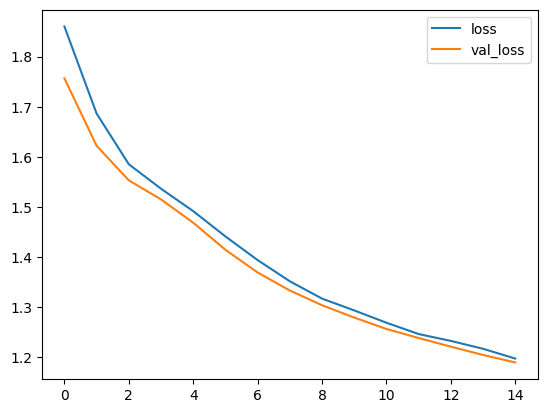

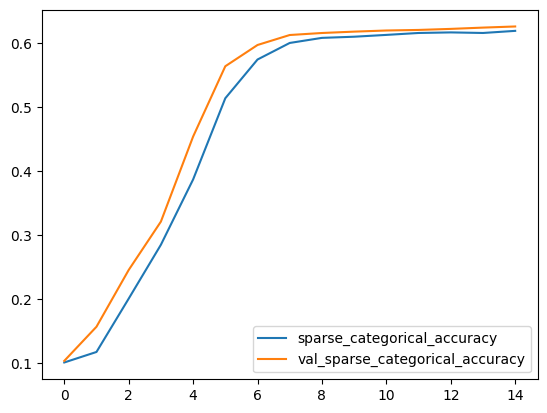

In [28]:
# create learning curves to evaluate model performance
history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['sparse_categorical_accuracy', 'val_sparse_categorical_accuracy']].plot();

# Making predictions
Now that we've trained our model we can use it to make predictions! 

In [29]:
# this code will convert our test image data to a float32 
def to_float32(image, label):
    return tf.cast(image, tf.float32), label

In [30]:
test_ds = get_test_dataset(ordered=True) 
test_ds = test_ds.map(to_float32)

print('Computing predictions...')
test_images_ds = testing_dataset
test_images_ds = test_ds.map(lambda image, idnum: image)
probabilities = model.predict(test_images_ds)
predictions = np.argmax(probabilities, axis=-1)
print(predictions)

Computing predictions...


I0000 00:00:1756291731.784062      74 encapsulate_tpu_computations_pass.cc:266] Subgraph fingerprint:11650889326868473215


E0000 00:00:1756291731.959624      74 meta_optimizer.cc:966] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node sequential_1/dense_1/BiasAdd/ReadVariableOp.


W0000 00:00:1756291732.120821      74 loop_optimizer.cc:933] Skipping loop optimization for Merge node with control input: cond/branch_executed/_8


I0000 00:00:1756291732.477800     890 tpu_compilation_cache_interface.cc:442] TPU host compilation cache miss: cache_key(13353082556875013946), session_name()


I0000 00:00:1756291740.590142     890 tpu_compile_op_common.cc:245] Compilation of 13353082556875013946 with session name  took 8.11228394s and succeeded


I0000 00:00:1756291740.601879     890 tpu_compilation_cache_interface.cc:476] TPU host compilation cache: compilation complete for cache_key(13353082556875013946), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_data_distributed_11650889326868473215", property.function_library_fingerprint = 3345561525678123500, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topology.wrap().x = false, topology.wrap().y = false, topology.wrap().z = false, std::string(property.shapes_prefix) = "2,512,512,3,;", property.guaranteed_constants_size = 0, embedding_partitions_fingerprint = "1688352644216761960")
I0000 00:00:1756291740.601913     890 tpu_compilation_cache_interface.cc:542] After adding entry for key 13353082556875013946 with session_name  cache is 3 entries (70145438 bytes),  marked for eviction 0 entries (0 bytes).


      1/Unknown 11s 11s/step

/usr/local/lib/python3.10/site-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step


[3]


# Creating a submission file
Now that we've trained a model and made predictions we're ready to submit to the competition! You can run the following code below to get your submission file.

In [31]:
print('Generating submission.csv file...')
test_ids_ds = test_ds.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U') # all in one batch
np.savetxt('submission.csv', np.rec.fromarrays([test_ids, predictions]), fmt=['%s', '%d'], delimiter=',', header='image_id,label', comments='')
!head submission.csv

Generating submission.csv file...


image_id,label
2216849948.jpg,3


Be aware that because this is a code competition with a hidden test set, internet and TPUs cannot be enabled on your submission notebook. Therefore TPUs will only be available for training models. For a walk-through on how to train on TPUs and run inference/submit on GPUs, see our [TPU Docs](https://www.kaggle.com/docs/tpu#tpu6).